# Import Module

In [1]:
# Computational modules 
%matplotlib inline
import xarray as xr
import glob
import os
import numpy as np
import netCDF4
from netCDF4 import Dataset
import pandas as pd
import re
from array import array
from pylab import *
#import geopandas
from eofs.xarray import Eof
from eofs.multivariate.standard import MultivariateEof

# Plotting modules 
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
import pandas.plotting
import matplotlib.ticker as ticker
import seaborn as sns
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import BoundaryNorm

# Scikit-learn
from sklearn import linear_model
from sklearn.linear_model import LassoCV, LassoLarsCV, LassoLarsIC
from sklearn.linear_model import Lasso
from sklearn.metrics import r2_score
from sklearn import preprocessing
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.neural_network import MLPRegressor
from scipy.optimize import minimize
from scipy.optimize import dual_annealing
from sklearn.decomposition import PCA

# Settings

### Variables

In [2]:
variables = ['psl']
variable = 'psl'
TITLE = 'Sea Level Pressure'
ylabel = '$E_{psl}$ ($Pa$)'

### Paths

In [3]:
path_official='/data/scratch/globc/peatier/CMIP6/CNRM-CM6-1/CFMIP/amip/'
path_PPE='/data/scratch/globc/peatier/CNRM-CM6-1_PPE/'
path_files='/data/home/globc/peatier/CNRMppe/PPE/ENSEMBLE2/files/'

### List of members

In [4]:
nb_p_list = ['p311', 'p312', 'p314', 'p316',
                    'p317', 'p319', 'p320', 'p321', 'p322', 'p324', 'p325', 'p326', 
                    'p329', 'p330', 'p331', 'p332', 'p335', 'p336', 'p337' ,'p338', 
                    'p340', 'p341', 'p343', 'p344', 'p346', 'p347', 'p348', 'p349', 
                    'p350', 'p353', 'p355', 'p357', 'p359', 'p360', 
                    'p361', 'p363', 'p365', 'p367', 'p368', 'p369', 
                    'p372', 'p373', 'p374', 'p375', 'p376', 'p378', 'p381', 'p382', 
                    'p384', 'p386', 'p388', 'p389', 'p391', 'p392', 'p393', 
                    'p394', 'p395', 'p396', 'p398', 'p399', 'p400', 'p404', 
                    'p406', 'p407', 'p409', 'p410', 'p411', 'p412',
                    'p414','p416',
                    'p413','p419','p424','p426','p428','p421','p423',
                    'p425','p427','p429','p430','p436','p438','p431','p433',
                    'p442','p446','p443','p445','p447',
                    'p452','p454','p456','p458','p457','p459',
                    'p460','p465','p467','p469',
                    'p470','p471']

len(nb_p_list)

102

## Get the PPE pc

In [5]:
pc_PPE = pd.DataFrame()

for i in range(1,101,1) :
    tmp = np.load(file=path_files+'npy/CNRMppe_decomposition_EOF'+str(i)+'pc_'+str(variable)+'.npy')
    pc_PPE['modes_'+str(i)] = tmp
    
pc_PPE    

,modes_1,modes_2,modes_3,modes_4,modes_5,modes_6,modes_7,modes_8,modes_9,modes_10,...,modes_91,modes_92,modes_93,modes_94,modes_95,modes_96,modes_97,modes_98,modes_99,modes_100
0,-13772.204102,-11367.489258,1422.514038,-5900.261230,-4692.612793,-464.508972,-1931.737427,-2277.151855,-1219.259399,558.834412,...,247.437775,-39.021179,-55.436081,-245.435211,19.326725,37.204636,-88.037285,-104.457863,34.052391,-22.569639
1,1256.163940,5312.273926,-4630.919434,-1906.577881,992.200928,-250.476746,3018.565186,-1588.846680,-702.359009,1114.537476,...,-147.125336,92.087654,119.214424,59.799355,-57.124107,-18.972839,-69.159523,0.041943,-248.687668,-176.423569
2,-2417.688477,1348.464233,-2660.327393,-1214.498413,545.039551,-2625.174805,509.115387,741.530457,1097.513550,976.032288,...,-74.918663,112.797905,-61.368195,-211.630585,-35.636154,-108.606354,-22.013353,-144.167130,-190.971237,-20.202269
3,-20490.431641,7264.631836,-4202.576172,-1728.640503,484.539276,1931.333374,996.229553,1167.130859,2160.122803,3159.638184,...,61.461643,-68.545944,-59.289093,-27.091013,57.368355,69.756546,179.505600,-37.613541,26.512068,46.747078
4,-13527.416992,-3961.074219,8394.706055,-1906.425781,1887.195068,-2648.859863,-1083.932251,542.345154,533.618652,1942.120605,...,140.652252,34.705067,67.445488,47.603443,-208.774628,99.519127,77.365471,-49.554073,108.424461,-35.472145
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
97,-2691.015381,9723.368164,1581.260010,1224.988525,3729.328369,1591.198730,1405.100952,-312.921814,-1290.076050,-2746.940918,...,20.722260,21.017015,39.881271,15.054241,41.918861,-1.364128,-18.801437,51.620548,-29.555441,129.882614
98,22557.742188,4696.820801,6996.410156,-510.862610,1795.499390,1723.183350,-822.245483,-3822.704834,-535.556213,-55.518158,...,54.428978,-97.582611,229.101257,61.822884,28.327724,64.287186,48.272488,-16.257860,-15.964396,-87.334427
99,35928.593750,8327.411133,1368.181641,-2925.680664,-735.084595,-1200.657104,1933.730347,-3636.713867,-1031.548828,-277.708008,...,-108.041229,-48.847191,-77.077103,49.216713,207.549103,57.954220,30.763227,5.060608,-11.668889,38.886040
100,18794.226562,7523.140137,-2326.258789,-1056.700195,983.506897,-6222.553711,978.303223,-2113.002686,2526.873535,-327.647583,...,-70.770645,-163.138626,63.422855,-104.668373,22.253803,105.791939,116.988792,131.747543,123.869171,-24.832222


## Emulation

In [12]:
def MultiLinReg(limit_train, EOF_nb, x, variable) :
    X = np.load(file="/data/home/globc/peatier/CNRMppe/PPE/ENSEMBLE2/files/npy/X_EmulateurFeedbacksN.npy")
    y = np.load(file=path_files+'npy/CNRMppe_decomposition_EOF'+str(EOF_nb)+'pc_'+str(variable)+'.npy')
    param_names = np.load(file="/data/home/globc/peatier/CNRMppe/PPE/ENSEMBLE2/files/npy/LHS_paramNames.npy")
    
    # Let's use the model equation : 

    X_df = pd.DataFrame(data=X)
    regr = linear_model.LinearRegression()
    regr.fit(X[0:limit_train], y[0:limit_train])
    R = regr.intercept_
    Coeffs = pd.DataFrame([regr.coef_]*30, columns=param_names).iloc[0]
    print(Coeffs)
    tmp = Coeffs.values*x
    y_pred = tmp.sum()+R
    
    return y_pred

In [13]:
X = np.load(file="/data/home/globc/peatier/CNRMppe/PPE/ENSEMBLE2/files/npy/X_EmulateurFeedbacksN.npy")
pc_OS={}
pc={}


def predict_OS(X, EOF_nb) :
    tmp_list = []
    for x in X[80:] :
        tmp = MultiLinReg(80, EOF_nb, x, variable)
        tmp_list.append(tmp)
    return tmp_list

def predict_train(X, EOF_nb) :
    tmp_list = []
    for x in X[:80] :
        tmp = MultiLinReg(80, EOF_nb, x, variable)
        tmp_list.append(tmp)
    return tmp_list
    
for i in range(1,101,1) : 
    pc_OS['modes_'+str(i)] = predict_OS(X, i)
    pc['modes_'+str(i)] = predict_train(X,i)

#pc_pred

AKN           -14883.693484
ALPHAT         -6561.411785
ALD           -11547.352942
ALMAVE            74.255002
AGREF           1998.812396
AGRE1          -4157.223080
AGRE2           -533.830497
RAUTEFR         -207.480772
RQLCR          -2550.238728
RAUTEFS        -2950.612821
RQICRMIN        2947.523947
RQICRMAX         181.634298
TFVL            -926.096198
TFVI           -1842.326666
TFVR            3995.632611
TFVS            -814.686981
RKDN            -992.827305
RKDX            -517.435484
TENTR          -1026.992103
TENTRX          1675.308030
VVN              909.113005
VVX             1069.901359
ALFX           -2766.508851
FNEBC           -535.074498
GCTURB          -269.009096
RLWINHF_ICE    -1585.475065
RLWINHF_LIQ    -1203.842315
RSWINHF_ICE      396.982312
RSWINHF_LIQ    -2215.530508
REFLCAPE       -2585.066094
Name: 0, dtype: float64
AKN           -14883.693484
ALPHAT         -6561.411785
ALD           -11547.352942
ALMAVE            74.255002
AGREF           1998.812

AKN           -14883.693484
ALPHAT         -6561.411785
ALD           -11547.352942
ALMAVE            74.255002
AGREF           1998.812396
AGRE1          -4157.223080
AGRE2           -533.830497
RAUTEFR         -207.480772
RQLCR          -2550.238728
RAUTEFS        -2950.612821
RQICRMIN        2947.523947
RQICRMAX         181.634298
TFVL            -926.096198
TFVI           -1842.326666
TFVR            3995.632611
TFVS            -814.686981
RKDN            -992.827305
RKDX            -517.435484
TENTR          -1026.992103
TENTRX          1675.308030
VVN              909.113005
VVX             1069.901359
ALFX           -2766.508851
FNEBC           -535.074498
GCTURB          -269.009096
RLWINHF_ICE    -1585.475065
RLWINHF_LIQ    -1203.842315
RSWINHF_ICE      396.982312
RSWINHF_LIQ    -2215.530508
REFLCAPE       -2585.066094
Name: 0, dtype: float64
AKN           -14883.693484
ALPHAT         -6561.411785
ALD           -11547.352942
ALMAVE            74.255002
AGREF           1998.812

AKN           -1460.085338
ALPHAT          100.638680
ALD             477.689610
ALMAVE         -180.510924
AGREF           -46.658513
AGRE1          -535.593576
AGRE2           762.931791
RAUTEFR        -523.621521
RQLCR           417.644644
RAUTEFS         -71.224794
RQICRMIN      -1631.696556
RQICRMAX        996.859324
TFVL            496.263014
TFVI            735.702461
TFVR          -1149.661108
TFVS            521.750333
RKDN            654.128576
RKDX            387.943000
TENTR           431.708214
TENTRX         -676.551111
VVN              -1.275983
VVX             -11.616438
ALFX           1710.600964
FNEBC          1275.721155
GCTURB           18.703918
RLWINHF_ICE     445.730428
RLWINHF_LIQ    -397.607821
RSWINHF_ICE     583.658645
RSWINHF_LIQ    1828.387524
REFLCAPE        797.423868
Name: 0, dtype: float64
AKN           -1460.085338
ALPHAT          100.638680
ALD             477.689610
ALMAVE         -180.510924
AGREF           -46.658513
AGRE1          -535.593576
AGRE

AKN           -1460.085338
ALPHAT          100.638680
ALD             477.689610
ALMAVE         -180.510924
AGREF           -46.658513
AGRE1          -535.593576
AGRE2           762.931791
RAUTEFR        -523.621521
RQLCR           417.644644
RAUTEFS         -71.224794
RQICRMIN      -1631.696556
RQICRMAX        996.859324
TFVL            496.263014
TFVI            735.702461
TFVR          -1149.661108
TFVS            521.750333
RKDN            654.128576
RKDX            387.943000
TENTR           431.708214
TENTRX         -676.551111
VVN              -1.275983
VVX             -11.616438
ALFX           1710.600964
FNEBC          1275.721155
GCTURB           18.703918
RLWINHF_ICE     445.730428
RLWINHF_LIQ    -397.607821
RSWINHF_ICE     583.658645
RSWINHF_LIQ    1828.387524
REFLCAPE        797.423868
Name: 0, dtype: float64
AKN           -1460.085338
ALPHAT          100.638680
ALD             477.689610
ALMAVE         -180.510924
AGREF           -46.658513
AGRE1          -535.593576
AGRE

AKN            1282.595358
ALPHAT        -1014.965051
ALD             789.152463
ALMAVE         -858.175652
AGREF           245.024817
AGRE1         -1689.418720
AGRE2            15.796074
RAUTEFR         352.197217
RQLCR         -1309.920076
RAUTEFS        -218.369723
RQICRMIN        206.001107
RQICRMAX        474.057286
TFVL           -996.836719
TFVI           -544.251938
TFVR            743.271586
TFVS            471.925712
RKDN           -219.589131
RKDX           -527.074231
TENTR          -199.374759
TENTRX          153.388334
VVN               8.566485
VVX             683.090639
ALFX           -837.871481
FNEBC           -51.741747
GCTURB          305.477962
RLWINHF_ICE     428.024783
RLWINHF_LIQ    -563.337014
RSWINHF_ICE     629.750082
RSWINHF_LIQ    -927.641725
REFLCAPE       -432.236762
Name: 0, dtype: float64
AKN            1282.595358
ALPHAT        -1014.965051
ALD             789.152463
ALMAVE         -858.175652
AGREF           245.024817
AGRE1         -1689.418720
AGRE

AKN            1282.595358
ALPHAT        -1014.965051
ALD             789.152463
ALMAVE         -858.175652
AGREF           245.024817
AGRE1         -1689.418720
AGRE2            15.796074
RAUTEFR         352.197217
RQLCR         -1309.920076
RAUTEFS        -218.369723
RQICRMIN        206.001107
RQICRMAX        474.057286
TFVL           -996.836719
TFVI           -544.251938
TFVR            743.271586
TFVS            471.925712
RKDN           -219.589131
RKDX           -527.074231
TENTR          -199.374759
TENTRX          153.388334
VVN               8.566485
VVX             683.090639
ALFX           -837.871481
FNEBC           -51.741747
GCTURB          305.477962
RLWINHF_ICE     428.024783
RLWINHF_LIQ    -563.337014
RSWINHF_ICE     629.750082
RSWINHF_LIQ    -927.641725
REFLCAPE       -432.236762
Name: 0, dtype: float64
AKN            1282.595358
ALPHAT        -1014.965051
ALD             789.152463
ALMAVE         -858.175652
AGREF           245.024817
AGRE1         -1689.418720
AGRE

AKN            -889.663037
ALPHAT         -349.520136
ALD              15.511279
ALMAVE         -564.116807
AGREF          -110.914024
AGRE1           440.789403
AGRE2           -65.193218
RAUTEFR          62.646722
RQLCR            23.385561
RAUTEFS          48.520516
RQICRMIN       -800.988485
RQICRMAX        737.611472
TFVL           -211.980571
TFVI            291.231571
TFVR            221.834495
TFVS            143.212955
RKDN            372.290085
RKDX            -29.293582
TENTR           643.547135
TENTRX         -440.471925
VVN            -116.878415
VVX              59.421937
ALFX            168.605707
FNEBC         -1386.352944
GCTURB           -6.038240
RLWINHF_ICE     929.631606
RLWINHF_LIQ     480.990461
RSWINHF_ICE    -109.610532
RSWINHF_LIQ    -428.771434
REFLCAPE       -162.735919
Name: 0, dtype: float64
AKN            -889.663037
ALPHAT         -349.520136
ALD              15.511279
ALMAVE         -564.116807
AGREF          -110.914024
AGRE1           440.789403
AGRE

AKN            -889.663037
ALPHAT         -349.520136
ALD              15.511279
ALMAVE         -564.116807
AGREF          -110.914024
AGRE1           440.789403
AGRE2           -65.193218
RAUTEFR          62.646722
RQLCR            23.385561
RAUTEFS          48.520516
RQICRMIN       -800.988485
RQICRMAX        737.611472
TFVL           -211.980571
TFVI            291.231571
TFVR            221.834495
TFVS            143.212955
RKDN            372.290085
RKDX            -29.293582
TENTR           643.547135
TENTRX         -440.471925
VVN            -116.878415
VVX              59.421937
ALFX            168.605707
FNEBC         -1386.352944
GCTURB           -6.038240
RLWINHF_ICE     929.631606
RLWINHF_LIQ     480.990461
RSWINHF_ICE    -109.610532
RSWINHF_LIQ    -428.771434
REFLCAPE       -162.735919
Name: 0, dtype: float64
AKN            -889.663037
ALPHAT         -349.520136
ALD              15.511279
ALMAVE         -564.116807
AGREF          -110.914024
AGRE1           440.789403
AGRE

AKN             41.757706
ALPHAT        -406.023005
ALD           -326.394039
ALMAVE        -108.430343
AGREF         -314.333194
AGRE1         -459.797170
AGRE2         -154.611459
RAUTEFR        162.347635
RQLCR          335.567908
RAUTEFS        545.035160
RQICRMIN       173.907562
RQICRMAX      -163.609047
TFVL           985.570243
TFVI           435.193424
TFVR          -641.610327
TFVS          -236.893220
RKDN           124.628275
RKDX          -809.418769
TENTR         -141.581440
TENTRX        -674.575502
VVN            317.294363
VVX            654.238830
ALFX          -339.649327
FNEBC         -464.075001
GCTURB        -313.873419
RLWINHF_ICE    173.588642
RLWINHF_LIQ    -36.254740
RSWINHF_ICE    206.811313
RSWINHF_LIQ   -216.632100
REFLCAPE      -572.162548
Name: 0, dtype: float64
AKN             41.757706
ALPHAT        -406.023005
ALD           -326.394039
ALMAVE        -108.430343
AGREF         -314.333194
AGRE1         -459.797170
AGRE2         -154.611459
RAUTEFR       

AKN             41.757706
ALPHAT        -406.023005
ALD           -326.394039
ALMAVE        -108.430343
AGREF         -314.333194
AGRE1         -459.797170
AGRE2         -154.611459
RAUTEFR        162.347635
RQLCR          335.567908
RAUTEFS        545.035160
RQICRMIN       173.907562
RQICRMAX      -163.609047
TFVL           985.570243
TFVI           435.193424
TFVR          -641.610327
TFVS          -236.893220
RKDN           124.628275
RKDX          -809.418769
TENTR         -141.581440
TENTRX        -674.575502
VVN            317.294363
VVX            654.238830
ALFX          -339.649327
FNEBC         -464.075001
GCTURB        -313.873419
RLWINHF_ICE    173.588642
RLWINHF_LIQ    -36.254740
RSWINHF_ICE    206.811313
RSWINHF_LIQ   -216.632100
REFLCAPE      -572.162548
Name: 0, dtype: float64
AKN             41.757706
ALPHAT        -406.023005
ALD           -326.394039
ALMAVE        -108.430343
AGREF         -314.333194
AGRE1         -459.797170
AGRE2         -154.611459
RAUTEFR       

AKN            206.884470
ALPHAT        -129.745999
ALD            -18.285043
ALMAVE        -200.606933
AGREF          186.189540
AGRE1          316.983228
AGRE2           87.197646
RAUTEFR       -210.855311
RQLCR         -316.110342
RAUTEFS       -951.462486
RQICRMIN       385.078480
RQICRMAX       247.059877
TFVL          -172.602584
TFVI          -250.863771
TFVR          -154.472693
TFVS            35.786536
RKDN           434.351123
RKDX           465.952877
TENTR           76.371868
TENTRX        -137.297417
VVN            403.295100
VVX             69.712510
ALFX            63.381847
FNEBC         -271.775234
GCTURB         -46.100069
RLWINHF_ICE    -99.123146
RLWINHF_LIQ   -332.887966
RSWINHF_ICE    200.412625
RSWINHF_LIQ    477.482421
REFLCAPE       216.816083
Name: 0, dtype: float64
AKN            206.884470
ALPHAT        -129.745999
ALD            -18.285043
ALMAVE        -200.606933
AGREF          186.189540
AGRE1          316.983228
AGRE2           87.197646
RAUTEFR       

AKN            206.884470
ALPHAT        -129.745999
ALD            -18.285043
ALMAVE        -200.606933
AGREF          186.189540
AGRE1          316.983228
AGRE2           87.197646
RAUTEFR       -210.855311
RQLCR         -316.110342
RAUTEFS       -951.462486
RQICRMIN       385.078480
RQICRMAX       247.059877
TFVL          -172.602584
TFVI          -250.863771
TFVR          -154.472693
TFVS            35.786536
RKDN           434.351123
RKDX           465.952877
TENTR           76.371868
TENTRX        -137.297417
VVN            403.295100
VVX             69.712510
ALFX            63.381847
FNEBC         -271.775234
GCTURB         -46.100069
RLWINHF_ICE    -99.123146
RLWINHF_LIQ   -332.887966
RSWINHF_ICE    200.412625
RSWINHF_LIQ    477.482421
REFLCAPE       216.816083
Name: 0, dtype: float64
AKN            206.884470
ALPHAT        -129.745999
ALD            -18.285043
ALMAVE        -200.606933
AGREF          186.189540
AGRE1          316.983228
AGRE2           87.197646
RAUTEFR       

AKN           -260.516841
ALPHAT         173.795844
ALD           -184.424958
ALMAVE        -493.700390
AGREF         -251.957250
AGRE1          224.076797
AGRE2         -169.247733
RAUTEFR        243.226278
RQLCR         -310.008309
RAUTEFS        512.863495
RQICRMIN       -99.237934
RQICRMAX       148.547509
TFVL           126.656650
TFVI           292.498217
TFVR           207.089997
TFVS             5.241744
RKDN          -142.494398
RKDX           748.136588
TENTR         -337.749509
TENTRX         332.792529
VVN           -329.842332
VVX           -257.590490
ALFX           697.541250
FNEBC         -156.129080
GCTURB        -165.077634
RLWINHF_ICE    137.284479
RLWINHF_LIQ    287.606568
RSWINHF_ICE     89.736164
RSWINHF_LIQ   -191.024870
REFLCAPE      -165.102837
Name: 0, dtype: float64
AKN           -260.516841
ALPHAT         173.795844
ALD           -184.424958
ALMAVE        -493.700390
AGREF         -251.957250
AGRE1          224.076797
AGRE2         -169.247733
RAUTEFR       

AKN           -260.516841
ALPHAT         173.795844
ALD           -184.424958
ALMAVE        -493.700390
AGREF         -251.957250
AGRE1          224.076797
AGRE2         -169.247733
RAUTEFR        243.226278
RQLCR         -310.008309
RAUTEFS        512.863495
RQICRMIN       -99.237934
RQICRMAX       148.547509
TFVL           126.656650
TFVI           292.498217
TFVR           207.089997
TFVS             5.241744
RKDN          -142.494398
RKDX           748.136588
TENTR         -337.749509
TENTRX         332.792529
VVN           -329.842332
VVX           -257.590490
ALFX           697.541250
FNEBC         -156.129080
GCTURB        -165.077634
RLWINHF_ICE    137.284479
RLWINHF_LIQ    287.606568
RSWINHF_ICE     89.736164
RSWINHF_LIQ   -191.024870
REFLCAPE      -165.102837
Name: 0, dtype: float64
AKN           -260.516841
ALPHAT         173.795844
ALD           -184.424958
ALMAVE        -493.700390
AGREF         -251.957250
AGRE1          224.076797
AGRE2         -169.247733
RAUTEFR       

AKN            -12.438496
ALPHAT        -505.498858
ALD           -118.809344
ALMAVE        -238.523907
AGREF           28.868522
AGRE1           -9.905010
AGRE2          -18.797700
RAUTEFR        375.687760
RQLCR           67.592901
RAUTEFS          7.573171
RQICRMIN       -90.336022
RQICRMAX       -59.803289
TFVL          -128.922027
TFVI           417.306318
TFVR           -90.099366
TFVS           209.794683
RKDN           199.399486
RKDX           473.574090
TENTR          -83.140110
TENTRX         101.149808
VVN           -349.492378
VVX            -79.235388
ALFX           -89.116214
FNEBC           37.351124
GCTURB         221.507242
RLWINHF_ICE   -490.484733
RLWINHF_LIQ    -28.979249
RSWINHF_ICE    629.681870
RSWINHF_LIQ    423.847830
REFLCAPE      -150.721945
Name: 0, dtype: float64
AKN            -12.438496
ALPHAT        -505.498858
ALD           -118.809344
ALMAVE        -238.523907
AGREF           28.868522
AGRE1           -9.905010
AGRE2          -18.797700
RAUTEFR       

AKN            -12.438496
ALPHAT        -505.498858
ALD           -118.809344
ALMAVE        -238.523907
AGREF           28.868522
AGRE1           -9.905010
AGRE2          -18.797700
RAUTEFR        375.687760
RQLCR           67.592901
RAUTEFS          7.573171
RQICRMIN       -90.336022
RQICRMAX       -59.803289
TFVL          -128.922027
TFVI           417.306318
TFVR           -90.099366
TFVS           209.794683
RKDN           199.399486
RKDX           473.574090
TENTR          -83.140110
TENTRX         101.149808
VVN           -349.492378
VVX            -79.235388
ALFX           -89.116214
FNEBC           37.351124
GCTURB         221.507242
RLWINHF_ICE   -490.484733
RLWINHF_LIQ    -28.979249
RSWINHF_ICE    629.681870
RSWINHF_LIQ    423.847830
REFLCAPE      -150.721945
Name: 0, dtype: float64
AKN            -12.438496
ALPHAT        -505.498858
ALD           -118.809344
ALMAVE        -238.523907
AGREF           28.868522
AGRE1           -9.905010
AGRE2          -18.797700
RAUTEFR       

AKN            408.304344
ALPHAT        -440.682672
ALD            -47.388400
ALMAVE         552.810923
AGREF           73.227589
AGRE1         -400.648854
AGRE2           61.987159
RAUTEFR         69.482194
RQLCR          317.293456
RAUTEFS         55.867973
RQICRMIN       181.644088
RQICRMAX       173.721752
TFVL           301.160016
TFVI          -151.661612
TFVR           141.936950
TFVS           398.804787
RKDN            97.553232
RKDX            52.204253
TENTR         -311.781933
TENTRX          62.714355
VVN             -9.631569
VVX           -292.991670
ALFX           284.603516
FNEBC         -270.188106
GCTURB          41.463757
RLWINHF_ICE     83.711437
RLWINHF_LIQ   -114.913020
RSWINHF_ICE   -155.921560
RSWINHF_LIQ    180.086824
REFLCAPE       588.021816
Name: 0, dtype: float64
AKN            408.304344
ALPHAT        -440.682672
ALD            -47.388400
ALMAVE         552.810923
AGREF           73.227589
AGRE1         -400.648854
AGRE2           61.987159
RAUTEFR       

AKN            408.304344
ALPHAT        -440.682672
ALD            -47.388400
ALMAVE         552.810923
AGREF           73.227589
AGRE1         -400.648854
AGRE2           61.987159
RAUTEFR         69.482194
RQLCR          317.293456
RAUTEFS         55.867973
RQICRMIN       181.644088
RQICRMAX       173.721752
TFVL           301.160016
TFVI          -151.661612
TFVR           141.936950
TFVS           398.804787
RKDN            97.553232
RKDX            52.204253
TENTR         -311.781933
TENTRX          62.714355
VVN             -9.631569
VVX           -292.991670
ALFX           284.603516
FNEBC         -270.188106
GCTURB          41.463757
RLWINHF_ICE     83.711437
RLWINHF_LIQ   -114.913020
RSWINHF_ICE   -155.921560
RSWINHF_LIQ    180.086824
REFLCAPE       588.021816
Name: 0, dtype: float64
AKN            408.304344
ALPHAT        -440.682672
ALD            -47.388400
ALMAVE         552.810923
AGREF           73.227589
AGRE1         -400.648854
AGRE2           61.987159
RAUTEFR       

AKN           -283.661465
ALPHAT          23.629941
ALD             12.459957
ALMAVE        -849.210071
AGREF         -109.295223
AGRE1          737.790474
AGRE2         -248.499965
RAUTEFR        289.497632
RQLCR          205.456292
RAUTEFS         13.542508
RQICRMIN      -365.991073
RQICRMAX        62.728920
TFVL           103.497611
TFVI           164.695034
TFVR           703.813393
TFVS           360.681062
RKDN            60.157046
RKDX          -296.244643
TENTR         -458.752373
TENTRX         130.741645
VVN            264.486068
VVX            124.347258
ALFX          -237.888245
FNEBC         -279.436049
GCTURB         -73.861335
RLWINHF_ICE   -725.784209
RLWINHF_LIQ   -179.437714
RSWINHF_ICE    226.743843
RSWINHF_LIQ    -52.691074
REFLCAPE      -642.929346
Name: 0, dtype: float64
AKN           -283.661465
ALPHAT          23.629941
ALD             12.459957
ALMAVE        -849.210071
AGREF         -109.295223
AGRE1          737.790474
AGRE2         -248.499965
RAUTEFR       

AKN           -283.661465
ALPHAT          23.629941
ALD             12.459957
ALMAVE        -849.210071
AGREF         -109.295223
AGRE1          737.790474
AGRE2         -248.499965
RAUTEFR        289.497632
RQLCR          205.456292
RAUTEFS         13.542508
RQICRMIN      -365.991073
RQICRMAX        62.728920
TFVL           103.497611
TFVI           164.695034
TFVR           703.813393
TFVS           360.681062
RKDN            60.157046
RKDX          -296.244643
TENTR         -458.752373
TENTRX         130.741645
VVN            264.486068
VVX            124.347258
ALFX          -237.888245
FNEBC         -279.436049
GCTURB         -73.861335
RLWINHF_ICE   -725.784209
RLWINHF_LIQ   -179.437714
RSWINHF_ICE    226.743843
RSWINHF_LIQ    -52.691074
REFLCAPE      -642.929346
Name: 0, dtype: float64
AKN           -283.661465
ALPHAT          23.629941
ALD             12.459957
ALMAVE        -849.210071
AGREF         -109.295223
AGRE1          737.790474
AGRE2         -248.499965
RAUTEFR       

AKN            112.227891
ALPHAT        -387.842900
ALD            147.675985
ALMAVE        -194.881773
AGREF          -29.453406
AGRE1         -139.512039
AGRE2          152.660506
RAUTEFR        -61.758793
RQLCR          -67.442514
RAUTEFS         47.489079
RQICRMIN      -138.509118
RQICRMAX      -488.771631
TFVL           -23.015756
TFVI            14.887180
TFVR            14.690538
TFVS          -109.585593
RKDN          -276.017149
RKDX          -152.114432
TENTR          107.888933
TENTRX        -110.757573
VVN            472.054006
VVX            120.530265
ALFX            54.135817
FNEBC           81.241729
GCTURB        -199.732425
RLWINHF_ICE      5.997484
RLWINHF_LIQ     -1.581558
RSWINHF_ICE    -63.003127
RSWINHF_LIQ     35.605225
REFLCAPE       201.280411
Name: 0, dtype: float64
AKN            112.227891
ALPHAT        -387.842900
ALD            147.675985
ALMAVE        -194.881773
AGREF          -29.453406
AGRE1         -139.512039
AGRE2          152.660506
RAUTEFR       

AKN            112.227891
ALPHAT        -387.842900
ALD            147.675985
ALMAVE        -194.881773
AGREF          -29.453406
AGRE1         -139.512039
AGRE2          152.660506
RAUTEFR        -61.758793
RQLCR          -67.442514
RAUTEFS         47.489079
RQICRMIN      -138.509118
RQICRMAX      -488.771631
TFVL           -23.015756
TFVI            14.887180
TFVR            14.690538
TFVS          -109.585593
RKDN          -276.017149
RKDX          -152.114432
TENTR          107.888933
TENTRX        -110.757573
VVN            472.054006
VVX            120.530265
ALFX            54.135817
FNEBC           81.241729
GCTURB        -199.732425
RLWINHF_ICE      5.997484
RLWINHF_LIQ     -1.581558
RSWINHF_ICE    -63.003127
RSWINHF_LIQ     35.605225
REFLCAPE       201.280411
Name: 0, dtype: float64
AKN            112.227891
ALPHAT        -387.842900
ALD            147.675985
ALMAVE        -194.881773
AGREF          -29.453406
AGRE1         -139.512039
AGRE2          152.660506
RAUTEFR       

AKN            288.154495
ALPHAT         200.733272
ALD           -252.804731
ALMAVE         192.456386
AGREF          334.830635
AGRE1         -234.008154
AGRE2           96.570043
RAUTEFR       -265.128316
RQLCR          185.805311
RAUTEFS        112.606766
RQICRMIN       180.549706
RQICRMAX       112.942666
TFVL          -451.351391
TFVI           176.076664
TFVR           418.357290
TFVS            94.499457
RKDN          -190.000328
RKDX          -132.397567
TENTR          165.800781
TENTRX         -89.370128
VVN            168.134279
VVX            477.507098
ALFX             0.195468
FNEBC          -20.477225
GCTURB        -110.055560
RLWINHF_ICE   -233.911341
RLWINHF_LIQ   -117.500275
RSWINHF_ICE    118.134049
RSWINHF_LIQ    453.580003
REFLCAPE        90.022104
Name: 0, dtype: float64
AKN            288.154495
ALPHAT         200.733272
ALD           -252.804731
ALMAVE         192.456386
AGREF          334.830635
AGRE1         -234.008154
AGRE2           96.570043
RAUTEFR       

AKN            288.154495
ALPHAT         200.733272
ALD           -252.804731
ALMAVE         192.456386
AGREF          334.830635
AGRE1         -234.008154
AGRE2           96.570043
RAUTEFR       -265.128316
RQLCR          185.805311
RAUTEFS        112.606766
RQICRMIN       180.549706
RQICRMAX       112.942666
TFVL          -451.351391
TFVI           176.076664
TFVR           418.357290
TFVS            94.499457
RKDN          -190.000328
RKDX          -132.397567
TENTR          165.800781
TENTRX         -89.370128
VVN            168.134279
VVX            477.507098
ALFX             0.195468
FNEBC          -20.477225
GCTURB        -110.055560
RLWINHF_ICE   -233.911341
RLWINHF_LIQ   -117.500275
RSWINHF_ICE    118.134049
RSWINHF_LIQ    453.580003
REFLCAPE        90.022104
Name: 0, dtype: float64
AKN            288.154495
ALPHAT         200.733272
ALD           -252.804731
ALMAVE         192.456386
AGREF          334.830635
AGRE1         -234.008154
AGRE2           96.570043
RAUTEFR       

AKN            -93.816289
ALPHAT          35.551212
ALD           -109.688138
ALMAVE           0.179169
AGREF          313.317378
AGRE1         -186.252764
AGRE2          274.209694
RAUTEFR       -221.011045
RQLCR           75.457505
RAUTEFS        268.988244
RQICRMIN       -65.688493
RQICRMAX      -208.711282
TFVL           -77.636079
TFVI          -434.740640
TFVR          -244.406134
TFVS           -63.777596
RKDN            93.247410
RKDX           -48.280622
TENTR           51.193921
TENTRX        -150.251479
VVN           -103.287643
VVX            -83.758964
ALFX          -157.758645
FNEBC         -231.258109
GCTURB        -399.055590
RLWINHF_ICE   -267.479891
RLWINHF_LIQ    206.509159
RSWINHF_ICE   -176.807346
RSWINHF_LIQ   -301.114296
REFLCAPE       369.869811
Name: 0, dtype: float64
AKN            -93.816289
ALPHAT          35.551212
ALD           -109.688138
ALMAVE           0.179169
AGREF          313.317378
AGRE1         -186.252764
AGRE2          274.209694
RAUTEFR       

AKN            -93.816289
ALPHAT          35.551212
ALD           -109.688138
ALMAVE           0.179169
AGREF          313.317378
AGRE1         -186.252764
AGRE2          274.209694
RAUTEFR       -221.011045
RQLCR           75.457505
RAUTEFS        268.988244
RQICRMIN       -65.688493
RQICRMAX      -208.711282
TFVL           -77.636079
TFVI          -434.740640
TFVR          -244.406134
TFVS           -63.777596
RKDN            93.247410
RKDX           -48.280622
TENTR           51.193921
TENTRX        -150.251479
VVN           -103.287643
VVX            -83.758964
ALFX          -157.758645
FNEBC         -231.258109
GCTURB        -399.055590
RLWINHF_ICE   -267.479891
RLWINHF_LIQ    206.509159
RSWINHF_ICE   -176.807346
RSWINHF_LIQ   -301.114296
REFLCAPE       369.869811
Name: 0, dtype: float64
AKN            -93.816289
ALPHAT          35.551212
ALD           -109.688138
ALMAVE           0.179169
AGREF          313.317378
AGRE1         -186.252764
AGRE2          274.209694
RAUTEFR       

AKN            -87.659145
ALPHAT        -174.918098
ALD           -237.661491
ALMAVE         -46.930252
AGREF           30.206679
AGRE1          -21.069310
AGRE2         -147.219795
RAUTEFR        -43.452262
RQLCR         -108.681385
RAUTEFS       -184.813767
RQICRMIN      -151.274563
RQICRMAX      -279.061621
TFVL          -293.729045
TFVI            62.949958
TFVR            21.421071
TFVS            45.631245
RKDN           370.740625
RKDX          -323.912866
TENTR           38.689134
TENTRX        -135.765175
VVN           -246.063428
VVX           -131.315127
ALFX           340.436670
FNEBC          210.589791
GCTURB          70.149828
RLWINHF_ICE    -67.838094
RLWINHF_LIQ      3.153953
RSWINHF_ICE    -77.336454
RSWINHF_LIQ    -73.483260
REFLCAPE       -24.528312
Name: 0, dtype: float64
AKN            -87.659145
ALPHAT        -174.918098
ALD           -237.661491
ALMAVE         -46.930252
AGREF           30.206679
AGRE1          -21.069310
AGRE2         -147.219795
RAUTEFR       

AKN            -87.659145
ALPHAT        -174.918098
ALD           -237.661491
ALMAVE         -46.930252
AGREF           30.206679
AGRE1          -21.069310
AGRE2         -147.219795
RAUTEFR        -43.452262
RQLCR         -108.681385
RAUTEFS       -184.813767
RQICRMIN      -151.274563
RQICRMAX      -279.061621
TFVL          -293.729045
TFVI            62.949958
TFVR            21.421071
TFVS            45.631245
RKDN           370.740625
RKDX          -323.912866
TENTR           38.689134
TENTRX        -135.765175
VVN           -246.063428
VVX           -131.315127
ALFX           340.436670
FNEBC          210.589791
GCTURB          70.149828
RLWINHF_ICE    -67.838094
RLWINHF_LIQ      3.153953
RSWINHF_ICE    -77.336454
RSWINHF_LIQ    -73.483260
REFLCAPE       -24.528312
Name: 0, dtype: float64
AKN            -87.659145
ALPHAT        -174.918098
ALD           -237.661491
ALMAVE         -46.930252
AGREF           30.206679
AGRE1          -21.069310
AGRE2         -147.219795
RAUTEFR       

AKN           -110.382792
ALPHAT         -59.447802
ALD            176.454267
ALMAVE          86.693458
AGREF          -70.890966
AGRE1          -69.938084
AGRE2          289.312474
RAUTEFR       -241.728654
RQLCR          -61.304057
RAUTEFS        -63.199652
RQICRMIN      -265.514062
RQICRMAX      -269.480628
TFVL            97.534884
TFVI           -22.321374
TFVR           -67.070760
TFVS          -184.943053
RKDN           135.884474
RKDX          -112.875887
TENTR           -1.353733
TENTRX        -122.787876
VVN            150.141678
VVX           -125.504904
ALFX          -266.911995
FNEBC          -95.602555
GCTURB        -191.021875
RLWINHF_ICE     -1.542354
RLWINHF_LIQ   -263.259281
RSWINHF_ICE     -1.827264
RSWINHF_LIQ    -38.372486
REFLCAPE      -217.078428
Name: 0, dtype: float64
AKN           -110.382792
ALPHAT         -59.447802
ALD            176.454267
ALMAVE          86.693458
AGREF          -70.890966
AGRE1          -69.938084
AGRE2          289.312474
RAUTEFR       

AKN           -110.382792
ALPHAT         -59.447802
ALD            176.454267
ALMAVE          86.693458
AGREF          -70.890966
AGRE1          -69.938084
AGRE2          289.312474
RAUTEFR       -241.728654
RQLCR          -61.304057
RAUTEFS        -63.199652
RQICRMIN      -265.514062
RQICRMAX      -269.480628
TFVL            97.534884
TFVI           -22.321374
TFVR           -67.070760
TFVS          -184.943053
RKDN           135.884474
RKDX          -112.875887
TENTR           -1.353733
TENTRX        -122.787876
VVN            150.141678
VVX           -125.504904
ALFX          -266.911995
FNEBC          -95.602555
GCTURB        -191.021875
RLWINHF_ICE     -1.542354
RLWINHF_LIQ   -263.259281
RSWINHF_ICE     -1.827264
RSWINHF_LIQ    -38.372486
REFLCAPE      -217.078428
Name: 0, dtype: float64
AKN           -110.382792
ALPHAT         -59.447802
ALD            176.454267
ALMAVE          86.693458
AGREF          -70.890966
AGRE1          -69.938084
AGRE2          289.312474
RAUTEFR       

AKN            199.502250
ALPHAT         228.972713
ALD            179.778343
ALMAVE         126.511756
AGREF         -198.646916
AGRE1           -7.167808
AGRE2         -238.583918
RAUTEFR       -116.250440
RQLCR          -70.281652
RAUTEFS       -139.178675
RQICRMIN      -275.171674
RQICRMAX       162.903370
TFVL          -190.079281
TFVI           172.070089
TFVR           108.517865
TFVS           -95.780363
RKDN          -140.652169
RKDX             4.480576
TENTR          -58.631391
TENTRX        -146.199343
VVN             29.257207
VVX            111.342694
ALFX           108.650911
FNEBC          153.273954
GCTURB         -68.877199
RLWINHF_ICE    -78.799641
RLWINHF_LIQ    248.130466
RSWINHF_ICE    441.768064
RSWINHF_LIQ     94.161094
REFLCAPE       144.113751
Name: 0, dtype: float64
AKN            199.502250
ALPHAT         228.972713
ALD            179.778343
ALMAVE         126.511756
AGREF         -198.646916
AGRE1           -7.167808
AGRE2         -238.583918
RAUTEFR       

AKN            199.502250
ALPHAT         228.972713
ALD            179.778343
ALMAVE         126.511756
AGREF         -198.646916
AGRE1           -7.167808
AGRE2         -238.583918
RAUTEFR       -116.250440
RQLCR          -70.281652
RAUTEFS       -139.178675
RQICRMIN      -275.171674
RQICRMAX       162.903370
TFVL          -190.079281
TFVI           172.070089
TFVR           108.517865
TFVS           -95.780363
RKDN          -140.652169
RKDX             4.480576
TENTR          -58.631391
TENTRX        -146.199343
VVN             29.257207
VVX            111.342694
ALFX           108.650911
FNEBC          153.273954
GCTURB         -68.877199
RLWINHF_ICE    -78.799641
RLWINHF_LIQ    248.130466
RSWINHF_ICE    441.768064
RSWINHF_LIQ     94.161094
REFLCAPE       144.113751
Name: 0, dtype: float64
AKN            199.502250
ALPHAT         228.972713
ALD            179.778343
ALMAVE         126.511756
AGREF         -198.646916
AGRE1           -7.167808
AGRE2         -238.583918
RAUTEFR       

AKN            -59.655737
ALPHAT          14.242028
ALD            339.434563
ALMAVE         -36.876001
AGREF          -20.594116
AGRE1          -10.927115
AGRE2          -62.662769
RAUTEFR        -17.750444
RQLCR         -128.077247
RAUTEFS        108.531767
RQICRMIN        29.267121
RQICRMAX      -360.764873
TFVL          -168.569623
TFVI            18.378256
TFVR           150.383218
TFVS            88.168035
RKDN           120.484222
RKDX          -116.689913
TENTR          136.564195
TENTRX         125.550897
VVN            290.073917
VVX             49.533432
ALFX          -159.210690
FNEBC          103.768382
GCTURB        -155.519747
RLWINHF_ICE     61.249808
RLWINHF_LIQ   -173.088393
RSWINHF_ICE    227.028012
RSWINHF_LIQ    213.055227
REFLCAPE        52.672593
Name: 0, dtype: float64
AKN            -59.655737
ALPHAT          14.242028
ALD            339.434563
ALMAVE         -36.876001
AGREF          -20.594116
AGRE1          -10.927115
AGRE2          -62.662769
RAUTEFR       

AKN            -59.655737
ALPHAT          14.242028
ALD            339.434563
ALMAVE         -36.876001
AGREF          -20.594116
AGRE1          -10.927115
AGRE2          -62.662769
RAUTEFR        -17.750444
RQLCR         -128.077247
RAUTEFS        108.531767
RQICRMIN        29.267121
RQICRMAX      -360.764873
TFVL          -168.569623
TFVI            18.378256
TFVR           150.383218
TFVS            88.168035
RKDN           120.484222
RKDX          -116.689913
TENTR          136.564195
TENTRX         125.550897
VVN            290.073917
VVX             49.533432
ALFX          -159.210690
FNEBC          103.768382
GCTURB        -155.519747
RLWINHF_ICE     61.249808
RLWINHF_LIQ   -173.088393
RSWINHF_ICE    227.028012
RSWINHF_LIQ    213.055227
REFLCAPE        52.672593
Name: 0, dtype: float64
AKN            -59.655737
ALPHAT          14.242028
ALD            339.434563
ALMAVE         -36.876001
AGREF          -20.594116
AGRE1          -10.927115
AGRE2          -62.662769
RAUTEFR       

AKN            -70.161384
ALPHAT        -261.869761
ALD             47.252370
ALMAVE           4.608120
AGREF         -149.963524
AGRE1         -122.283216
AGRE2          115.453163
RAUTEFR         36.655535
RQLCR          -16.225133
RAUTEFS        -94.327295
RQICRMIN      -120.306618
RQICRMAX      -119.920726
TFVL            35.603981
TFVI            66.337494
TFVR           -20.278179
TFVS           146.370679
RKDN           -51.934753
RKDX           203.059469
TENTR           68.500182
TENTRX        -414.649932
VVN            289.578227
VVX             79.167022
ALFX          -160.109881
FNEBC          153.429853
GCTURB        -283.730399
RLWINHF_ICE   -197.242346
RLWINHF_LIQ    271.798753
RSWINHF_ICE   -106.947132
RSWINHF_LIQ   -196.999910
REFLCAPE        87.479004
Name: 0, dtype: float64
AKN            -70.161384
ALPHAT        -261.869761
ALD             47.252370
ALMAVE           4.608120
AGREF         -149.963524
AGRE1         -122.283216
AGRE2          115.453163
RAUTEFR       

AKN            -70.161384
ALPHAT        -261.869761
ALD             47.252370
ALMAVE           4.608120
AGREF         -149.963524
AGRE1         -122.283216
AGRE2          115.453163
RAUTEFR         36.655535
RQLCR          -16.225133
RAUTEFS        -94.327295
RQICRMIN      -120.306618
RQICRMAX      -119.920726
TFVL            35.603981
TFVI            66.337494
TFVR           -20.278179
TFVS           146.370679
RKDN           -51.934753
RKDX           203.059469
TENTR           68.500182
TENTRX        -414.649932
VVN            289.578227
VVX             79.167022
ALFX          -160.109881
FNEBC          153.429853
GCTURB        -283.730399
RLWINHF_ICE   -197.242346
RLWINHF_LIQ    271.798753
RSWINHF_ICE   -106.947132
RSWINHF_LIQ   -196.999910
REFLCAPE        87.479004
Name: 0, dtype: float64
AKN            -70.161384
ALPHAT        -261.869761
ALD             47.252370
ALMAVE           4.608120
AGREF         -149.963524
AGRE1         -122.283216
AGRE2          115.453163
RAUTEFR       

AKN            122.144913
ALPHAT         309.832893
ALD            -57.839039
ALMAVE         -46.685865
AGREF           10.117604
AGRE1          138.462586
AGRE2           41.092651
RAUTEFR       -132.728368
RQLCR         -176.297410
RAUTEFS         69.341057
RQICRMIN        51.343330
RQICRMAX       215.561639
TFVL          -134.577489
TFVI           -12.610334
TFVR            59.326971
TFVS            90.956793
RKDN            57.115901
RKDX            41.472967
TENTR          -95.016926
TENTRX         178.132618
VVN             50.634350
VVX            118.560411
ALFX            69.063558
FNEBC          166.190803
GCTURB         193.639443
RLWINHF_ICE    -48.353840
RLWINHF_LIQ    293.779300
RSWINHF_ICE    123.931303
RSWINHF_LIQ     46.708405
REFLCAPE        -8.669263
Name: 0, dtype: float64
AKN            122.144913
ALPHAT         309.832893
ALD            -57.839039
ALMAVE         -46.685865
AGREF           10.117604
AGRE1          138.462586
AGRE2           41.092651
RAUTEFR       

AKN            122.144913
ALPHAT         309.832893
ALD            -57.839039
ALMAVE         -46.685865
AGREF           10.117604
AGRE1          138.462586
AGRE2           41.092651
RAUTEFR       -132.728368
RQLCR         -176.297410
RAUTEFS         69.341057
RQICRMIN        51.343330
RQICRMAX       215.561639
TFVL          -134.577489
TFVI           -12.610334
TFVR            59.326971
TFVS            90.956793
RKDN            57.115901
RKDX            41.472967
TENTR          -95.016926
TENTRX         178.132618
VVN             50.634350
VVX            118.560411
ALFX            69.063558
FNEBC          166.190803
GCTURB         193.639443
RLWINHF_ICE    -48.353840
RLWINHF_LIQ    293.779300
RSWINHF_ICE    123.931303
RSWINHF_LIQ     46.708405
REFLCAPE        -8.669263
Name: 0, dtype: float64
AKN            122.144913
ALPHAT         309.832893
ALD            -57.839039
ALMAVE         -46.685865
AGREF           10.117604
AGRE1          138.462586
AGRE2           41.092651
RAUTEFR       

AKN            -38.613648
ALPHAT           6.761282
ALD              6.978443
ALMAVE         282.253073
AGREF          -60.966889
AGRE1          180.998154
AGRE2           50.814281
RAUTEFR        120.189534
RQLCR          -78.095353
RAUTEFS        -44.110583
RQICRMIN      -159.522881
RQICRMAX        69.387082
TFVL           118.141854
TFVI          -221.287602
TFVR           201.386215
TFVS           106.943554
RKDN           114.287201
RKDX           104.029650
TENTR         -114.598066
TENTRX         -61.976410
VVN             14.844095
VVX            -38.074736
ALFX           -78.344214
FNEBC         -111.899062
GCTURB         -98.688825
RLWINHF_ICE    -68.567167
RLWINHF_LIQ   -183.602808
RSWINHF_ICE   -125.959024
RSWINHF_LIQ    -31.280146
REFLCAPE        22.190417
Name: 0, dtype: float64
AKN            -38.613648
ALPHAT           6.761282
ALD              6.978443
ALMAVE         282.253073
AGREF          -60.966889
AGRE1          180.998154
AGRE2           50.814281
RAUTEFR       

AKN            -38.613648
ALPHAT           6.761282
ALD              6.978443
ALMAVE         282.253073
AGREF          -60.966889
AGRE1          180.998154
AGRE2           50.814281
RAUTEFR        120.189534
RQLCR          -78.095353
RAUTEFS        -44.110583
RQICRMIN      -159.522881
RQICRMAX        69.387082
TFVL           118.141854
TFVI          -221.287602
TFVR           201.386215
TFVS           106.943554
RKDN           114.287201
RKDX           104.029650
TENTR         -114.598066
TENTRX         -61.976410
VVN             14.844095
VVX            -38.074736
ALFX           -78.344214
FNEBC         -111.899062
GCTURB         -98.688825
RLWINHF_ICE    -68.567167
RLWINHF_LIQ   -183.602808
RSWINHF_ICE   -125.959024
RSWINHF_LIQ    -31.280146
REFLCAPE        22.190417
Name: 0, dtype: float64
AKN            -38.613648
ALPHAT           6.761282
ALD              6.978443
ALMAVE         282.253073
AGREF          -60.966889
AGRE1          180.998154
AGRE2           50.814281
RAUTEFR       

AKN             68.155961
ALPHAT          83.739995
ALD             44.371073
ALMAVE         -58.423842
AGREF          -79.714768
AGRE1         -226.094760
AGRE2          -94.674308
RAUTEFR       -243.058133
RQLCR           -1.676594
RAUTEFS       -208.487669
RQICRMIN       -29.334237
RQICRMAX        16.875302
TFVL           317.046229
TFVI           -66.865740
TFVR            20.256545
TFVS           110.076130
RKDN           -58.361739
RKDX           -90.757074
TENTR          -14.837179
TENTRX         -11.104737
VVN            -25.049873
VVX           -138.029523
ALFX           132.607393
FNEBC          -88.760562
GCTURB         -36.199834
RLWINHF_ICE    -51.325337
RLWINHF_LIQ    -49.801341
RSWINHF_ICE    -35.226826
RSWINHF_LIQ    -28.844529
REFLCAPE       -77.972764
Name: 0, dtype: float64
AKN             68.155961
ALPHAT          83.739995
ALD             44.371073
ALMAVE         -58.423842
AGREF          -79.714768
AGRE1         -226.094760
AGRE2          -94.674308
RAUTEFR       

AKN             68.155961
ALPHAT          83.739995
ALD             44.371073
ALMAVE         -58.423842
AGREF          -79.714768
AGRE1         -226.094760
AGRE2          -94.674308
RAUTEFR       -243.058133
RQLCR           -1.676594
RAUTEFS       -208.487669
RQICRMIN       -29.334237
RQICRMAX        16.875302
TFVL           317.046229
TFVI           -66.865740
TFVR            20.256545
TFVS           110.076130
RKDN           -58.361739
RKDX           -90.757074
TENTR          -14.837179
TENTRX         -11.104737
VVN            -25.049873
VVX           -138.029523
ALFX           132.607393
FNEBC          -88.760562
GCTURB         -36.199834
RLWINHF_ICE    -51.325337
RLWINHF_LIQ    -49.801341
RSWINHF_ICE    -35.226826
RSWINHF_LIQ    -28.844529
REFLCAPE       -77.972764
Name: 0, dtype: float64
AKN             68.155961
ALPHAT          83.739995
ALD             44.371073
ALMAVE         -58.423842
AGREF          -79.714768
AGRE1         -226.094760
AGRE2          -94.674308
RAUTEFR       

AKN            -63.595889
ALPHAT          36.909209
ALD            -39.774341
ALMAVE         254.914368
AGREF           -7.545306
AGRE1         -255.232834
AGRE2         -156.947556
RAUTEFR        118.436483
RQLCR         -192.131427
RAUTEFS         29.596344
RQICRMIN       -59.547275
RQICRMAX       124.323155
TFVL           158.901870
TFVI           -37.241234
TFVR           -26.652399
TFVS          -253.057417
RKDN            68.353778
RKDX           -48.024231
TENTR         -201.367001
TENTRX         -35.110847
VVN            -42.413320
VVX           -166.936461
ALFX           132.768367
FNEBC           18.651245
GCTURB         -41.899133
RLWINHF_ICE    -77.721296
RLWINHF_LIQ    -10.756862
RSWINHF_ICE   -165.631351
RSWINHF_LIQ    -55.136274
REFLCAPE       111.846177
Name: 0, dtype: float64
AKN            -63.595889
ALPHAT          36.909209
ALD            -39.774341
ALMAVE         254.914368
AGREF           -7.545306
AGRE1         -255.232834
AGRE2         -156.947556
RAUTEFR       

AKN            -63.595889
ALPHAT          36.909209
ALD            -39.774341
ALMAVE         254.914368
AGREF           -7.545306
AGRE1         -255.232834
AGRE2         -156.947556
RAUTEFR        118.436483
RQLCR         -192.131427
RAUTEFS         29.596344
RQICRMIN       -59.547275
RQICRMAX       124.323155
TFVL           158.901870
TFVI           -37.241234
TFVR           -26.652399
TFVS          -253.057417
RKDN            68.353778
RKDX           -48.024231
TENTR         -201.367001
TENTRX         -35.110847
VVN            -42.413320
VVX           -166.936461
ALFX           132.768367
FNEBC           18.651245
GCTURB         -41.899133
RLWINHF_ICE    -77.721296
RLWINHF_LIQ    -10.756862
RSWINHF_ICE   -165.631351
RSWINHF_LIQ    -55.136274
REFLCAPE       111.846177
Name: 0, dtype: float64
AKN            -63.595889
ALPHAT          36.909209
ALD            -39.774341
ALMAVE         254.914368
AGREF           -7.545306
AGRE1         -255.232834
AGRE2         -156.947556
RAUTEFR       

AKN           -140.195708
ALPHAT         -85.543562
ALD            168.745716
ALMAVE        -109.612819
AGREF          -93.170713
AGRE1           95.002858
AGRE2           69.175557
RAUTEFR        161.244722
RQLCR         -208.172429
RAUTEFS        160.463505
RQICRMIN         8.704403
RQICRMAX       -78.479314
TFVL           -54.610437
TFVI            87.960777
TFVR            34.034434
TFVS           -63.652800
RKDN            38.799399
RKDX           -21.342259
TENTR         -164.614119
TENTRX        -110.756083
VVN              0.229059
VVX            154.658388
ALFX            86.834142
FNEBC          -56.670360
GCTURB         -99.415481
RLWINHF_ICE   -255.708411
RLWINHF_LIQ    -31.493919
RSWINHF_ICE    -25.231555
RSWINHF_LIQ     -0.326126
REFLCAPE       -43.338315
Name: 0, dtype: float64
AKN           -140.195708
ALPHAT         -85.543562
ALD            168.745716
ALMAVE        -109.612819
AGREF          -93.170713
AGRE1           95.002858
AGRE2           69.175557
RAUTEFR       

AKN           -140.195708
ALPHAT         -85.543562
ALD            168.745716
ALMAVE        -109.612819
AGREF          -93.170713
AGRE1           95.002858
AGRE2           69.175557
RAUTEFR        161.244722
RQLCR         -208.172429
RAUTEFS        160.463505
RQICRMIN         8.704403
RQICRMAX       -78.479314
TFVL           -54.610437
TFVI            87.960777
TFVR            34.034434
TFVS           -63.652800
RKDN            38.799399
RKDX           -21.342259
TENTR         -164.614119
TENTRX        -110.756083
VVN              0.229059
VVX            154.658388
ALFX            86.834142
FNEBC          -56.670360
GCTURB         -99.415481
RLWINHF_ICE   -255.708411
RLWINHF_LIQ    -31.493919
RSWINHF_ICE    -25.231555
RSWINHF_LIQ     -0.326126
REFLCAPE       -43.338315
Name: 0, dtype: float64
AKN           -140.195708
ALPHAT         -85.543562
ALD            168.745716
ALMAVE        -109.612819
AGREF          -93.170713
AGRE1           95.002858
AGRE2           69.175557
RAUTEFR       

AKN            -46.214812
ALPHAT         113.543882
ALD            -68.184849
ALMAVE         112.311464
AGREF         -115.855601
AGRE1           -3.211711
AGRE2          -29.735968
RAUTEFR         97.935588
RQLCR          218.822570
RAUTEFS        -95.379840
RQICRMIN       -71.468452
RQICRMAX      -145.926689
TFVL           -50.809734
TFVI            50.427435
TFVR            62.562580
TFVS           225.947059
RKDN           -24.299313
RKDX            66.206580
TENTR          134.343978
TENTRX        -108.651986
VVN             96.347107
VVX            168.047011
ALFX            15.116950
FNEBC          -65.255547
GCTURB          -8.832598
RLWINHF_ICE    175.960391
RLWINHF_LIQ      8.251334
RSWINHF_ICE     90.753517
RSWINHF_LIQ    -48.179771
REFLCAPE       -18.453515
Name: 0, dtype: float64
AKN            -46.214812
ALPHAT         113.543882
ALD            -68.184849
ALMAVE         112.311464
AGREF         -115.855601
AGRE1           -3.211711
AGRE2          -29.735968
RAUTEFR       

AKN            -46.214812
ALPHAT         113.543882
ALD            -68.184849
ALMAVE         112.311464
AGREF         -115.855601
AGRE1           -3.211711
AGRE2          -29.735968
RAUTEFR         97.935588
RQLCR          218.822570
RAUTEFS        -95.379840
RQICRMIN       -71.468452
RQICRMAX      -145.926689
TFVL           -50.809734
TFVI            50.427435
TFVR            62.562580
TFVS           225.947059
RKDN           -24.299313
RKDX            66.206580
TENTR          134.343978
TENTRX        -108.651986
VVN             96.347107
VVX            168.047011
ALFX            15.116950
FNEBC          -65.255547
GCTURB          -8.832598
RLWINHF_ICE    175.960391
RLWINHF_LIQ      8.251334
RSWINHF_ICE     90.753517
RSWINHF_LIQ    -48.179771
REFLCAPE       -18.453515
Name: 0, dtype: float64
AKN            -46.214812
ALPHAT         113.543882
ALD            -68.184849
ALMAVE         112.311464
AGREF         -115.855601
AGRE1           -3.211711
AGRE2          -29.735968
RAUTEFR       

AKN             13.392800
ALPHAT         -66.076499
ALD           -242.954553
ALMAVE         -25.623774
AGREF         -194.395524
AGRE1         -101.695322
AGRE2           70.124240
RAUTEFR        170.042794
RQLCR          -20.101772
RAUTEFS        -51.540977
RQICRMIN       -40.543840
RQICRMAX       -29.726019
TFVL           -47.365515
TFVI            35.674765
TFVR           -44.055347
TFVS          -199.591139
RKDN            25.778425
RKDX            95.956086
TENTR          -44.194951
TENTRX         103.807709
VVN             56.056173
VVX            -27.262345
ALFX           -44.916904
FNEBC         -214.622463
GCTURB         101.014375
RLWINHF_ICE    -22.670458
RLWINHF_LIQ     -5.984908
RSWINHF_ICE    -12.771496
RSWINHF_LIQ     86.591382
REFLCAPE        26.606014
Name: 0, dtype: float64
AKN             13.392800
ALPHAT         -66.076499
ALD           -242.954553
ALMAVE         -25.623774
AGREF         -194.395524
AGRE1         -101.695322
AGRE2           70.124240
RAUTEFR       

AKN             13.392800
ALPHAT         -66.076499
ALD           -242.954553
ALMAVE         -25.623774
AGREF         -194.395524
AGRE1         -101.695322
AGRE2           70.124240
RAUTEFR        170.042794
RQLCR          -20.101772
RAUTEFS        -51.540977
RQICRMIN       -40.543840
RQICRMAX       -29.726019
TFVL           -47.365515
TFVI            35.674765
TFVR           -44.055347
TFVS          -199.591139
RKDN            25.778425
RKDX            95.956086
TENTR          -44.194951
TENTRX         103.807709
VVN             56.056173
VVX            -27.262345
ALFX           -44.916904
FNEBC         -214.622463
GCTURB         101.014375
RLWINHF_ICE    -22.670458
RLWINHF_LIQ     -5.984908
RSWINHF_ICE    -12.771496
RSWINHF_LIQ     86.591382
REFLCAPE        26.606014
Name: 0, dtype: float64
AKN             13.392800
ALPHAT         -66.076499
ALD           -242.954553
ALMAVE         -25.623774
AGREF         -194.395524
AGRE1         -101.695322
AGRE2           70.124240
RAUTEFR       

AKN            -73.324465
ALPHAT         135.634816
ALD             -6.231656
ALMAVE          53.375796
AGREF           -5.546663
AGRE1           15.371435
AGRE2          -12.858962
RAUTEFR         34.828028
RQLCR          -51.220810
RAUTEFS        118.797213
RQICRMIN       -51.383667
RQICRMAX        49.081493
TFVL            73.576994
TFVI           114.629510
TFVR           164.597596
TFVS            30.179625
RKDN             0.427705
RKDX            40.316271
TENTR          -21.787408
TENTRX         -55.284069
VVN              0.648932
VVX            -47.166817
ALFX           -23.747512
FNEBC          111.811207
GCTURB        -163.568035
RLWINHF_ICE     79.640724
RLWINHF_LIQ     44.160895
RSWINHF_ICE    -62.046369
RSWINHF_LIQ   -102.141519
REFLCAPE        17.844322
Name: 0, dtype: float64
AKN            -73.324465
ALPHAT         135.634816
ALD             -6.231656
ALMAVE          53.375796
AGREF           -5.546663
AGRE1           15.371435
AGRE2          -12.858962
RAUTEFR       

AKN            -73.324465
ALPHAT         135.634816
ALD             -6.231656
ALMAVE          53.375796
AGREF           -5.546663
AGRE1           15.371435
AGRE2          -12.858962
RAUTEFR         34.828028
RQLCR          -51.220810
RAUTEFS        118.797213
RQICRMIN       -51.383667
RQICRMAX        49.081493
TFVL            73.576994
TFVI           114.629510
TFVR           164.597596
TFVS            30.179625
RKDN             0.427705
RKDX            40.316271
TENTR          -21.787408
TENTRX         -55.284069
VVN              0.648932
VVX            -47.166817
ALFX           -23.747512
FNEBC          111.811207
GCTURB        -163.568035
RLWINHF_ICE     79.640724
RLWINHF_LIQ     44.160895
RSWINHF_ICE    -62.046369
RSWINHF_LIQ   -102.141519
REFLCAPE        17.844322
Name: 0, dtype: float64
AKN            -73.324465
ALPHAT         135.634816
ALD             -6.231656
ALMAVE          53.375796
AGREF           -5.546663
AGRE1           15.371435
AGRE2          -12.858962
RAUTEFR       

AKN            -18.683945
ALPHAT          23.233759
ALD            127.413261
ALMAVE        -275.040628
AGREF         -120.827300
AGRE1            0.761579
AGRE2           33.752388
RAUTEFR         34.479632
RQLCR          -31.083675
RAUTEFS        -63.744168
RQICRMIN         2.479105
RQICRMAX       -29.887853
TFVL            51.902386
TFVI           126.344485
TFVR            54.483759
TFVS            61.040153
RKDN           -14.005514
RKDX          -112.083910
TENTR         -210.476938
TENTRX          77.382746
VVN            -87.463289
VVX            110.810597
ALFX           -32.904255
FNEBC          -23.642085
GCTURB          83.674728
RLWINHF_ICE    -72.579160
RLWINHF_LIQ    -90.372898
RSWINHF_ICE    -55.120281
RSWINHF_LIQ    102.272026
REFLCAPE        39.422442
Name: 0, dtype: float64
AKN            -18.683945
ALPHAT          23.233759
ALD            127.413261
ALMAVE        -275.040628
AGREF         -120.827300
AGRE1            0.761579
AGRE2           33.752388
RAUTEFR       

AKN            -18.683945
ALPHAT          23.233759
ALD            127.413261
ALMAVE        -275.040628
AGREF         -120.827300
AGRE1            0.761579
AGRE2           33.752388
RAUTEFR         34.479632
RQLCR          -31.083675
RAUTEFS        -63.744168
RQICRMIN         2.479105
RQICRMAX       -29.887853
TFVL            51.902386
TFVI           126.344485
TFVR            54.483759
TFVS            61.040153
RKDN           -14.005514
RKDX          -112.083910
TENTR         -210.476938
TENTRX          77.382746
VVN            -87.463289
VVX            110.810597
ALFX           -32.904255
FNEBC          -23.642085
GCTURB          83.674728
RLWINHF_ICE    -72.579160
RLWINHF_LIQ    -90.372898
RSWINHF_ICE    -55.120281
RSWINHF_LIQ    102.272026
REFLCAPE        39.422442
Name: 0, dtype: float64
AKN            -18.683945
ALPHAT          23.233759
ALD            127.413261
ALMAVE        -275.040628
AGREF         -120.827300
AGRE1            0.761579
AGRE2           33.752388
RAUTEFR       

AKN             60.702971
ALPHAT         -57.592741
ALD            -98.825860
ALMAVE          34.965125
AGREF           60.585280
AGRE1          -56.911110
AGRE2           96.406570
RAUTEFR         19.919240
RQLCR           30.864213
RAUTEFS         -2.149821
RQICRMIN      -150.100514
RQICRMAX        -4.855231
TFVL           -59.677413
TFVI            13.226652
TFVR           166.534471
TFVS           -61.998646
RKDN            70.201064
RKDX           -63.882465
TENTR          -68.765908
TENTRX          85.653642
VVN            -43.555385
VVX            257.302194
ALFX            14.334074
FNEBC          -13.284794
GCTURB         144.956415
RLWINHF_ICE    -82.734590
RLWINHF_LIQ    217.340626
RSWINHF_ICE    -40.237715
RSWINHF_LIQ    112.024176
REFLCAPE       -64.573190
Name: 0, dtype: float64
AKN             60.702971
ALPHAT         -57.592741
ALD            -98.825860
ALMAVE          34.965125
AGREF           60.585280
AGRE1          -56.911110
AGRE2           96.406570
RAUTEFR       

AKN             60.702971
ALPHAT         -57.592741
ALD            -98.825860
ALMAVE          34.965125
AGREF           60.585280
AGRE1          -56.911110
AGRE2           96.406570
RAUTEFR         19.919240
RQLCR           30.864213
RAUTEFS         -2.149821
RQICRMIN      -150.100514
RQICRMAX        -4.855231
TFVL           -59.677413
TFVI            13.226652
TFVR           166.534471
TFVS           -61.998646
RKDN            70.201064
RKDX           -63.882465
TENTR          -68.765908
TENTRX          85.653642
VVN            -43.555385
VVX            257.302194
ALFX            14.334074
FNEBC          -13.284794
GCTURB         144.956415
RLWINHF_ICE    -82.734590
RLWINHF_LIQ    217.340626
RSWINHF_ICE    -40.237715
RSWINHF_LIQ    112.024176
REFLCAPE       -64.573190
Name: 0, dtype: float64
AKN             60.702971
ALPHAT         -57.592741
ALD            -98.825860
ALMAVE          34.965125
AGREF           60.585280
AGRE1          -56.911110
AGRE2           96.406570
RAUTEFR       

AKN             12.498803
ALPHAT         149.014363
ALD            -26.478334
ALMAVE         -25.166209
AGREF          -31.097610
AGRE1           17.888902
AGRE2          -43.656092
RAUTEFR        170.415747
RQLCR         -160.853309
RAUTEFS         28.814262
RQICRMIN       -46.244363
RQICRMAX      -111.246880
TFVL           -42.195973
TFVI            80.895763
TFVR            28.000878
TFVS           -31.635514
RKDN           -72.413379
RKDX           -90.991296
TENTR          -15.947359
TENTRX          96.697139
VVN             64.675871
VVX             90.308517
ALFX          -114.773300
FNEBC           -8.734568
GCTURB         161.098851
RLWINHF_ICE   -125.111213
RLWINHF_LIQ    -92.428403
RSWINHF_ICE    -35.056546
RSWINHF_LIQ    -52.981650
REFLCAPE         0.004076
Name: 0, dtype: float64
AKN             12.498803
ALPHAT         149.014363
ALD            -26.478334
ALMAVE         -25.166209
AGREF          -31.097610
AGRE1           17.888902
AGRE2          -43.656092
RAUTEFR       

AKN             12.498803
ALPHAT         149.014363
ALD            -26.478334
ALMAVE         -25.166209
AGREF          -31.097610
AGRE1           17.888902
AGRE2          -43.656092
RAUTEFR        170.415747
RQLCR         -160.853309
RAUTEFS         28.814262
RQICRMIN       -46.244363
RQICRMAX      -111.246880
TFVL           -42.195973
TFVI            80.895763
TFVR            28.000878
TFVS           -31.635514
RKDN           -72.413379
RKDX           -90.991296
TENTR          -15.947359
TENTRX          96.697139
VVN             64.675871
VVX             90.308517
ALFX          -114.773300
FNEBC           -8.734568
GCTURB         161.098851
RLWINHF_ICE   -125.111213
RLWINHF_LIQ    -92.428403
RSWINHF_ICE    -35.056546
RSWINHF_LIQ    -52.981650
REFLCAPE         0.004076
Name: 0, dtype: float64
AKN             12.498803
ALPHAT         149.014363
ALD            -26.478334
ALMAVE         -25.166209
AGREF          -31.097610
AGRE1           17.888902
AGRE2          -43.656092
RAUTEFR       

AKN            -70.704114
ALPHAT          43.042250
ALD             13.421554
ALMAVE         -53.291196
AGREF           46.757644
AGRE1          116.416697
AGRE2          159.856369
RAUTEFR        -93.253053
RQLCR          -80.676989
RAUTEFS         42.055626
RQICRMIN       -39.576799
RQICRMAX        20.845176
TFVL          -124.602450
TFVI           -63.523306
TFVR            28.637091
TFVS            84.107395
RKDN           -58.516217
RKDX           -15.983849
TENTR          -14.946400
TENTRX         -16.405623
VVN           -100.325748
VVX             33.773671
ALFX            62.529637
FNEBC           36.514011
GCTURB         -30.567145
RLWINHF_ICE    -26.291311
RLWINHF_LIQ    -87.166775
RSWINHF_ICE     74.023264
RSWINHF_LIQ    121.358671
REFLCAPE       -40.948771
Name: 0, dtype: float64
AKN            -70.704114
ALPHAT          43.042250
ALD             13.421554
ALMAVE         -53.291196
AGREF           46.757644
AGRE1          116.416697
AGRE2          159.856369
RAUTEFR       

AKN            -70.704114
ALPHAT          43.042250
ALD             13.421554
ALMAVE         -53.291196
AGREF           46.757644
AGRE1          116.416697
AGRE2          159.856369
RAUTEFR        -93.253053
RQLCR          -80.676989
RAUTEFS         42.055626
RQICRMIN       -39.576799
RQICRMAX        20.845176
TFVL          -124.602450
TFVI           -63.523306
TFVR            28.637091
TFVS            84.107395
RKDN           -58.516217
RKDX           -15.983849
TENTR          -14.946400
TENTRX         -16.405623
VVN           -100.325748
VVX             33.773671
ALFX            62.529637
FNEBC           36.514011
GCTURB         -30.567145
RLWINHF_ICE    -26.291311
RLWINHF_LIQ    -87.166775
RSWINHF_ICE     74.023264
RSWINHF_LIQ    121.358671
REFLCAPE       -40.948771
Name: 0, dtype: float64
AKN            -70.704114
ALPHAT          43.042250
ALD             13.421554
ALMAVE         -53.291196
AGREF           46.757644
AGRE1          116.416697
AGRE2          159.856369
RAUTEFR       

AKN            -50.021932
ALPHAT          29.179685
ALD             36.626279
ALMAVE        -118.631625
AGREF          -48.256727
AGRE1            9.339947
AGRE2          131.415699
RAUTEFR         -7.571416
RQLCR           53.889740
RAUTEFS        -27.177264
RQICRMIN        -7.358957
RQICRMAX       -44.768714
TFVL             3.975975
TFVI          -111.325318
TFVR           -33.169228
TFVS            69.097790
RKDN           -38.177420
RKDX           139.065432
TENTR          -48.686508
TENTRX         -52.670400
VVN            165.953466
VVX              6.941074
ALFX           -70.102032
FNEBC          -29.329085
GCTURB         -27.801439
RLWINHF_ICE     75.452143
RLWINHF_LIQ     52.599486
RSWINHF_ICE     91.021386
RSWINHF_LIQ    103.686183
REFLCAPE         1.733855
Name: 0, dtype: float64
AKN            -50.021932
ALPHAT          29.179685
ALD             36.626279
ALMAVE        -118.631625
AGREF          -48.256727
AGRE1            9.339947
AGRE2          131.415699
RAUTEFR       

AKN            -50.021932
ALPHAT          29.179685
ALD             36.626279
ALMAVE        -118.631625
AGREF          -48.256727
AGRE1            9.339947
AGRE2          131.415699
RAUTEFR         -7.571416
RQLCR           53.889740
RAUTEFS        -27.177264
RQICRMIN        -7.358957
RQICRMAX       -44.768714
TFVL             3.975975
TFVI          -111.325318
TFVR           -33.169228
TFVS            69.097790
RKDN           -38.177420
RKDX           139.065432
TENTR          -48.686508
TENTRX         -52.670400
VVN            165.953466
VVX              6.941074
ALFX           -70.102032
FNEBC          -29.329085
GCTURB         -27.801439
RLWINHF_ICE     75.452143
RLWINHF_LIQ     52.599486
RSWINHF_ICE     91.021386
RSWINHF_LIQ    103.686183
REFLCAPE         1.733855
Name: 0, dtype: float64
AKN            -50.021932
ALPHAT          29.179685
ALD             36.626279
ALMAVE        -118.631625
AGREF          -48.256727
AGRE1            9.339947
AGRE2          131.415699
RAUTEFR       

AKN            -68.030127
ALPHAT         -69.724070
ALD           -102.743120
ALMAVE          59.774554
AGREF            2.473323
AGRE1          -65.488159
AGRE2          -62.365528
RAUTEFR         73.352551
RQLCR           55.766742
RAUTEFS         72.118399
RQICRMIN       -14.924825
RQICRMAX        13.918793
TFVL          -117.666206
TFVI          -242.267198
TFVR          -135.232139
TFVS          -130.944543
RKDN            31.352919
RKDX           120.782796
TENTR          -64.367733
TENTRX          23.429911
VVN             50.945059
VVX            -86.372846
ALFX            53.552026
FNEBC          -60.506640
GCTURB         -38.133623
RLWINHF_ICE    -83.683012
RLWINHF_LIQ     -6.537427
RSWINHF_ICE    -47.082587
RSWINHF_LIQ    -89.622411
REFLCAPE        58.215058
Name: 0, dtype: float64
AKN            -68.030127
ALPHAT         -69.724070
ALD           -102.743120
ALMAVE          59.774554
AGREF            2.473323
AGRE1          -65.488159
AGRE2          -62.365528
RAUTEFR       

AKN            -68.030127
ALPHAT         -69.724070
ALD           -102.743120
ALMAVE          59.774554
AGREF            2.473323
AGRE1          -65.488159
AGRE2          -62.365528
RAUTEFR         73.352551
RQLCR           55.766742
RAUTEFS         72.118399
RQICRMIN       -14.924825
RQICRMAX        13.918793
TFVL          -117.666206
TFVI          -242.267198
TFVR          -135.232139
TFVS          -130.944543
RKDN            31.352919
RKDX           120.782796
TENTR          -64.367733
TENTRX          23.429911
VVN             50.945059
VVX            -86.372846
ALFX            53.552026
FNEBC          -60.506640
GCTURB         -38.133623
RLWINHF_ICE    -83.683012
RLWINHF_LIQ     -6.537427
RSWINHF_ICE    -47.082587
RSWINHF_LIQ    -89.622411
REFLCAPE        58.215058
Name: 0, dtype: float64
AKN            -68.030127
ALPHAT         -69.724070
ALD           -102.743120
ALMAVE          59.774554
AGREF            2.473323
AGRE1          -65.488159
AGRE2          -62.365528
RAUTEFR       

AKN             -3.666962
ALPHAT         -33.584021
ALD             79.245557
ALMAVE         121.837733
AGREF           22.834886
AGRE1          -38.471957
AGRE2           71.132220
RAUTEFR        -67.933475
RQLCR           12.848873
RAUTEFS         69.434459
RQICRMIN       -23.517582
RQICRMAX       146.160054
TFVL           -40.721402
TFVI          -152.681551
TFVR          -105.111524
TFVS           -58.142177
RKDN           -28.892244
RKDX          -106.983065
TENTR           39.549984
TENTRX         -37.575292
VVN            -81.809281
VVX            -50.655302
ALFX            42.131030
FNEBC          -76.030100
GCTURB         -27.776804
RLWINHF_ICE    -45.270473
RLWINHF_LIQ    -23.362476
RSWINHF_ICE    -28.392990
RSWINHF_LIQ    135.656853
REFLCAPE       102.425438
Name: 0, dtype: float64
AKN             -3.666962
ALPHAT         -33.584021
ALD             79.245557
ALMAVE         121.837733
AGREF           22.834886
AGRE1          -38.471957
AGRE2           71.132220
RAUTEFR       

AKN             -3.666962
ALPHAT         -33.584021
ALD             79.245557
ALMAVE         121.837733
AGREF           22.834886
AGRE1          -38.471957
AGRE2           71.132220
RAUTEFR        -67.933475
RQLCR           12.848873
RAUTEFS         69.434459
RQICRMIN       -23.517582
RQICRMAX       146.160054
TFVL           -40.721402
TFVI          -152.681551
TFVR          -105.111524
TFVS           -58.142177
RKDN           -28.892244
RKDX          -106.983065
TENTR           39.549984
TENTRX         -37.575292
VVN            -81.809281
VVX            -50.655302
ALFX            42.131030
FNEBC          -76.030100
GCTURB         -27.776804
RLWINHF_ICE    -45.270473
RLWINHF_LIQ    -23.362476
RSWINHF_ICE    -28.392990
RSWINHF_LIQ    135.656853
REFLCAPE       102.425438
Name: 0, dtype: float64
AKN             -3.666962
ALPHAT         -33.584021
ALD             79.245557
ALMAVE         121.837733
AGREF           22.834886
AGRE1          -38.471957
AGRE2           71.132220
RAUTEFR       

AKN            -98.322519
ALPHAT         -16.640084
ALD            -12.777145
ALMAVE         150.614947
AGREF           21.885076
AGRE1          -35.301514
AGRE2           94.734563
RAUTEFR       -107.189495
RQLCR           49.426465
RAUTEFS        -82.220984
RQICRMIN        31.305932
RQICRMAX       -57.618629
TFVL            -2.665530
TFVI          -106.494277
TFVR           -73.323937
TFVS            69.092932
RKDN            15.670009
RKDX            66.001174
TENTR          -41.197876
TENTRX        -171.440791
VVN            -40.149294
VVX            -37.630433
ALFX           -39.831653
FNEBC          -38.234718
GCTURB         -17.801219
RLWINHF_ICE    -62.708699
RLWINHF_LIQ    130.736271
RSWINHF_ICE    -50.795982
RSWINHF_LIQ    -59.651870
REFLCAPE       -47.175927
Name: 0, dtype: float64
AKN            -98.322519
ALPHAT         -16.640084
ALD            -12.777145
ALMAVE         150.614947
AGREF           21.885076
AGRE1          -35.301514
AGRE2           94.734563
RAUTEFR       

AKN            -98.322519
ALPHAT         -16.640084
ALD            -12.777145
ALMAVE         150.614947
AGREF           21.885076
AGRE1          -35.301514
AGRE2           94.734563
RAUTEFR       -107.189495
RQLCR           49.426465
RAUTEFS        -82.220984
RQICRMIN        31.305932
RQICRMAX       -57.618629
TFVL            -2.665530
TFVI          -106.494277
TFVR           -73.323937
TFVS            69.092932
RKDN            15.670009
RKDX            66.001174
TENTR          -41.197876
TENTRX        -171.440791
VVN            -40.149294
VVX            -37.630433
ALFX           -39.831653
FNEBC          -38.234718
GCTURB         -17.801219
RLWINHF_ICE    -62.708699
RLWINHF_LIQ    130.736271
RSWINHF_ICE    -50.795982
RSWINHF_LIQ    -59.651870
REFLCAPE       -47.175927
Name: 0, dtype: float64
AKN            -98.322519
ALPHAT         -16.640084
ALD            -12.777145
ALMAVE         150.614947
AGREF           21.885076
AGRE1          -35.301514
AGRE2           94.734563
RAUTEFR       

AKN             48.892881
ALPHAT          12.977838
ALD             61.785183
ALMAVE          40.196474
AGREF          -19.857435
AGRE1           23.987923
AGRE2           41.130518
RAUTEFR          8.297690
RQLCR            3.874218
RAUTEFS         -0.385186
RQICRMIN        47.639039
RQICRMAX        36.166869
TFVL          -106.416911
TFVI            41.488249
TFVR           -66.328663
TFVS           142.110581
RKDN            75.147432
RKDX            18.006260
TENTR           23.746202
TENTRX          30.695065
VVN            -38.742233
VVX             95.924466
ALFX            57.773036
FNEBC           33.978501
GCTURB         -48.574691
RLWINHF_ICE    -49.260774
RLWINHF_LIQ     -2.971022
RSWINHF_ICE     33.090771
RSWINHF_LIQ    -46.695595
REFLCAPE      -100.541315
Name: 0, dtype: float64
AKN             48.892881
ALPHAT          12.977838
ALD             61.785183
ALMAVE          40.196474
AGREF          -19.857435
AGRE1           23.987923
AGRE2           41.130518
RAUTEFR       

AKN             48.892881
ALPHAT          12.977838
ALD             61.785183
ALMAVE          40.196474
AGREF          -19.857435
AGRE1           23.987923
AGRE2           41.130518
RAUTEFR          8.297690
RQLCR            3.874218
RAUTEFS         -0.385186
RQICRMIN        47.639039
RQICRMAX        36.166869
TFVL          -106.416911
TFVI            41.488249
TFVR           -66.328663
TFVS           142.110581
RKDN            75.147432
RKDX            18.006260
TENTR           23.746202
TENTRX          30.695065
VVN            -38.742233
VVX             95.924466
ALFX            57.773036
FNEBC           33.978501
GCTURB         -48.574691
RLWINHF_ICE    -49.260774
RLWINHF_LIQ     -2.971022
RSWINHF_ICE     33.090771
RSWINHF_LIQ    -46.695595
REFLCAPE      -100.541315
Name: 0, dtype: float64
AKN             48.892881
ALPHAT          12.977838
ALD             61.785183
ALMAVE          40.196474
AGREF          -19.857435
AGRE1           23.987923
AGRE2           41.130518
RAUTEFR       

AKN             33.678236
ALPHAT         130.234221
ALD            -60.525081
ALMAVE          22.008382
AGREF            8.250881
AGRE1          111.953078
AGRE2           46.277560
RAUTEFR        -47.927159
RQLCR         -119.525731
RAUTEFS         74.113757
RQICRMIN        12.377655
RQICRMAX       -31.328251
TFVL            53.368245
TFVI            40.312268
TFVR           120.986882
TFVS           111.432511
RKDN           -18.577792
RKDX           -17.089766
TENTR           63.018500
TENTRX          -6.552264
VVN            -30.890089
VVX             63.599625
ALFX            41.993669
FNEBC            7.220298
GCTURB         -20.988543
RLWINHF_ICE     32.714798
RLWINHF_LIQ    -32.295447
RSWINHF_ICE    120.873448
RSWINHF_LIQ    -43.214213
REFLCAPE       -16.353207
Name: 0, dtype: float64
AKN             33.678236
ALPHAT         130.234221
ALD            -60.525081
ALMAVE          22.008382
AGREF            8.250881
AGRE1          111.953078
AGRE2           46.277560
RAUTEFR       

AKN             33.678236
ALPHAT         130.234221
ALD            -60.525081
ALMAVE          22.008382
AGREF            8.250881
AGRE1          111.953078
AGRE2           46.277560
RAUTEFR        -47.927159
RQLCR         -119.525731
RAUTEFS         74.113757
RQICRMIN        12.377655
RQICRMAX       -31.328251
TFVL            53.368245
TFVI            40.312268
TFVR           120.986882
TFVS           111.432511
RKDN           -18.577792
RKDX           -17.089766
TENTR           63.018500
TENTRX          -6.552264
VVN            -30.890089
VVX             63.599625
ALFX            41.993669
FNEBC            7.220298
GCTURB         -20.988543
RLWINHF_ICE     32.714798
RLWINHF_LIQ    -32.295447
RSWINHF_ICE    120.873448
RSWINHF_LIQ    -43.214213
REFLCAPE       -16.353207
Name: 0, dtype: float64
AKN             33.678236
ALPHAT         130.234221
ALD            -60.525081
ALMAVE          22.008382
AGREF            8.250881
AGRE1          111.953078
AGRE2           46.277560
RAUTEFR       

AKN            -48.190520
ALPHAT         -62.467628
ALD            -48.524844
ALMAVE         -92.111106
AGREF          -12.909277
AGRE1          -19.571747
AGRE2           82.985481
RAUTEFR         50.683035
RQLCR           56.257333
RAUTEFS         11.642110
RQICRMIN      -119.111693
RQICRMAX       -27.035347
TFVL            37.435219
TFVI            -7.610168
TFVR            80.999646
TFVS           -38.922259
RKDN           110.939803
RKDX            20.539689
TENTR          -44.126039
TENTRX          95.241957
VVN            -49.291023
VVX            151.960563
ALFX             4.471420
FNEBC            3.818162
GCTURB          46.850677
RLWINHF_ICE    -41.196317
RLWINHF_LIQ     62.016963
RSWINHF_ICE     93.677091
RSWINHF_LIQ    105.100697
REFLCAPE       -65.007504
Name: 0, dtype: float64
AKN            -48.190520
ALPHAT         -62.467628
ALD            -48.524844
ALMAVE         -92.111106
AGREF          -12.909277
AGRE1          -19.571747
AGRE2           82.985481
RAUTEFR       

AKN            -48.190520
ALPHAT         -62.467628
ALD            -48.524844
ALMAVE         -92.111106
AGREF          -12.909277
AGRE1          -19.571747
AGRE2           82.985481
RAUTEFR         50.683035
RQLCR           56.257333
RAUTEFS         11.642110
RQICRMIN      -119.111693
RQICRMAX       -27.035347
TFVL            37.435219
TFVI            -7.610168
TFVR            80.999646
TFVS           -38.922259
RKDN           110.939803
RKDX            20.539689
TENTR          -44.126039
TENTRX          95.241957
VVN            -49.291023
VVX            151.960563
ALFX             4.471420
FNEBC            3.818162
GCTURB          46.850677
RLWINHF_ICE    -41.196317
RLWINHF_LIQ     62.016963
RSWINHF_ICE     93.677091
RSWINHF_LIQ    105.100697
REFLCAPE       -65.007504
Name: 0, dtype: float64
AKN            -48.190520
ALPHAT         -62.467628
ALD            -48.524844
ALMAVE         -92.111106
AGREF          -12.909277
AGRE1          -19.571747
AGRE2           82.985481
RAUTEFR       

AKN            -30.371925
ALPHAT          58.649303
ALD            -21.225915
ALMAVE         -27.656853
AGREF          -64.256742
AGRE1          -57.825235
AGRE2          -66.189433
RAUTEFR        -32.897393
RQLCR          -25.902160
RAUTEFS        -25.566778
RQICRMIN        31.368641
RQICRMAX        84.598627
TFVL            72.837507
TFVI           -78.785876
TFVR             6.762059
TFVS            25.719271
RKDN            62.372070
RKDX            -5.557238
TENTR           87.724653
TENTRX        -131.810172
VVN             61.820683
VVX            -90.241931
ALFX          -103.318631
FNEBC           41.088172
GCTURB         -35.017676
RLWINHF_ICE    -56.523567
RLWINHF_LIQ     41.884558
RSWINHF_ICE     26.809013
RSWINHF_LIQ     31.992554
REFLCAPE        79.167014
Name: 0, dtype: float64
AKN            -30.371925
ALPHAT          58.649303
ALD            -21.225915
ALMAVE         -27.656853
AGREF          -64.256742
AGRE1          -57.825235
AGRE2          -66.189433
RAUTEFR       

AKN            -30.371925
ALPHAT          58.649303
ALD            -21.225915
ALMAVE         -27.656853
AGREF          -64.256742
AGRE1          -57.825235
AGRE2          -66.189433
RAUTEFR        -32.897393
RQLCR          -25.902160
RAUTEFS        -25.566778
RQICRMIN        31.368641
RQICRMAX        84.598627
TFVL            72.837507
TFVI           -78.785876
TFVR             6.762059
TFVS            25.719271
RKDN            62.372070
RKDX            -5.557238
TENTR           87.724653
TENTRX        -131.810172
VVN             61.820683
VVX            -90.241931
ALFX          -103.318631
FNEBC           41.088172
GCTURB         -35.017676
RLWINHF_ICE    -56.523567
RLWINHF_LIQ     41.884558
RSWINHF_ICE     26.809013
RSWINHF_LIQ     31.992554
REFLCAPE        79.167014
Name: 0, dtype: float64
AKN            -30.371925
ALPHAT          58.649303
ALD            -21.225915
ALMAVE         -27.656853
AGREF          -64.256742
AGRE1          -57.825235
AGRE2          -66.189433
RAUTEFR       

AKN             40.408015
ALPHAT         -77.929332
ALD            -75.984985
ALMAVE         -47.492697
AGREF         -114.067127
AGRE1           -6.078172
AGRE2          -83.881791
RAUTEFR        -72.262038
RQLCR          106.861240
RAUTEFS         29.436215
RQICRMIN       -32.221935
RQICRMAX        19.717975
TFVL           -66.107153
TFVI            85.433941
TFVR            46.555101
TFVS           -41.247221
RKDN            61.271294
RKDX            87.577620
TENTR           24.650740
TENTRX          66.139905
VVN              9.941252
VVX            -25.611678
ALFX            35.242382
FNEBC           51.249189
GCTURB          49.761153
RLWINHF_ICE     30.611759
RLWINHF_LIQ     61.203297
RSWINHF_ICE     12.382874
RSWINHF_LIQ     70.294801
REFLCAPE       -72.863588
Name: 0, dtype: float64
AKN             40.408015
ALPHAT         -77.929332
ALD            -75.984985
ALMAVE         -47.492697
AGREF         -114.067127
AGRE1           -6.078172
AGRE2          -83.881791
RAUTEFR       

AKN             40.408015
ALPHAT         -77.929332
ALD            -75.984985
ALMAVE         -47.492697
AGREF         -114.067127
AGRE1           -6.078172
AGRE2          -83.881791
RAUTEFR        -72.262038
RQLCR          106.861240
RAUTEFS         29.436215
RQICRMIN       -32.221935
RQICRMAX        19.717975
TFVL           -66.107153
TFVI            85.433941
TFVR            46.555101
TFVS           -41.247221
RKDN            61.271294
RKDX            87.577620
TENTR           24.650740
TENTRX          66.139905
VVN              9.941252
VVX            -25.611678
ALFX            35.242382
FNEBC           51.249189
GCTURB          49.761153
RLWINHF_ICE     30.611759
RLWINHF_LIQ     61.203297
RSWINHF_ICE     12.382874
RSWINHF_LIQ     70.294801
REFLCAPE       -72.863588
Name: 0, dtype: float64
AKN             40.408015
ALPHAT         -77.929332
ALD            -75.984985
ALMAVE         -47.492697
AGREF         -114.067127
AGRE1           -6.078172
AGRE2          -83.881791
RAUTEFR       

AKN             -9.530502
ALPHAT        -158.479487
ALD            -49.389260
ALMAVE        -131.949852
AGREF          -92.476402
AGRE1           26.838140
AGRE2          -34.560222
RAUTEFR         24.328700
RQLCR          -52.822037
RAUTEFS        -44.382624
RQICRMIN      -116.655097
RQICRMAX       -28.827031
TFVL            50.812599
TFVI            74.332782
TFVR           -31.335629
TFVS           -68.647894
RKDN            -9.307674
RKDX           168.211754
TENTR         -148.083374
TENTRX          81.141214
VVN             60.945786
VVX             56.829326
ALFX            37.204006
FNEBC           15.138293
GCTURB         -66.886453
RLWINHF_ICE     26.818124
RLWINHF_LIQ    -13.628961
RSWINHF_ICE    -27.854850
RSWINHF_LIQ      0.720667
REFLCAPE        -5.904273
Name: 0, dtype: float64
AKN             -9.530502
ALPHAT        -158.479487
ALD            -49.389260
ALMAVE        -131.949852
AGREF          -92.476402
AGRE1           26.838140
AGRE2          -34.560222
RAUTEFR       

AKN             -9.530502
ALPHAT        -158.479487
ALD            -49.389260
ALMAVE        -131.949852
AGREF          -92.476402
AGRE1           26.838140
AGRE2          -34.560222
RAUTEFR         24.328700
RQLCR          -52.822037
RAUTEFS        -44.382624
RQICRMIN      -116.655097
RQICRMAX       -28.827031
TFVL            50.812599
TFVI            74.332782
TFVR           -31.335629
TFVS           -68.647894
RKDN            -9.307674
RKDX           168.211754
TENTR         -148.083374
TENTRX          81.141214
VVN             60.945786
VVX             56.829326
ALFX            37.204006
FNEBC           15.138293
GCTURB         -66.886453
RLWINHF_ICE     26.818124
RLWINHF_LIQ    -13.628961
RSWINHF_ICE    -27.854850
RSWINHF_LIQ      0.720667
REFLCAPE        -5.904273
Name: 0, dtype: float64
AKN             -9.530502
ALPHAT        -158.479487
ALD            -49.389260
ALMAVE        -131.949852
AGREF          -92.476402
AGRE1           26.838140
AGRE2          -34.560222
RAUTEFR       

AKN            -96.505189
ALPHAT        -110.876072
ALD             42.907773
ALMAVE          13.574110
AGREF          -20.920339
AGRE1           37.826422
AGRE2          104.026165
RAUTEFR         41.187333
RQLCR           23.417432
RAUTEFS        -44.747874
RQICRMIN        70.633617
RQICRMAX        -5.109210
TFVL            37.040103
TFVI            -4.482487
TFVR            23.968094
TFVS             2.673638
RKDN           -11.616844
RKDX            82.558707
TENTR            9.095486
TENTRX         -89.004568
VVN             29.450340
VVX             23.308091
ALFX            17.386207
FNEBC          -16.773441
GCTURB         -42.456536
RLWINHF_ICE    -37.100943
RLWINHF_LIQ     15.120228
RSWINHF_ICE    -17.437292
RSWINHF_LIQ    -31.465415
REFLCAPE        34.822045
Name: 0, dtype: float64
AKN            -96.505189
ALPHAT        -110.876072
ALD             42.907773
ALMAVE          13.574110
AGREF          -20.920339
AGRE1           37.826422
AGRE2          104.026165
RAUTEFR       

AKN            -96.505189
ALPHAT        -110.876072
ALD             42.907773
ALMAVE          13.574110
AGREF          -20.920339
AGRE1           37.826422
AGRE2          104.026165
RAUTEFR         41.187333
RQLCR           23.417432
RAUTEFS        -44.747874
RQICRMIN        70.633617
RQICRMAX        -5.109210
TFVL            37.040103
TFVI            -4.482487
TFVR            23.968094
TFVS             2.673638
RKDN           -11.616844
RKDX            82.558707
TENTR            9.095486
TENTRX         -89.004568
VVN             29.450340
VVX             23.308091
ALFX            17.386207
FNEBC          -16.773441
GCTURB         -42.456536
RLWINHF_ICE    -37.100943
RLWINHF_LIQ     15.120228
RSWINHF_ICE    -17.437292
RSWINHF_LIQ    -31.465415
REFLCAPE        34.822045
Name: 0, dtype: float64
AKN            -96.505189
ALPHAT        -110.876072
ALD             42.907773
ALMAVE          13.574110
AGREF          -20.920339
AGRE1           37.826422
AGRE2          104.026165
RAUTEFR       

AKN              8.724267
ALPHAT         -70.316292
ALD            -58.535448
ALMAVE          17.676485
AGREF          -42.768761
AGRE1           91.188887
AGRE2           50.531268
RAUTEFR         88.320400
RQLCR          -28.145032
RAUTEFS        -91.180179
RQICRMIN       -98.246762
RQICRMAX        25.044694
TFVL            22.883271
TFVI            -8.522923
TFVR           -17.039659
TFVS           117.812599
RKDN            40.366386
RKDX            28.225957
TENTR          -22.211168
TENTRX         -23.434103
VVN            -29.150216
VVX            -70.183336
ALFX            63.859932
FNEBC           -3.960448
GCTURB         -75.498191
RLWINHF_ICE     22.131787
RLWINHF_LIQ     59.528977
RSWINHF_ICE     45.399839
RSWINHF_LIQ     24.936890
REFLCAPE       -23.176899
Name: 0, dtype: float64
AKN              8.724267
ALPHAT         -70.316292
ALD            -58.535448
ALMAVE          17.676485
AGREF          -42.768761
AGRE1           91.188887
AGRE2           50.531268
RAUTEFR       

AKN              8.724267
ALPHAT         -70.316292
ALD            -58.535448
ALMAVE          17.676485
AGREF          -42.768761
AGRE1           91.188887
AGRE2           50.531268
RAUTEFR         88.320400
RQLCR          -28.145032
RAUTEFS        -91.180179
RQICRMIN       -98.246762
RQICRMAX        25.044694
TFVL            22.883271
TFVI            -8.522923
TFVR           -17.039659
TFVS           117.812599
RKDN            40.366386
RKDX            28.225957
TENTR          -22.211168
TENTRX         -23.434103
VVN            -29.150216
VVX            -70.183336
ALFX            63.859932
FNEBC           -3.960448
GCTURB         -75.498191
RLWINHF_ICE     22.131787
RLWINHF_LIQ     59.528977
RSWINHF_ICE     45.399839
RSWINHF_LIQ     24.936890
REFLCAPE       -23.176899
Name: 0, dtype: float64
AKN              8.724267
ALPHAT         -70.316292
ALD            -58.535448
ALMAVE          17.676485
AGREF          -42.768761
AGRE1           91.188887
AGRE2           50.531268
RAUTEFR       

AKN             50.517278
ALPHAT          64.173172
ALD            -81.236082
ALMAVE         -20.662205
AGREF          -11.618066
AGRE1           -2.389549
AGRE2          -46.520760
RAUTEFR         64.966538
RQLCR          -15.971983
RAUTEFS        -62.214277
RQICRMIN         4.030990
RQICRMAX       -57.238724
TFVL            -4.365108
TFVI            33.989521
TFVR           101.727580
TFVS            45.300147
RKDN           -30.832762
RKDX            60.429590
TENTR          -75.701015
TENTRX          45.681740
VVN             72.243928
VVX             34.498128
ALFX           -17.811741
FNEBC          -39.709146
GCTURB         -23.837533
RLWINHF_ICE    -45.819049
RLWINHF_LIQ     17.124694
RSWINHF_ICE    -34.299906
RSWINHF_LIQ     -9.602699
REFLCAPE       -14.535151
Name: 0, dtype: float64
AKN             50.517278
ALPHAT          64.173172
ALD            -81.236082
ALMAVE         -20.662205
AGREF          -11.618066
AGRE1           -2.389549
AGRE2          -46.520760
RAUTEFR       

AKN             50.517278
ALPHAT          64.173172
ALD            -81.236082
ALMAVE         -20.662205
AGREF          -11.618066
AGRE1           -2.389549
AGRE2          -46.520760
RAUTEFR         64.966538
RQLCR          -15.971983
RAUTEFS        -62.214277
RQICRMIN         4.030990
RQICRMAX       -57.238724
TFVL            -4.365108
TFVI            33.989521
TFVR           101.727580
TFVS            45.300147
RKDN           -30.832762
RKDX            60.429590
TENTR          -75.701015
TENTRX          45.681740
VVN             72.243928
VVX             34.498128
ALFX           -17.811741
FNEBC          -39.709146
GCTURB         -23.837533
RLWINHF_ICE    -45.819049
RLWINHF_LIQ     17.124694
RSWINHF_ICE    -34.299906
RSWINHF_LIQ     -9.602699
REFLCAPE       -14.535151
Name: 0, dtype: float64
AKN             50.517278
ALPHAT          64.173172
ALD            -81.236082
ALMAVE         -20.662205
AGREF          -11.618066
AGRE1           -2.389549
AGRE2          -46.520760
RAUTEFR       

AKN             23.551024
ALPHAT          -3.902520
ALD             31.359503
ALMAVE         -26.873403
AGREF          -22.153778
AGRE1           43.111287
AGRE2          -59.429149
RAUTEFR        -90.975270
RQLCR            4.677156
RAUTEFS         53.452621
RQICRMIN        14.296250
RQICRMAX         6.213720
TFVL          -140.851653
TFVI           -37.766701
TFVR            -7.163768
TFVS            16.347364
RKDN            21.011534
RKDX          -133.341659
TENTR           14.826322
TENTRX          34.676916
VVN              8.158087
VVX             19.348284
ALFX           -13.455015
FNEBC           74.900351
GCTURB          40.014162
RLWINHF_ICE    -86.043760
RLWINHF_LIQ    -97.266878
RSWINHF_ICE    -66.861992
RSWINHF_LIQ     22.756024
REFLCAPE        55.984830
Name: 0, dtype: float64
AKN             23.551024
ALPHAT          -3.902520
ALD             31.359503
ALMAVE         -26.873403
AGREF          -22.153778
AGRE1           43.111287
AGRE2          -59.429149
RAUTEFR       

AKN             23.551024
ALPHAT          -3.902520
ALD             31.359503
ALMAVE         -26.873403
AGREF          -22.153778
AGRE1           43.111287
AGRE2          -59.429149
RAUTEFR        -90.975270
RQLCR            4.677156
RAUTEFS         53.452621
RQICRMIN        14.296250
RQICRMAX         6.213720
TFVL          -140.851653
TFVI           -37.766701
TFVR            -7.163768
TFVS            16.347364
RKDN            21.011534
RKDX          -133.341659
TENTR           14.826322
TENTRX          34.676916
VVN              8.158087
VVX             19.348284
ALFX           -13.455015
FNEBC           74.900351
GCTURB          40.014162
RLWINHF_ICE    -86.043760
RLWINHF_LIQ    -97.266878
RSWINHF_ICE    -66.861992
RSWINHF_LIQ     22.756024
REFLCAPE        55.984830
Name: 0, dtype: float64
AKN             23.551024
ALPHAT          -3.902520
ALD             31.359503
ALMAVE         -26.873403
AGREF          -22.153778
AGRE1           43.111287
AGRE2          -59.429149
RAUTEFR       

AKN            -59.862055
ALPHAT          22.278733
ALD            -53.500094
ALMAVE         -64.298507
AGREF         -121.852449
AGRE1           14.575811
AGRE2           65.296450
RAUTEFR         55.258698
RQLCR           72.472791
RAUTEFS        -34.116394
RQICRMIN        21.831749
RQICRMAX        10.240240
TFVL           -45.434679
TFVI           -24.903410
TFVR            48.439781
TFVS            -5.593842
RKDN            25.783898
RKDX             7.067952
TENTR          -21.052898
TENTRX         -63.095689
VVN             11.900840
VVX             -7.105280
ALFX           107.679999
FNEBC          -65.963195
GCTURB         -75.148886
RLWINHF_ICE     73.726977
RLWINHF_LIQ    -51.130341
RSWINHF_ICE     32.687474
RSWINHF_LIQ    -18.393853
REFLCAPE        16.929946
Name: 0, dtype: float64
AKN            -59.862055
ALPHAT          22.278733
ALD            -53.500094
ALMAVE         -64.298507
AGREF         -121.852449
AGRE1           14.575811
AGRE2           65.296450
RAUTEFR       

AKN            -59.862055
ALPHAT          22.278733
ALD            -53.500094
ALMAVE         -64.298507
AGREF         -121.852449
AGRE1           14.575811
AGRE2           65.296450
RAUTEFR         55.258698
RQLCR           72.472791
RAUTEFS        -34.116394
RQICRMIN        21.831749
RQICRMAX        10.240240
TFVL           -45.434679
TFVI           -24.903410
TFVR            48.439781
TFVS            -5.593842
RKDN            25.783898
RKDX             7.067952
TENTR          -21.052898
TENTRX         -63.095689
VVN             11.900840
VVX             -7.105280
ALFX           107.679999
FNEBC          -65.963195
GCTURB         -75.148886
RLWINHF_ICE     73.726977
RLWINHF_LIQ    -51.130341
RSWINHF_ICE     32.687474
RSWINHF_LIQ    -18.393853
REFLCAPE        16.929946
Name: 0, dtype: float64
AKN            -59.862055
ALPHAT          22.278733
ALD            -53.500094
ALMAVE         -64.298507
AGREF         -121.852449
AGRE1           14.575811
AGRE2           65.296450
RAUTEFR       

AKN            -78.035228
ALPHAT           7.537127
ALD             14.476133
ALMAVE         -42.416998
AGREF           -8.421040
AGRE1           18.918149
AGRE2           -9.830136
RAUTEFR         97.793500
RQLCR           30.708582
RAUTEFS       -140.376169
RQICRMIN        37.994018
RQICRMAX       -22.170678
TFVL           -14.800902
TFVI            34.941871
TFVR           -73.942622
TFVS            37.450290
RKDN            29.056043
RKDX            45.380899
TENTR            5.592742
TENTRX          14.735224
VVN            -49.376408
VVX            -36.854809
ALFX           -71.372705
FNEBC          -63.707284
GCTURB         -56.746997
RLWINHF_ICE     16.822938
RLWINHF_LIQ     -7.818645
RSWINHF_ICE     38.735999
RSWINHF_LIQ    -44.459941
REFLCAPE       -35.223715
Name: 0, dtype: float64
AKN            -78.035228
ALPHAT           7.537127
ALD             14.476133
ALMAVE         -42.416998
AGREF           -8.421040
AGRE1           18.918149
AGRE2           -9.830136
RAUTEFR       

AKN            -78.035228
ALPHAT           7.537127
ALD             14.476133
ALMAVE         -42.416998
AGREF           -8.421040
AGRE1           18.918149
AGRE2           -9.830136
RAUTEFR         97.793500
RQLCR           30.708582
RAUTEFS       -140.376169
RQICRMIN        37.994018
RQICRMAX       -22.170678
TFVL           -14.800902
TFVI            34.941871
TFVR           -73.942622
TFVS            37.450290
RKDN            29.056043
RKDX            45.380899
TENTR            5.592742
TENTRX          14.735224
VVN            -49.376408
VVX            -36.854809
ALFX           -71.372705
FNEBC          -63.707284
GCTURB         -56.746997
RLWINHF_ICE     16.822938
RLWINHF_LIQ     -7.818645
RSWINHF_ICE     38.735999
RSWINHF_LIQ    -44.459941
REFLCAPE       -35.223715
Name: 0, dtype: float64
AKN            -78.035228
ALPHAT           7.537127
ALD             14.476133
ALMAVE         -42.416998
AGREF           -8.421040
AGRE1           18.918149
AGRE2           -9.830136
RAUTEFR       

AKN              0.151738
ALPHAT          33.474494
ALD             -2.798237
ALMAVE         -16.317353
AGREF          -14.445232
AGRE1          -40.012661
AGRE2           41.386304
RAUTEFR        -55.792509
RQLCR           39.572993
RAUTEFS         41.800733
RQICRMIN       -80.666311
RQICRMAX        83.466743
TFVL            19.837402
TFVI            34.647911
TFVR            -0.145352
TFVS           -14.187368
RKDN            35.829738
RKDX             4.345462
TENTR            0.721400
TENTRX         -35.434571
VVN             45.341815
VVX            -25.974400
ALFX          -106.040139
FNEBC           40.801557
GCTURB          87.766072
RLWINHF_ICE    -28.447869
RLWINHF_LIQ     60.424490
RSWINHF_ICE    -29.605944
RSWINHF_LIQ     19.987471
REFLCAPE        52.091148
Name: 0, dtype: float64
AKN              0.151738
ALPHAT          33.474494
ALD             -2.798237
ALMAVE         -16.317353
AGREF          -14.445232
AGRE1          -40.012661
AGRE2           41.386304
RAUTEFR       

AKN              0.151738
ALPHAT          33.474494
ALD             -2.798237
ALMAVE         -16.317353
AGREF          -14.445232
AGRE1          -40.012661
AGRE2           41.386304
RAUTEFR        -55.792509
RQLCR           39.572993
RAUTEFS         41.800733
RQICRMIN       -80.666311
RQICRMAX        83.466743
TFVL            19.837402
TFVI            34.647911
TFVR            -0.145352
TFVS           -14.187368
RKDN            35.829738
RKDX             4.345462
TENTR            0.721400
TENTRX         -35.434571
VVN             45.341815
VVX            -25.974400
ALFX          -106.040139
FNEBC           40.801557
GCTURB          87.766072
RLWINHF_ICE    -28.447869
RLWINHF_LIQ     60.424490
RSWINHF_ICE    -29.605944
RSWINHF_LIQ     19.987471
REFLCAPE        52.091148
Name: 0, dtype: float64
AKN              0.151738
ALPHAT          33.474494
ALD             -2.798237
ALMAVE         -16.317353
AGREF          -14.445232
AGRE1          -40.012661
AGRE2           41.386304
RAUTEFR       

AKN            38.086691
ALPHAT         16.721450
ALD           -34.576476
ALMAVE        -14.872664
AGREF         -11.393861
AGRE1           3.092143
AGRE2         -25.148491
RAUTEFR        16.641611
RQLCR         -40.091097
RAUTEFS         5.685100
RQICRMIN      -14.969517
RQICRMAX       26.763652
TFVL           38.698883
TFVI          -17.108304
TFVR           47.008252
TFVS          -63.349651
RKDN           83.293278
RKDX          -57.583221
TENTR          45.065230
TENTRX         73.948657
VVN           -19.761249
VVX            35.266047
ALFX           62.932414
FNEBC         -48.247717
GCTURB         50.444462
RLWINHF_ICE   -49.765943
RLWINHF_LIQ   -63.346121
RSWINHF_ICE   -56.538563
RSWINHF_LIQ   -44.405992
REFLCAPE      -34.356734
Name: 0, dtype: float64
AKN            38.086691
ALPHAT         16.721450
ALD           -34.576476
ALMAVE        -14.872664
AGREF         -11.393861
AGRE1           3.092143
AGRE2         -25.148491
RAUTEFR        16.641611
RQLCR         -40.091097
R

AKN            38.086691
ALPHAT         16.721450
ALD           -34.576476
ALMAVE        -14.872664
AGREF         -11.393861
AGRE1           3.092143
AGRE2         -25.148491
RAUTEFR        16.641611
RQLCR         -40.091097
RAUTEFS         5.685100
RQICRMIN      -14.969517
RQICRMAX       26.763652
TFVL           38.698883
TFVI          -17.108304
TFVR           47.008252
TFVS          -63.349651
RKDN           83.293278
RKDX          -57.583221
TENTR          45.065230
TENTRX         73.948657
VVN           -19.761249
VVX            35.266047
ALFX           62.932414
FNEBC         -48.247717
GCTURB         50.444462
RLWINHF_ICE   -49.765943
RLWINHF_LIQ   -63.346121
RSWINHF_ICE   -56.538563
RSWINHF_LIQ   -44.405992
REFLCAPE      -34.356734
Name: 0, dtype: float64
AKN            38.086691
ALPHAT         16.721450
ALD           -34.576476
ALMAVE        -14.872664
AGREF         -11.393861
AGRE1           3.092143
AGRE2         -25.148491
RAUTEFR        16.641611
RQLCR         -40.091097
R

AKN           -24.364939
ALPHAT        -31.898926
ALD            89.557041
ALMAVE         61.874968
AGREF         -26.535554
AGRE1          15.617617
AGRE2         -11.551669
RAUTEFR         2.492748
RQLCR          -2.830187
RAUTEFS        18.753270
RQICRMIN      -61.794459
RQICRMAX      -41.683012
TFVL           27.900448
TFVI          -49.583663
TFVR          -31.211884
TFVS           47.170294
RKDN           21.279011
RKDX           54.764817
TENTR           7.397491
TENTRX         75.157653
VVN             5.840572
VVX           -62.189762
ALFX           39.169582
FNEBC         -69.374095
GCTURB         60.359309
RLWINHF_ICE    13.409678
RLWINHF_LIQ    23.741887
RSWINHF_ICE     1.864706
RSWINHF_LIQ    58.556540
REFLCAPE        6.431521
Name: 0, dtype: float64
AKN           -24.364939
ALPHAT        -31.898926
ALD            89.557041
ALMAVE         61.874968
AGREF         -26.535554
AGRE1          15.617617
AGRE2         -11.551669
RAUTEFR         2.492748
RQLCR          -2.830187
R

AKN           -24.364939
ALPHAT        -31.898926
ALD            89.557041
ALMAVE         61.874968
AGREF         -26.535554
AGRE1          15.617617
AGRE2         -11.551669
RAUTEFR         2.492748
RQLCR          -2.830187
RAUTEFS        18.753270
RQICRMIN      -61.794459
RQICRMAX      -41.683012
TFVL           27.900448
TFVI          -49.583663
TFVR          -31.211884
TFVS           47.170294
RKDN           21.279011
RKDX           54.764817
TENTR           7.397491
TENTRX         75.157653
VVN             5.840572
VVX           -62.189762
ALFX           39.169582
FNEBC         -69.374095
GCTURB         60.359309
RLWINHF_ICE    13.409678
RLWINHF_LIQ    23.741887
RSWINHF_ICE     1.864706
RSWINHF_LIQ    58.556540
REFLCAPE        6.431521
Name: 0, dtype: float64
AKN           -24.364939
ALPHAT        -31.898926
ALD            89.557041
ALMAVE         61.874968
AGREF         -26.535554
AGRE1          15.617617
AGRE2         -11.551669
RAUTEFR         2.492748
RQLCR          -2.830187
R

AKN            12.534139
ALPHAT        -22.647492
ALD             4.742294
ALMAVE         52.881190
AGREF          55.032806
AGRE1         -48.377504
AGRE2         -14.827073
RAUTEFR       -42.222975
RQLCR         -48.857097
RAUTEFS        80.060892
RQICRMIN      -74.155694
RQICRMAX       26.950520
TFVL          -42.793269
TFVI          -39.724872
TFVR          -53.463289
TFVS          -50.498998
RKDN          -12.322110
RKDX           -9.713301
TENTR          38.578424
TENTRX        -14.170487
VVN            -2.223598
VVX           -33.297494
ALFX          -32.585873
FNEBC          20.128777
GCTURB         40.196554
RLWINHF_ICE     8.902978
RLWINHF_LIQ     9.871354
RSWINHF_ICE   -15.651186
RSWINHF_LIQ    44.479700
REFLCAPE      -15.997877
Name: 0, dtype: float64
AKN            12.534139
ALPHAT        -22.647492
ALD             4.742294
ALMAVE         52.881190
AGREF          55.032806
AGRE1         -48.377504
AGRE2         -14.827073
RAUTEFR       -42.222975
RQLCR         -48.857097
R

AKN            12.534139
ALPHAT        -22.647492
ALD             4.742294
ALMAVE         52.881190
AGREF          55.032806
AGRE1         -48.377504
AGRE2         -14.827073
RAUTEFR       -42.222975
RQLCR         -48.857097
RAUTEFS        80.060892
RQICRMIN      -74.155694
RQICRMAX       26.950520
TFVL          -42.793269
TFVI          -39.724872
TFVR          -53.463289
TFVS          -50.498998
RKDN          -12.322110
RKDX           -9.713301
TENTR          38.578424
TENTRX        -14.170487
VVN            -2.223598
VVX           -33.297494
ALFX          -32.585873
FNEBC          20.128777
GCTURB         40.196554
RLWINHF_ICE     8.902978
RLWINHF_LIQ     9.871354
RSWINHF_ICE   -15.651186
RSWINHF_LIQ    44.479700
REFLCAPE      -15.997877
Name: 0, dtype: float64
AKN            12.534139
ALPHAT        -22.647492
ALD             4.742294
ALMAVE         52.881190
AGREF          55.032806
AGRE1         -48.377504
AGRE2         -14.827073
RAUTEFR       -42.222975
RQLCR         -48.857097
R

AKN            39.455723
ALPHAT        -39.223054
ALD           -15.718019
ALMAVE         22.776879
AGREF          -9.282981
AGRE1          38.395941
AGRE2          23.652642
RAUTEFR        -1.769107
RQLCR         -32.700758
RAUTEFS       -27.408484
RQICRMIN        8.905467
RQICRMAX       -2.114999
TFVL           -3.689222
TFVI            5.108563
TFVR           -3.712756
TFVS          -21.432168
RKDN          -23.578436
RKDX          -65.233446
TENTR          17.066335
TENTRX        -12.557601
VVN            78.581944
VVX             2.500738
ALFX            2.844682
FNEBC          27.209045
GCTURB         20.541048
RLWINHF_ICE   -33.895582
RLWINHF_LIQ     8.971144
RSWINHF_ICE   -29.977012
RSWINHF_LIQ     9.775172
REFLCAPE       60.035930
Name: 0, dtype: float64
AKN            39.455723
ALPHAT        -39.223054
ALD           -15.718019
ALMAVE         22.776879
AGREF          -9.282981
AGRE1          38.395941
AGRE2          23.652642
RAUTEFR        -1.769107
RQLCR         -32.700758
R

AKN            39.455723
ALPHAT        -39.223054
ALD           -15.718019
ALMAVE         22.776879
AGREF          -9.282981
AGRE1          38.395941
AGRE2          23.652642
RAUTEFR        -1.769107
RQLCR         -32.700758
RAUTEFS       -27.408484
RQICRMIN        8.905467
RQICRMAX       -2.114999
TFVL           -3.689222
TFVI            5.108563
TFVR           -3.712756
TFVS          -21.432168
RKDN          -23.578436
RKDX          -65.233446
TENTR          17.066335
TENTRX        -12.557601
VVN            78.581944
VVX             2.500738
ALFX            2.844682
FNEBC          27.209045
GCTURB         20.541048
RLWINHF_ICE   -33.895582
RLWINHF_LIQ     8.971144
RSWINHF_ICE   -29.977012
RSWINHF_LIQ     9.775172
REFLCAPE       60.035930
Name: 0, dtype: float64
AKN            39.455723
ALPHAT        -39.223054
ALD           -15.718019
ALMAVE         22.776879
AGREF          -9.282981
AGRE1          38.395941
AGRE2          23.652642
RAUTEFR        -1.769107
RQLCR         -32.700758
R

AKN            43.538929
ALPHAT         57.284951
ALD            42.550841
ALMAVE         30.650605
AGREF          -3.698928
AGRE1         -68.474361
AGRE2         -81.616148
RAUTEFR         5.860321
RQLCR         -57.588360
RAUTEFS         2.907158
RQICRMIN      -17.871311
RQICRMAX       14.721067
TFVL           12.526168
TFVI           60.744302
TFVR          -32.158632
TFVS           17.431294
RKDN           16.267430
RKDX          -71.890839
TENTR          31.665951
TENTRX         -3.845891
VVN           -53.811392
VVX            16.758211
ALFX          -31.576082
FNEBC          67.241008
GCTURB        -11.483437
RLWINHF_ICE   -13.778029
RLWINHF_LIQ   -28.590230
RSWINHF_ICE   -58.087973
RSWINHF_LIQ   -25.396609
REFLCAPE      -17.501507
Name: 0, dtype: float64
AKN            43.538929
ALPHAT         57.284951
ALD            42.550841
ALMAVE         30.650605
AGREF          -3.698928
AGRE1         -68.474361
AGRE2         -81.616148
RAUTEFR         5.860321
RQLCR         -57.588360
R

AKN            43.538929
ALPHAT         57.284951
ALD            42.550841
ALMAVE         30.650605
AGREF          -3.698928
AGRE1         -68.474361
AGRE2         -81.616148
RAUTEFR         5.860321
RQLCR         -57.588360
RAUTEFS         2.907158
RQICRMIN      -17.871311
RQICRMAX       14.721067
TFVL           12.526168
TFVI           60.744302
TFVR          -32.158632
TFVS           17.431294
RKDN           16.267430
RKDX          -71.890839
TENTR          31.665951
TENTRX         -3.845891
VVN           -53.811392
VVX            16.758211
ALFX          -31.576082
FNEBC          67.241008
GCTURB        -11.483437
RLWINHF_ICE   -13.778029
RLWINHF_LIQ   -28.590230
RSWINHF_ICE   -58.087973
RSWINHF_LIQ   -25.396609
REFLCAPE      -17.501507
Name: 0, dtype: float64
AKN            43.538929
ALPHAT         57.284951
ALD            42.550841
ALMAVE         30.650605
AGREF          -3.698928
AGRE1         -68.474361
AGRE2         -81.616148
RAUTEFR         5.860321
RQLCR         -57.588360
R

AKN            43.538929
ALPHAT         57.284951
ALD            42.550841
ALMAVE         30.650605
AGREF          -3.698928
AGRE1         -68.474361
AGRE2         -81.616148
RAUTEFR         5.860321
RQLCR         -57.588360
RAUTEFS         2.907158
RQICRMIN      -17.871311
RQICRMAX       14.721067
TFVL           12.526168
TFVI           60.744302
TFVR          -32.158632
TFVS           17.431294
RKDN           16.267430
RKDX          -71.890839
TENTR          31.665951
TENTRX         -3.845891
VVN           -53.811392
VVX            16.758211
ALFX          -31.576082
FNEBC          67.241008
GCTURB        -11.483437
RLWINHF_ICE   -13.778029
RLWINHF_LIQ   -28.590230
RSWINHF_ICE   -58.087973
RSWINHF_LIQ   -25.396609
REFLCAPE      -17.501507
Name: 0, dtype: float64
AKN            -4.787073
ALPHAT         51.806437
ALD            81.633144
ALMAVE        -17.223888
AGREF         -21.162226
AGRE1         -33.696340
AGRE2          26.745483
RAUTEFR       -48.376446
RQLCR          17.685923
R

AKN            -4.787073
ALPHAT         51.806437
ALD            81.633144
ALMAVE        -17.223888
AGREF         -21.162226
AGRE1         -33.696340
AGRE2          26.745483
RAUTEFR       -48.376446
RQLCR          17.685923
RAUTEFS        48.745015
RQICRMIN      -23.842347
RQICRMAX       -2.175131
TFVL          -11.785521
TFVI           49.502019
TFVR           73.296835
TFVS            4.548600
RKDN            4.671024
RKDX          -12.258178
TENTR          39.920402
TENTRX        -17.908255
VVN            51.159010
VVX            11.504232
ALFX           43.890893
FNEBC          13.644466
GCTURB         60.462005
RLWINHF_ICE    44.458030
RLWINHF_LIQ    10.861694
RSWINHF_ICE    39.278723
RSWINHF_LIQ    35.910684
REFLCAPE       25.781099
Name: 0, dtype: float64
AKN            -4.787073
ALPHAT         51.806437
ALD            81.633144
ALMAVE        -17.223888
AGREF         -21.162226
AGRE1         -33.696340
AGRE2          26.745483
RAUTEFR       -48.376446
RQLCR          17.685923
R

AKN            -4.787073
ALPHAT         51.806437
ALD            81.633144
ALMAVE        -17.223888
AGREF         -21.162226
AGRE1         -33.696340
AGRE2          26.745483
RAUTEFR       -48.376446
RQLCR          17.685923
RAUTEFS        48.745015
RQICRMIN      -23.842347
RQICRMAX       -2.175131
TFVL          -11.785521
TFVI           49.502019
TFVR           73.296835
TFVS            4.548600
RKDN            4.671024
RKDX          -12.258178
TENTR          39.920402
TENTRX        -17.908255
VVN            51.159010
VVX            11.504232
ALFX           43.890893
FNEBC          13.644466
GCTURB         60.462005
RLWINHF_ICE    44.458030
RLWINHF_LIQ    10.861694
RSWINHF_ICE    39.278723
RSWINHF_LIQ    35.910684
REFLCAPE       25.781099
Name: 0, dtype: float64
AKN           -13.326529
ALPHAT        -13.780650
ALD           -14.305915
ALMAVE        -46.327955
AGREF         -23.041911
AGRE1          19.746752
AGRE2         -11.497702
RAUTEFR        58.225990
RQLCR           3.623839
R

AKN           -13.326529
ALPHAT        -13.780650
ALD           -14.305915
ALMAVE        -46.327955
AGREF         -23.041911
AGRE1          19.746752
AGRE2         -11.497702
RAUTEFR        58.225990
RQLCR           3.623839
RAUTEFS         2.928392
RQICRMIN      -13.898999
RQICRMAX      -59.437704
TFVL          -53.338968
TFVI           43.327357
TFVR           -3.062918
TFVS          -39.099550
RKDN          -15.279099
RKDX           46.591975
TENTR         -48.945880
TENTRX         11.926058
VVN            69.987624
VVX           -29.654674
ALFX           71.166002
FNEBC         -13.789893
GCTURB         28.202621
RLWINHF_ICE    47.909038
RLWINHF_LIQ    37.223165
RSWINHF_ICE    26.081000
RSWINHF_LIQ    16.028950
REFLCAPE      -73.922362
Name: 0, dtype: float64
AKN           -13.326529
ALPHAT        -13.780650
ALD           -14.305915
ALMAVE        -46.327955
AGREF         -23.041911
AGRE1          19.746752
AGRE2         -11.497702
RAUTEFR        58.225990
RQLCR           3.623839
R

AKN           -13.326529
ALPHAT        -13.780650
ALD           -14.305915
ALMAVE        -46.327955
AGREF         -23.041911
AGRE1          19.746752
AGRE2         -11.497702
RAUTEFR        58.225990
RQLCR           3.623839
RAUTEFS         2.928392
RQICRMIN      -13.898999
RQICRMAX      -59.437704
TFVL          -53.338968
TFVI           43.327357
TFVR           -3.062918
TFVS          -39.099550
RKDN          -15.279099
RKDX           46.591975
TENTR         -48.945880
TENTRX         11.926058
VVN            69.987624
VVX           -29.654674
ALFX           71.166002
FNEBC         -13.789893
GCTURB         28.202621
RLWINHF_ICE    47.909038
RLWINHF_LIQ    37.223165
RSWINHF_ICE    26.081000
RSWINHF_LIQ    16.028950
REFLCAPE      -73.922362
Name: 0, dtype: float64
AKN           -40.349231
ALPHAT         -9.752921
ALD           -37.818016
ALMAVE        -41.991671
AGREF         -10.619278
AGRE1          24.328272
AGRE2          64.645681
RAUTEFR        20.828855
RQLCR          -8.055672
R

AKN           -40.349231
ALPHAT         -9.752921
ALD           -37.818016
ALMAVE        -41.991671
AGREF         -10.619278
AGRE1          24.328272
AGRE2          64.645681
RAUTEFR        20.828855
RQLCR          -8.055672
RAUTEFS        33.880031
RQICRMIN      -31.811389
RQICRMAX      -31.878318
TFVL          -45.916571
TFVI          -58.633534
TFVR           70.143777
TFVS          -45.341028
RKDN          -10.290427
RKDX           26.543301
TENTR           1.011323
TENTRX          3.105227
VVN            39.343833
VVX            33.285567
ALFX          -18.840923
FNEBC          -0.135795
GCTURB        -24.528217
RLWINHF_ICE    13.760839
RLWINHF_LIQ    53.686358
RSWINHF_ICE     6.351658
RSWINHF_LIQ    66.469877
REFLCAPE      -74.253278
Name: 0, dtype: float64
AKN           -40.349231
ALPHAT         -9.752921
ALD           -37.818016
ALMAVE        -41.991671
AGREF         -10.619278
AGRE1          24.328272
AGRE2          64.645681
RAUTEFR        20.828855
RQLCR          -8.055672
R

AKN           -40.349231
ALPHAT         -9.752921
ALD           -37.818016
ALMAVE        -41.991671
AGREF         -10.619278
AGRE1          24.328272
AGRE2          64.645681
RAUTEFR        20.828855
RQLCR          -8.055672
RAUTEFS        33.880031
RQICRMIN      -31.811389
RQICRMAX      -31.878318
TFVL          -45.916571
TFVI          -58.633534
TFVR           70.143777
TFVS          -45.341028
RKDN          -10.290427
RKDX           26.543301
TENTR           1.011323
TENTRX          3.105227
VVN            39.343833
VVX            33.285567
ALFX          -18.840923
FNEBC          -0.135795
GCTURB        -24.528217
RLWINHF_ICE    13.760839
RLWINHF_LIQ    53.686358
RSWINHF_ICE     6.351658
RSWINHF_LIQ    66.469877
REFLCAPE      -74.253278
Name: 0, dtype: float64
AKN              7.449369
ALPHAT         -24.806450
ALD            -25.306026
ALMAVE         -29.194653
AGREF          -18.537187
AGRE1           -3.017386
AGRE2          -69.694924
RAUTEFR         15.382399
RQLCR          -11

AKN              7.449369
ALPHAT         -24.806450
ALD            -25.306026
ALMAVE         -29.194653
AGREF          -18.537187
AGRE1           -3.017386
AGRE2          -69.694924
RAUTEFR         15.382399
RQLCR          -11.427431
RAUTEFS         11.225579
RQICRMIN       -78.852437
RQICRMAX        55.358424
TFVL            43.536683
TFVI             5.466545
TFVR            70.715721
TFVS           -40.932291
RKDN            18.940095
RKDX           -68.980038
TENTR         -129.973433
TENTRX          36.961363
VVN             36.676249
VVX             -6.829000
ALFX           -21.763758
FNEBC           79.817912
GCTURB          41.573951
RLWINHF_ICE    -13.965836
RLWINHF_LIQ    -17.874774
RSWINHF_ICE      8.893497
RSWINHF_LIQ     14.187031
REFLCAPE       -40.327359
Name: 0, dtype: float64
AKN              7.449369
ALPHAT         -24.806450
ALD            -25.306026
ALMAVE         -29.194653
AGREF          -18.537187
AGRE1           -3.017386
AGRE2          -69.694924
RAUTEFR       

AKN              7.449369
ALPHAT         -24.806450
ALD            -25.306026
ALMAVE         -29.194653
AGREF          -18.537187
AGRE1           -3.017386
AGRE2          -69.694924
RAUTEFR         15.382399
RQLCR          -11.427431
RAUTEFS         11.225579
RQICRMIN       -78.852437
RQICRMAX        55.358424
TFVL            43.536683
TFVI             5.466545
TFVR            70.715721
TFVS           -40.932291
RKDN            18.940095
RKDX           -68.980038
TENTR         -129.973433
TENTRX          36.961363
VVN             36.676249
VVX             -6.829000
ALFX           -21.763758
FNEBC           79.817912
GCTURB          41.573951
RLWINHF_ICE    -13.965836
RLWINHF_LIQ    -17.874774
RSWINHF_ICE      8.893497
RSWINHF_LIQ     14.187031
REFLCAPE       -40.327359
Name: 0, dtype: float64
AKN             0.033094
ALPHAT         26.831833
ALD            -1.390430
ALMAVE          2.061133
AGREF          -3.065752
AGRE1         -53.572272
AGRE2          42.484124
RAUTEFR       -39.596

AKN             0.033094
ALPHAT         26.831833
ALD            -1.390430
ALMAVE          2.061133
AGREF          -3.065752
AGRE1         -53.572272
AGRE2          42.484124
RAUTEFR       -39.596417
RQLCR          -4.068420
RAUTEFS        26.813888
RQICRMIN       27.164920
RQICRMAX       49.856079
TFVL          -23.475829
TFVI          -48.194048
TFVR           21.013932
TFVS            3.856303
RKDN           55.218177
RKDX          -34.604041
TENTR          -5.354670
TENTRX         -1.341937
VVN            -0.849717
VVX            99.893050
ALFX           -0.378219
FNEBC          10.888588
GCTURB        -41.118295
RLWINHF_ICE    29.924296
RLWINHF_LIQ    42.654890
RSWINHF_ICE     3.156560
RSWINHF_LIQ   -26.649483
REFLCAPE      -63.123683
Name: 0, dtype: float64
AKN             0.033094
ALPHAT         26.831833
ALD            -1.390430
ALMAVE          2.061133
AGREF          -3.065752
AGRE1         -53.572272
AGRE2          42.484124
RAUTEFR       -39.596417
RQLCR          -4.068420
R

AKN             0.033094
ALPHAT         26.831833
ALD            -1.390430
ALMAVE          2.061133
AGREF          -3.065752
AGRE1         -53.572272
AGRE2          42.484124
RAUTEFR       -39.596417
RQLCR          -4.068420
RAUTEFS        26.813888
RQICRMIN       27.164920
RQICRMAX       49.856079
TFVL          -23.475829
TFVI          -48.194048
TFVR           21.013932
TFVS            3.856303
RKDN           55.218177
RKDX          -34.604041
TENTR          -5.354670
TENTRX         -1.341937
VVN            -0.849717
VVX            99.893050
ALFX           -0.378219
FNEBC          10.888588
GCTURB        -41.118295
RLWINHF_ICE    29.924296
RLWINHF_LIQ    42.654890
RSWINHF_ICE     3.156560
RSWINHF_LIQ   -26.649483
REFLCAPE      -63.123683
Name: 0, dtype: float64
AKN            18.963304
ALPHAT        -24.791025
ALD            16.197150
ALMAVE        -12.115428
AGREF          46.618064
AGRE1          10.660082
AGRE2          25.047355
RAUTEFR        33.735272
RQLCR         -20.700904
R

AKN            18.963304
ALPHAT        -24.791025
ALD            16.197150
ALMAVE        -12.115428
AGREF          46.618064
AGRE1          10.660082
AGRE2          25.047355
RAUTEFR        33.735272
RQLCR         -20.700904
RAUTEFS       -12.958831
RQICRMIN      -20.757408
RQICRMAX      -43.452444
TFVL           23.124751
TFVI           34.957127
TFVR           47.609479
TFVS          -19.748049
RKDN           18.725068
RKDX           18.146220
TENTR          -7.302611
TENTRX          3.443865
VVN            71.031392
VVX            27.326704
ALFX            7.850344
FNEBC          -1.343012
GCTURB         68.214562
RLWINHF_ICE    35.908545
RLWINHF_LIQ    12.882676
RSWINHF_ICE   -21.637107
RSWINHF_LIQ     1.549928
REFLCAPE       34.630559
Name: 0, dtype: float64
AKN            18.963304
ALPHAT        -24.791025
ALD            16.197150
ALMAVE        -12.115428
AGREF          46.618064
AGRE1          10.660082
AGRE2          25.047355
RAUTEFR        33.735272
RQLCR         -20.700904
R

AKN            18.963304
ALPHAT        -24.791025
ALD            16.197150
ALMAVE        -12.115428
AGREF          46.618064
AGRE1          10.660082
AGRE2          25.047355
RAUTEFR        33.735272
RQLCR         -20.700904
RAUTEFS       -12.958831
RQICRMIN      -20.757408
RQICRMAX      -43.452444
TFVL           23.124751
TFVI           34.957127
TFVR           47.609479
TFVS          -19.748049
RKDN           18.725068
RKDX           18.146220
TENTR          -7.302611
TENTRX          3.443865
VVN            71.031392
VVX            27.326704
ALFX            7.850344
FNEBC          -1.343012
GCTURB         68.214562
RLWINHF_ICE    35.908545
RLWINHF_LIQ    12.882676
RSWINHF_ICE   -21.637107
RSWINHF_LIQ     1.549928
REFLCAPE       34.630559
Name: 0, dtype: float64
AKN            12.873761
ALPHAT        -28.132216
ALD            29.128538
ALMAVE         63.667040
AGREF         -70.956166
AGRE1           1.637207
AGRE2          33.150385
RAUTEFR        51.481558
RQLCR         -26.348926
R

AKN            12.873761
ALPHAT        -28.132216
ALD            29.128538
ALMAVE         63.667040
AGREF         -70.956166
AGRE1           1.637207
AGRE2          33.150385
RAUTEFR        51.481558
RQLCR         -26.348926
RAUTEFS        -7.445058
RQICRMIN       11.042051
RQICRMAX        6.482543
TFVL            6.743462
TFVI          -12.868720
TFVR          -23.199957
TFVS            6.228065
RKDN           -9.346131
RKDX           14.304175
TENTR           4.396751
TENTRX          7.570131
VVN             4.580426
VVX            -8.617479
ALFX          -33.506714
FNEBC          10.613074
GCTURB        -19.455345
RLWINHF_ICE   -18.456156
RLWINHF_LIQ   -66.720380
RSWINHF_ICE    16.065484
RSWINHF_LIQ   -30.566465
REFLCAPE       -8.340252
Name: 0, dtype: float64
AKN            12.873761
ALPHAT        -28.132216
ALD            29.128538
ALMAVE         63.667040
AGREF         -70.956166
AGRE1           1.637207
AGRE2          33.150385
RAUTEFR        51.481558
RQLCR         -26.348926
R

AKN            12.873761
ALPHAT        -28.132216
ALD            29.128538
ALMAVE         63.667040
AGREF         -70.956166
AGRE1           1.637207
AGRE2          33.150385
RAUTEFR        51.481558
RQLCR         -26.348926
RAUTEFS        -7.445058
RQICRMIN       11.042051
RQICRMAX        6.482543
TFVL            6.743462
TFVI          -12.868720
TFVR          -23.199957
TFVS            6.228065
RKDN           -9.346131
RKDX           14.304175
TENTR           4.396751
TENTRX          7.570131
VVN             4.580426
VVX            -8.617479
ALFX          -33.506714
FNEBC          10.613074
GCTURB        -19.455345
RLWINHF_ICE   -18.456156
RLWINHF_LIQ   -66.720380
RSWINHF_ICE    16.065484
RSWINHF_LIQ   -30.566465
REFLCAPE       -8.340252
Name: 0, dtype: float64
AKN             72.437048
ALPHAT          38.596964
ALD            -35.062091
ALMAVE          66.550761
AGREF           -9.996596
AGRE1           74.092831
AGRE2            1.501175
RAUTEFR          8.509074
RQLCR          -26

AKN             72.437048
ALPHAT          38.596964
ALD            -35.062091
ALMAVE          66.550761
AGREF           -9.996596
AGRE1           74.092831
AGRE2            1.501175
RAUTEFR          8.509074
RQLCR          -26.120439
RAUTEFS          0.784880
RQICRMIN       -28.195379
RQICRMAX        -5.696488
TFVL           -52.440912
TFVI            24.827121
TFVR            -6.688099
TFVS            -6.738304
RKDN           -15.580579
RKDX            71.440220
TENTR           15.718041
TENTRX         -19.890734
VVN            -16.070395
VVX           -105.992368
ALFX             1.940169
FNEBC          -22.870992
GCTURB          69.853048
RLWINHF_ICE     -9.470377
RLWINHF_LIQ      8.411583
RSWINHF_ICE      0.087126
RSWINHF_LIQ      1.757709
REFLCAPE        15.154492
Name: 0, dtype: float64
AKN             72.437048
ALPHAT          38.596964
ALD            -35.062091
ALMAVE          66.550761
AGREF           -9.996596
AGRE1           74.092831
AGRE2            1.501175
RAUTEFR       

AKN             72.437048
ALPHAT          38.596964
ALD            -35.062091
ALMAVE          66.550761
AGREF           -9.996596
AGRE1           74.092831
AGRE2            1.501175
RAUTEFR          8.509074
RQLCR          -26.120439
RAUTEFS          0.784880
RQICRMIN       -28.195379
RQICRMAX        -5.696488
TFVL           -52.440912
TFVI            24.827121
TFVR            -6.688099
TFVS            -6.738304
RKDN           -15.580579
RKDX            71.440220
TENTR           15.718041
TENTRX         -19.890734
VVN            -16.070395
VVX           -105.992368
ALFX             1.940169
FNEBC          -22.870992
GCTURB          69.853048
RLWINHF_ICE     -9.470377
RLWINHF_LIQ      8.411583
RSWINHF_ICE      0.087126
RSWINHF_LIQ      1.757709
REFLCAPE        15.154492
Name: 0, dtype: float64
AKN           -30.286276
ALPHAT         25.765706
ALD            34.379513
ALMAVE        -47.370041
AGREF         -18.009353
AGRE1          33.773380
AGRE2         -20.550892
RAUTEFR        21.788

AKN           -30.286276
ALPHAT         25.765706
ALD            34.379513
ALMAVE        -47.370041
AGREF         -18.009353
AGRE1          33.773380
AGRE2         -20.550892
RAUTEFR        21.788572
RQLCR           5.583933
RAUTEFS       -23.529662
RQICRMIN      -46.118588
RQICRMAX       21.993454
TFVL            4.776430
TFVI           20.254468
TFVR           85.249277
TFVS          -17.661061
RKDN           45.768871
RKDX          -28.815942
TENTR         -51.631869
TENTRX          9.134658
VVN            15.186402
VVX             7.347486
ALFX           41.273048
FNEBC          13.860823
GCTURB        -20.414136
RLWINHF_ICE    -1.748838
RLWINHF_LIQ    16.082536
RSWINHF_ICE    60.775112
RSWINHF_LIQ   -33.986308
REFLCAPE      -33.868208
Name: 0, dtype: float64
AKN           -30.286276
ALPHAT         25.765706
ALD            34.379513
ALMAVE        -47.370041
AGREF         -18.009353
AGRE1          33.773380
AGRE2         -20.550892
RAUTEFR        21.788572
RQLCR           5.583933
R

AKN            15.079360
ALPHAT        -11.673711
ALD            45.071705
ALMAVE        -10.504319
AGREF          -8.249550
AGRE1          23.868174
AGRE2         -62.929222
RAUTEFR       -11.271197
RQLCR         -22.714257
RAUTEFS         0.927842
RQICRMIN       -9.228550
RQICRMAX      -20.737481
TFVL           10.693727
TFVI           31.691198
TFVR          -14.975411
TFVS           22.742956
RKDN           13.015713
RKDX            4.610411
TENTR          -9.454081
TENTRX         52.815315
VVN            16.998928
VVX           -25.159804
ALFX           44.557121
FNEBC         -57.572334
GCTURB         31.611954
RLWINHF_ICE   -40.950867
RLWINHF_LIQ   -24.339737
RSWINHF_ICE    55.977069
RSWINHF_LIQ     9.604233
REFLCAPE      -29.217077
Name: 0, dtype: float64
AKN            15.079360
ALPHAT        -11.673711
ALD            45.071705
ALMAVE        -10.504319
AGREF          -8.249550
AGRE1          23.868174
AGRE2         -62.929222
RAUTEFR       -11.271197
RQLCR         -22.714257
R

AKN            15.079360
ALPHAT        -11.673711
ALD            45.071705
ALMAVE        -10.504319
AGREF          -8.249550
AGRE1          23.868174
AGRE2         -62.929222
RAUTEFR       -11.271197
RQLCR         -22.714257
RAUTEFS         0.927842
RQICRMIN       -9.228550
RQICRMAX      -20.737481
TFVL           10.693727
TFVI           31.691198
TFVR          -14.975411
TFVS           22.742956
RKDN           13.015713
RKDX            4.610411
TENTR          -9.454081
TENTRX         52.815315
VVN            16.998928
VVX           -25.159804
ALFX           44.557121
FNEBC         -57.572334
GCTURB         31.611954
RLWINHF_ICE   -40.950867
RLWINHF_LIQ   -24.339737
RSWINHF_ICE    55.977069
RSWINHF_LIQ     9.604233
REFLCAPE      -29.217077
Name: 0, dtype: float64
AKN            15.079360
ALPHAT        -11.673711
ALD            45.071705
ALMAVE        -10.504319
AGREF          -8.249550
AGRE1          23.868174
AGRE2         -62.929222
RAUTEFR       -11.271197
RQLCR         -22.714257
R

AKN            39.675882
ALPHAT         25.706613
ALD           -33.896093
ALMAVE         50.232198
AGREF          56.730600
AGRE1          46.299085
AGRE2          25.839078
RAUTEFR       -42.361049
RQLCR          -5.457023
RAUTEFS        10.995115
RQICRMIN       -6.876599
RQICRMAX       50.965525
TFVL          -16.976849
TFVI          -40.135683
TFVR           42.386930
TFVS           17.982116
RKDN            5.723737
RKDX          -22.125525
TENTR          55.208295
TENTRX        -10.755755
VVN           -95.272613
VVX            -8.834337
ALFX           36.887774
FNEBC          -1.926329
GCTURB         63.049320
RLWINHF_ICE   -36.593326
RLWINHF_LIQ    58.354189
RSWINHF_ICE    42.072181
RSWINHF_LIQ    30.150221
REFLCAPE       15.476808
Name: 0, dtype: float64
AKN            39.675882
ALPHAT         25.706613
ALD           -33.896093
ALMAVE         50.232198
AGREF          56.730600
AGRE1          46.299085
AGRE2          25.839078
RAUTEFR       -42.361049
RQLCR          -5.457023
R

AKN            39.675882
ALPHAT         25.706613
ALD           -33.896093
ALMAVE         50.232198
AGREF          56.730600
AGRE1          46.299085
AGRE2          25.839078
RAUTEFR       -42.361049
RQLCR          -5.457023
RAUTEFS        10.995115
RQICRMIN       -6.876599
RQICRMAX       50.965525
TFVL          -16.976849
TFVI          -40.135683
TFVR           42.386930
TFVS           17.982116
RKDN            5.723737
RKDX          -22.125525
TENTR          55.208295
TENTRX        -10.755755
VVN           -95.272613
VVX            -8.834337
ALFX           36.887774
FNEBC          -1.926329
GCTURB         63.049320
RLWINHF_ICE   -36.593326
RLWINHF_LIQ    58.354189
RSWINHF_ICE    42.072181
RSWINHF_LIQ    30.150221
REFLCAPE       15.476808
Name: 0, dtype: float64
AKN            39.675882
ALPHAT         25.706613
ALD           -33.896093
ALMAVE         50.232198
AGREF          56.730600
AGRE1          46.299085
AGRE2          25.839078
RAUTEFR       -42.361049
RQLCR          -5.457023
R

AKN             45.218093
ALPHAT         -22.602894
ALD             36.241483
ALMAVE         -33.476020
AGREF           28.493382
AGRE1          -13.104658
AGRE2           13.108220
RAUTEFR          1.352363
RQLCR          -31.096375
RAUTEFS         20.723920
RQICRMIN       -48.493579
RQICRMAX        -5.109648
TFVL           -33.035954
TFVI            75.898120
TFVR            37.412771
TFVS          -102.469170
RKDN           -78.006081
RKDX           -29.347213
TENTR           -9.344114
TENTRX          71.033133
VVN             57.197976
VVX            -22.443689
ALFX           -16.842867
FNEBC           26.914783
GCTURB          33.955645
RLWINHF_ICE    -67.053754
RLWINHF_LIQ     -4.325926
RSWINHF_ICE     34.819160
RSWINHF_LIQ    -41.137585
REFLCAPE       -54.742068
Name: 0, dtype: float64
AKN             45.218093
ALPHAT         -22.602894
ALD             36.241483
ALMAVE         -33.476020
AGREF           28.493382
AGRE1          -13.104658
AGRE2           13.108220
RAUTEFR       

AKN             45.218093
ALPHAT         -22.602894
ALD             36.241483
ALMAVE         -33.476020
AGREF           28.493382
AGRE1          -13.104658
AGRE2           13.108220
RAUTEFR          1.352363
RQLCR          -31.096375
RAUTEFS         20.723920
RQICRMIN       -48.493579
RQICRMAX        -5.109648
TFVL           -33.035954
TFVI            75.898120
TFVR            37.412771
TFVS          -102.469170
RKDN           -78.006081
RKDX           -29.347213
TENTR           -9.344114
TENTRX          71.033133
VVN             57.197976
VVX            -22.443689
ALFX           -16.842867
FNEBC           26.914783
GCTURB          33.955645
RLWINHF_ICE    -67.053754
RLWINHF_LIQ     -4.325926
RSWINHF_ICE     34.819160
RSWINHF_LIQ    -41.137585
REFLCAPE       -54.742068
Name: 0, dtype: float64
AKN             45.218093
ALPHAT         -22.602894
ALD             36.241483
ALMAVE         -33.476020
AGREF           28.493382
AGRE1          -13.104658
AGRE2           13.108220
RAUTEFR       

AKN           -37.553686
ALPHAT         31.903940
ALD            34.975770
ALMAVE         -5.777909
AGREF           2.261189
AGRE1         -53.191563
AGRE2          26.461217
RAUTEFR        32.312775
RQLCR          29.684773
RAUTEFS        -5.188842
RQICRMIN       37.074636
RQICRMAX        6.550802
TFVL            6.395084
TFVI            9.259861
TFVR          -28.958875
TFVS            9.944063
RKDN           15.760375
RKDX           20.946561
TENTR          16.045343
TENTRX        -56.232894
VVN            46.263169
VVX           -39.818229
ALFX           -5.301212
FNEBC          -4.447254
GCTURB        -56.986734
RLWINHF_ICE    52.172153
RLWINHF_LIQ   -29.481392
RSWINHF_ICE     4.369514
RSWINHF_LIQ   -13.611328
REFLCAPE      -48.231459
Name: 0, dtype: float64
AKN           -37.553686
ALPHAT         31.903940
ALD            34.975770
ALMAVE         -5.777909
AGREF           2.261189
AGRE1         -53.191563
AGRE2          26.461217
RAUTEFR        32.312775
RQLCR          29.684773
R

AKN           -37.553686
ALPHAT         31.903940
ALD            34.975770
ALMAVE         -5.777909
AGREF           2.261189
AGRE1         -53.191563
AGRE2          26.461217
RAUTEFR        32.312775
RQLCR          29.684773
RAUTEFS        -5.188842
RQICRMIN       37.074636
RQICRMAX        6.550802
TFVL            6.395084
TFVI            9.259861
TFVR          -28.958875
TFVS            9.944063
RKDN           15.760375
RKDX           20.946561
TENTR          16.045343
TENTRX        -56.232894
VVN            46.263169
VVX           -39.818229
ALFX           -5.301212
FNEBC          -4.447254
GCTURB        -56.986734
RLWINHF_ICE    52.172153
RLWINHF_LIQ   -29.481392
RSWINHF_ICE     4.369514
RSWINHF_LIQ   -13.611328
REFLCAPE      -48.231459
Name: 0, dtype: float64
AKN           -37.553686
ALPHAT         31.903940
ALD            34.975770
ALMAVE         -5.777909
AGREF           2.261189
AGRE1         -53.191563
AGRE2          26.461217
RAUTEFR        32.312775
RQLCR          29.684773
R

AKN            43.597123
ALPHAT         11.863007
ALD           -18.697462
ALMAVE        -45.674104
AGREF          51.363148
AGRE1          26.826204
AGRE2         -67.202143
RAUTEFR       -32.540017
RQLCR          30.825295
RAUTEFS         7.499449
RQICRMIN      -18.251682
RQICRMAX      -16.143663
TFVL          -53.240052
TFVI           43.235679
TFVR           82.874401
TFVS          -64.413158
RKDN          -41.254479
RKDX          -35.321670
TENTR         -22.829534
TENTRX         29.967350
VVN             8.047434
VVX            15.897634
ALFX           30.660549
FNEBC          38.527768
GCTURB         16.363431
RLWINHF_ICE    37.590209
RLWINHF_LIQ   -16.492614
RSWINHF_ICE    10.917208
RSWINHF_LIQ    -9.437366
REFLCAPE      -50.780507
Name: 0, dtype: float64
AKN            43.597123
ALPHAT         11.863007
ALD           -18.697462
ALMAVE        -45.674104
AGREF          51.363148
AGRE1          26.826204
AGRE2         -67.202143
RAUTEFR       -32.540017
RQLCR          30.825295
R

AKN            43.597123
ALPHAT         11.863007
ALD           -18.697462
ALMAVE        -45.674104
AGREF          51.363148
AGRE1          26.826204
AGRE2         -67.202143
RAUTEFR       -32.540017
RQLCR          30.825295
RAUTEFS         7.499449
RQICRMIN      -18.251682
RQICRMAX      -16.143663
TFVL          -53.240052
TFVI           43.235679
TFVR           82.874401
TFVS          -64.413158
RKDN          -41.254479
RKDX          -35.321670
TENTR         -22.829534
TENTRX         29.967350
VVN             8.047434
VVX            15.897634
ALFX           30.660549
FNEBC          38.527768
GCTURB         16.363431
RLWINHF_ICE    37.590209
RLWINHF_LIQ   -16.492614
RSWINHF_ICE    10.917208
RSWINHF_LIQ    -9.437366
REFLCAPE      -50.780507
Name: 0, dtype: float64
AKN            43.597123
ALPHAT         11.863007
ALD           -18.697462
ALMAVE        -45.674104
AGREF          51.363148
AGRE1          26.826204
AGRE2         -67.202143
RAUTEFR       -32.540017
RQLCR          30.825295
R

AKN           -13.089192
ALPHAT          2.185909
ALD             1.280362
ALMAVE        -12.252947
AGREF          21.243093
AGRE1           8.023331
AGRE2          15.708675
RAUTEFR       -20.521004
RQLCR          34.116015
RAUTEFS        -6.661031
RQICRMIN       -9.307631
RQICRMAX       26.708318
TFVL            9.875972
TFVI          -25.065422
TFVR           28.190426
TFVS           67.299226
RKDN            3.665689
RKDX           31.708250
TENTR          13.374894
TENTRX        -19.575247
VVN           -28.712409
VVX             8.129849
ALFX           -5.393899
FNEBC           1.281234
GCTURB        -24.260419
RLWINHF_ICE    38.874064
RLWINHF_LIQ    -8.927865
RSWINHF_ICE    50.984136
RSWINHF_LIQ    41.304033
REFLCAPE      -20.289434
Name: 0, dtype: float64
AKN           -13.089192
ALPHAT          2.185909
ALD             1.280362
ALMAVE        -12.252947
AGREF          21.243093
AGRE1           8.023331
AGRE2          15.708675
RAUTEFR       -20.521004
RQLCR          34.116015
R

AKN           -13.089192
ALPHAT          2.185909
ALD             1.280362
ALMAVE        -12.252947
AGREF          21.243093
AGRE1           8.023331
AGRE2          15.708675
RAUTEFR       -20.521004
RQLCR          34.116015
RAUTEFS        -6.661031
RQICRMIN       -9.307631
RQICRMAX       26.708318
TFVL            9.875972
TFVI          -25.065422
TFVR           28.190426
TFVS           67.299226
RKDN            3.665689
RKDX           31.708250
TENTR          13.374894
TENTRX        -19.575247
VVN           -28.712409
VVX             8.129849
ALFX           -5.393899
FNEBC           1.281234
GCTURB        -24.260419
RLWINHF_ICE    38.874064
RLWINHF_LIQ    -8.927865
RSWINHF_ICE    50.984136
RSWINHF_LIQ    41.304033
REFLCAPE      -20.289434
Name: 0, dtype: float64
AKN           -13.089192
ALPHAT          2.185909
ALD             1.280362
ALMAVE        -12.252947
AGREF          21.243093
AGRE1           8.023331
AGRE2          15.708675
RAUTEFR       -20.521004
RQLCR          34.116015
R

AKN            12.286046
ALPHAT         14.437362
ALD            20.323386
ALMAVE         -6.338083
AGREF         -28.772491
AGRE1          20.408481
AGRE2          -6.313477
RAUTEFR        30.397720
RQLCR           7.757799
RAUTEFS        47.721165
RQICRMIN       -2.589492
RQICRMAX      -30.523437
TFVL           -4.019061
TFVI           12.797942
TFVR           26.143003
TFVS          -32.084394
RKDN           16.390063
RKDX          -24.090674
TENTR         -53.959908
TENTRX         87.081388
VVN            30.407556
VVX             1.369792
ALFX            8.155094
FNEBC          23.847183
GCTURB         49.313947
RLWINHF_ICE    -8.740840
RLWINHF_LIQ    22.927072
RSWINHF_ICE    22.529531
RSWINHF_LIQ    31.497222
REFLCAPE       22.355492
Name: 0, dtype: float64
AKN            12.286046
ALPHAT         14.437362
ALD            20.323386
ALMAVE         -6.338083
AGREF         -28.772491
AGRE1          20.408481
AGRE2          -6.313477
RAUTEFR        30.397720
RQLCR           7.757799
R

AKN            12.286046
ALPHAT         14.437362
ALD            20.323386
ALMAVE         -6.338083
AGREF         -28.772491
AGRE1          20.408481
AGRE2          -6.313477
RAUTEFR        30.397720
RQLCR           7.757799
RAUTEFS        47.721165
RQICRMIN       -2.589492
RQICRMAX      -30.523437
TFVL           -4.019061
TFVI           12.797942
TFVR           26.143003
TFVS          -32.084394
RKDN           16.390063
RKDX          -24.090674
TENTR         -53.959908
TENTRX         87.081388
VVN            30.407556
VVX             1.369792
ALFX            8.155094
FNEBC          23.847183
GCTURB         49.313947
RLWINHF_ICE    -8.740840
RLWINHF_LIQ    22.927072
RSWINHF_ICE    22.529531
RSWINHF_LIQ    31.497222
REFLCAPE       22.355492
Name: 0, dtype: float64
AKN            12.286046
ALPHAT         14.437362
ALD            20.323386
ALMAVE         -6.338083
AGREF         -28.772491
AGRE1          20.408481
AGRE2          -6.313477
RAUTEFR        30.397720
RQLCR           7.757799
R

AKN            48.723517
ALPHAT         24.553352
ALD            -3.998424
ALMAVE          1.217649
AGREF         -14.167217
AGRE1          45.911208
AGRE2         -18.887654
RAUTEFR         0.428465
RQLCR          -9.963567
RAUTEFS       -12.727636
RQICRMIN       32.563155
RQICRMAX      -55.223585
TFVL          -19.741630
TFVI           46.808513
TFVR            2.407370
TFVS           18.790438
RKDN          -22.134669
RKDX           19.337025
TENTR          -8.156920
TENTRX        -25.308557
VVN            10.121376
VVX           -27.890558
ALFX           16.860212
FNEBC         -24.120181
GCTURB         10.413081
RLWINHF_ICE    17.542729
RLWINHF_LIQ     3.570314
RSWINHF_ICE    13.888087
RSWINHF_LIQ   -22.347488
REFLCAPE       -2.559797
Name: 0, dtype: float64
AKN            48.723517
ALPHAT         24.553352
ALD            -3.998424
ALMAVE          1.217649
AGREF         -14.167217
AGRE1          45.911208
AGRE2         -18.887654
RAUTEFR         0.428465
RQLCR          -9.963567
R

AKN            48.723517
ALPHAT         24.553352
ALD            -3.998424
ALMAVE          1.217649
AGREF         -14.167217
AGRE1          45.911208
AGRE2         -18.887654
RAUTEFR         0.428465
RQLCR          -9.963567
RAUTEFS       -12.727636
RQICRMIN       32.563155
RQICRMAX      -55.223585
TFVL          -19.741630
TFVI           46.808513
TFVR            2.407370
TFVS           18.790438
RKDN          -22.134669
RKDX           19.337025
TENTR          -8.156920
TENTRX        -25.308557
VVN            10.121376
VVX           -27.890558
ALFX           16.860212
FNEBC         -24.120181
GCTURB         10.413081
RLWINHF_ICE    17.542729
RLWINHF_LIQ     3.570314
RSWINHF_ICE    13.888087
RSWINHF_LIQ   -22.347488
REFLCAPE       -2.559797
Name: 0, dtype: float64
AKN            48.723517
ALPHAT         24.553352
ALD            -3.998424
ALMAVE          1.217649
AGREF         -14.167217
AGRE1          45.911208
AGRE2         -18.887654
RAUTEFR         0.428465
RQLCR          -9.963567
R

AKN             4.545556
ALPHAT         22.112448
ALD            -6.317046
ALMAVE        -12.523384
AGREF          45.103557
AGRE1         -16.166327
AGRE2          -9.264116
RAUTEFR       -36.933675
RQLCR          12.823281
RAUTEFS        35.559810
RQICRMIN        3.800391
RQICRMAX       15.870878
TFVL          -24.479292
TFVI          -14.068990
TFVR           -4.988175
TFVS           14.356599
RKDN           14.277372
RKDX           -1.200859
TENTR         -10.748708
TENTRX         -5.802240
VVN           -20.660703
VVX            -6.986049
ALFX            9.915573
FNEBC          10.641699
GCTURB        -18.567329
RLWINHF_ICE     7.461425
RLWINHF_LIQ   -39.448968
RSWINHF_ICE     8.854803
RSWINHF_LIQ    -6.664646
REFLCAPE        2.886685
Name: 0, dtype: float64
AKN             4.545556
ALPHAT         22.112448
ALD            -6.317046
ALMAVE        -12.523384
AGREF          45.103557
AGRE1         -16.166327
AGRE2          -9.264116
RAUTEFR       -36.933675
RQLCR          12.823281
R

AKN             4.545556
ALPHAT         22.112448
ALD            -6.317046
ALMAVE        -12.523384
AGREF          45.103557
AGRE1         -16.166327
AGRE2          -9.264116
RAUTEFR       -36.933675
RQLCR          12.823281
RAUTEFS        35.559810
RQICRMIN        3.800391
RQICRMAX       15.870878
TFVL          -24.479292
TFVI          -14.068990
TFVR           -4.988175
TFVS           14.356599
RKDN           14.277372
RKDX           -1.200859
TENTR         -10.748708
TENTRX         -5.802240
VVN           -20.660703
VVX            -6.986049
ALFX            9.915573
FNEBC          10.641699
GCTURB        -18.567329
RLWINHF_ICE     7.461425
RLWINHF_LIQ   -39.448968
RSWINHF_ICE     8.854803
RSWINHF_LIQ    -6.664646
REFLCAPE        2.886685
Name: 0, dtype: float64
AKN             4.545556
ALPHAT         22.112448
ALD            -6.317046
ALMAVE        -12.523384
AGREF          45.103557
AGRE1         -16.166327
AGRE2          -9.264116
RAUTEFR       -36.933675
RQLCR          12.823281
R

AKN           -27.641712
ALPHAT          2.982360
ALD            12.805266
ALMAVE         15.788427
AGREF          12.388755
AGRE1          -6.383458
AGRE2          34.133145
RAUTEFR        50.631854
RQLCR           7.605422
RAUTEFS         8.979136
RQICRMIN        4.951988
RQICRMAX       11.971969
TFVL           -1.030895
TFVI          -49.286976
TFVR          -21.067198
TFVS          -40.713733
RKDN          -10.375063
RKDX           37.561447
TENTR           9.330664
TENTRX         22.265724
VVN            -5.584923
VVX           -52.066138
ALFX          -31.824493
FNEBC           1.022810
GCTURB        -15.696829
RLWINHF_ICE    13.159429
RLWINHF_LIQ   -11.971279
RSWINHF_ICE    31.886976
RSWINHF_LIQ     8.876528
REFLCAPE        8.197934
Name: 0, dtype: float64
AKN           -27.641712
ALPHAT          2.982360
ALD            12.805266
ALMAVE         15.788427
AGREF          12.388755
AGRE1          -6.383458
AGRE2          34.133145
RAUTEFR        50.631854
RQLCR           7.605422
R

AKN           -27.641712
ALPHAT          2.982360
ALD            12.805266
ALMAVE         15.788427
AGREF          12.388755
AGRE1          -6.383458
AGRE2          34.133145
RAUTEFR        50.631854
RQLCR           7.605422
RAUTEFS         8.979136
RQICRMIN        4.951988
RQICRMAX       11.971969
TFVL           -1.030895
TFVI          -49.286976
TFVR          -21.067198
TFVS          -40.713733
RKDN          -10.375063
RKDX           37.561447
TENTR           9.330664
TENTRX         22.265724
VVN            -5.584923
VVX           -52.066138
ALFX          -31.824493
FNEBC           1.022810
GCTURB        -15.696829
RLWINHF_ICE    13.159429
RLWINHF_LIQ   -11.971279
RSWINHF_ICE    31.886976
RSWINHF_LIQ     8.876528
REFLCAPE        8.197934
Name: 0, dtype: float64
AKN           -27.641712
ALPHAT          2.982360
ALD            12.805266
ALMAVE         15.788427
AGREF          12.388755
AGRE1          -6.383458
AGRE2          34.133145
RAUTEFR        50.631854
RQLCR           7.605422
R

AKN            29.022795
ALPHAT        -15.790481
ALD            13.378667
ALMAVE        -15.426187
AGREF         -67.122583
AGRE1          17.480785
AGRE2         -72.793276
RAUTEFR        -7.184129
RQLCR          -2.438271
RAUTEFS       -18.275161
RQICRMIN      -15.274261
RQICRMAX      -11.213828
TFVL          -10.394801
TFVI           13.029507
TFVR           19.603824
TFVS           24.061832
RKDN           38.642252
RKDX            4.948121
TENTR          -7.884110
TENTRX          8.162969
VVN           -51.704515
VVX            16.376772
ALFX           -3.622619
FNEBC         -24.946704
GCTURB         46.185632
RLWINHF_ICE   -21.006917
RLWINHF_LIQ   -21.369673
RSWINHF_ICE   -13.996567
RSWINHF_LIQ    30.121117
REFLCAPE      -21.560439
Name: 0, dtype: float64
AKN            29.022795
ALPHAT        -15.790481
ALD            13.378667
ALMAVE        -15.426187
AGREF         -67.122583
AGRE1          17.480785
AGRE2         -72.793276
RAUTEFR        -7.184129
RQLCR          -2.438271
R

AKN            29.022795
ALPHAT        -15.790481
ALD            13.378667
ALMAVE        -15.426187
AGREF         -67.122583
AGRE1          17.480785
AGRE2         -72.793276
RAUTEFR        -7.184129
RQLCR          -2.438271
RAUTEFS       -18.275161
RQICRMIN      -15.274261
RQICRMAX      -11.213828
TFVL          -10.394801
TFVI           13.029507
TFVR           19.603824
TFVS           24.061832
RKDN           38.642252
RKDX            4.948121
TENTR          -7.884110
TENTRX          8.162969
VVN           -51.704515
VVX            16.376772
ALFX           -3.622619
FNEBC         -24.946704
GCTURB         46.185632
RLWINHF_ICE   -21.006917
RLWINHF_LIQ   -21.369673
RSWINHF_ICE   -13.996567
RSWINHF_LIQ    30.121117
REFLCAPE      -21.560439
Name: 0, dtype: float64
AKN            29.022795
ALPHAT        -15.790481
ALD            13.378667
ALMAVE        -15.426187
AGREF         -67.122583
AGRE1          17.480785
AGRE2         -72.793276
RAUTEFR        -7.184129
RQLCR          -2.438271
R

AKN             9.645037
ALPHAT         10.033146
ALD            19.623294
ALMAVE        -29.218239
AGREF         -31.300310
AGRE1         -28.777231
AGRE2         -17.692085
RAUTEFR       -28.866755
RQLCR          -7.273398
RAUTEFS        -1.347896
RQICRMIN      -20.317830
RQICRMAX      -25.355067
TFVL            3.885237
TFVI           -0.172385
TFVR           -9.914193
TFVS          -30.637616
RKDN          -45.256449
RKDX           -3.413532
TENTR         -13.264285
TENTRX         20.424038
VVN            41.381824
VVX           -25.700433
ALFX           -5.477806
FNEBC         -18.486839
GCTURB         27.605321
RLWINHF_ICE    -3.831211
RLWINHF_LIQ   -19.949488
RSWINHF_ICE    10.570250
RSWINHF_LIQ     9.602721
REFLCAPE       17.454447
Name: 0, dtype: float64
AKN             9.645037
ALPHAT         10.033146
ALD            19.623294
ALMAVE        -29.218239
AGREF         -31.300310
AGRE1         -28.777231
AGRE2         -17.692085
RAUTEFR       -28.866755
RQLCR          -7.273398
R

AKN             9.645037
ALPHAT         10.033146
ALD            19.623294
ALMAVE        -29.218239
AGREF         -31.300310
AGRE1         -28.777231
AGRE2         -17.692085
RAUTEFR       -28.866755
RQLCR          -7.273398
RAUTEFS        -1.347896
RQICRMIN      -20.317830
RQICRMAX      -25.355067
TFVL            3.885237
TFVI           -0.172385
TFVR           -9.914193
TFVS          -30.637616
RKDN          -45.256449
RKDX           -3.413532
TENTR         -13.264285
TENTRX         20.424038
VVN            41.381824
VVX           -25.700433
ALFX           -5.477806
FNEBC         -18.486839
GCTURB         27.605321
RLWINHF_ICE    -3.831211
RLWINHF_LIQ   -19.949488
RSWINHF_ICE    10.570250
RSWINHF_LIQ     9.602721
REFLCAPE       17.454447
Name: 0, dtype: float64
AKN             9.645037
ALPHAT         10.033146
ALD            19.623294
ALMAVE        -29.218239
AGREF         -31.300310
AGRE1         -28.777231
AGRE2         -17.692085
RAUTEFR       -28.866755
RQLCR          -7.273398
R

AKN           -30.726453
ALPHAT         21.973064
ALD           -31.778998
ALMAVE        -39.627937
AGREF         -53.971447
AGRE1           4.647055
AGRE2         -16.630980
RAUTEFR        16.967014
RQLCR         -19.026478
RAUTEFS        47.748015
RQICRMIN      -10.119035
RQICRMAX      -31.090309
TFVL           20.797239
TFVI          -27.289560
TFVR           14.173779
TFVS          -44.331179
RKDN           49.429483
RKDX          -29.677269
TENTR          14.326333
TENTRX        -39.791241
VVN           -22.125859
VVX            -0.791422
ALFX           10.173706
FNEBC           9.993152
GCTURB         -1.803089
RLWINHF_ICE    38.234713
RLWINHF_LIQ    17.481082
RSWINHF_ICE     3.638464
RSWINHF_LIQ     7.361893
REFLCAPE      -31.001286
Name: 0, dtype: float64
AKN           -30.726453
ALPHAT         21.973064
ALD           -31.778998
ALMAVE        -39.627937
AGREF         -53.971447
AGRE1           4.647055
AGRE2         -16.630980
RAUTEFR        16.967014
RQLCR         -19.026478
R

AKN           -30.726453
ALPHAT         21.973064
ALD           -31.778998
ALMAVE        -39.627937
AGREF         -53.971447
AGRE1           4.647055
AGRE2         -16.630980
RAUTEFR        16.967014
RQLCR         -19.026478
RAUTEFS        47.748015
RQICRMIN      -10.119035
RQICRMAX      -31.090309
TFVL           20.797239
TFVI          -27.289560
TFVR           14.173779
TFVS          -44.331179
RKDN           49.429483
RKDX          -29.677269
TENTR          14.326333
TENTRX        -39.791241
VVN           -22.125859
VVX            -0.791422
ALFX           10.173706
FNEBC           9.993152
GCTURB         -1.803089
RLWINHF_ICE    38.234713
RLWINHF_LIQ    17.481082
RSWINHF_ICE     3.638464
RSWINHF_LIQ     7.361893
REFLCAPE      -31.001286
Name: 0, dtype: float64
AKN           -30.726453
ALPHAT         21.973064
ALD           -31.778998
ALMAVE        -39.627937
AGREF         -53.971447
AGRE1           4.647055
AGRE2         -16.630980
RAUTEFR        16.967014
RQLCR         -19.026478
R

AKN           -34.606969
ALPHAT         12.919732
ALD           -25.054424
ALMAVE         -0.066760
AGREF          27.866010
AGRE1          33.305461
AGRE2          20.720294
RAUTEFR        40.562986
RQLCR          43.447183
RAUTEFS       -33.686183
RQICRMIN       12.417440
RQICRMAX       15.022343
TFVL           20.559308
TFVI           -4.123508
TFVR           28.343612
TFVS           35.757481
RKDN           -2.839839
RKDX          -12.400912
TENTR           1.144367
TENTRX        -31.699308
VVN           -41.613745
VVX            38.388486
ALFX           24.229560
FNEBC           2.723669
GCTURB         -8.717024
RLWINHF_ICE    11.391376
RLWINHF_LIQ    -0.319113
RSWINHF_ICE   -21.868858
RSWINHF_LIQ   -49.444671
REFLCAPE      -23.546605
Name: 0, dtype: float64
AKN           -34.606969
ALPHAT         12.919732
ALD           -25.054424
ALMAVE         -0.066760
AGREF          27.866010
AGRE1          33.305461
AGRE2          20.720294
RAUTEFR        40.562986
RQLCR          43.447183
R

AKN           -34.606969
ALPHAT         12.919732
ALD           -25.054424
ALMAVE         -0.066760
AGREF          27.866010
AGRE1          33.305461
AGRE2          20.720294
RAUTEFR        40.562986
RQLCR          43.447183
RAUTEFS       -33.686183
RQICRMIN       12.417440
RQICRMAX       15.022343
TFVL           20.559308
TFVI           -4.123508
TFVR           28.343612
TFVS           35.757481
RKDN           -2.839839
RKDX          -12.400912
TENTR           1.144367
TENTRX        -31.699308
VVN           -41.613745
VVX            38.388486
ALFX           24.229560
FNEBC           2.723669
GCTURB         -8.717024
RLWINHF_ICE    11.391376
RLWINHF_LIQ    -0.319113
RSWINHF_ICE   -21.868858
RSWINHF_LIQ   -49.444671
REFLCAPE      -23.546605
Name: 0, dtype: float64
AKN           -34.606969
ALPHAT         12.919732
ALD           -25.054424
ALMAVE         -0.066760
AGREF          27.866010
AGRE1          33.305461
AGRE2          20.720294
RAUTEFR        40.562986
RQLCR          43.447183
R

AKN            14.377860
ALPHAT         15.445408
ALD            31.465115
ALMAVE         41.974276
AGREF          62.746761
AGRE1          -6.602733
AGRE2         -31.894071
RAUTEFR       -36.673807
RQLCR         -38.414371
RAUTEFS         7.984662
RQICRMIN       28.480181
RQICRMAX        9.111373
TFVL          -22.555392
TFVI            1.039151
TFVR          -16.494819
TFVS            5.677942
RKDN           -2.271947
RKDX            9.255636
TENTR          18.000650
TENTRX        -16.855431
VVN           -26.345109
VVX            -8.164432
ALFX          -24.954166
FNEBC          12.436260
GCTURB        -10.488612
RLWINHF_ICE     4.960648
RLWINHF_LIQ    31.497533
RSWINHF_ICE   -10.147159
RSWINHF_LIQ   -12.487324
REFLCAPE      -19.275287
Name: 0, dtype: float64
AKN            14.377860
ALPHAT         15.445408
ALD            31.465115
ALMAVE         41.974276
AGREF          62.746761
AGRE1          -6.602733
AGRE2         -31.894071
RAUTEFR       -36.673807
RQLCR         -38.414371
R

AKN            14.377860
ALPHAT         15.445408
ALD            31.465115
ALMAVE         41.974276
AGREF          62.746761
AGRE1          -6.602733
AGRE2         -31.894071
RAUTEFR       -36.673807
RQLCR         -38.414371
RAUTEFS         7.984662
RQICRMIN       28.480181
RQICRMAX        9.111373
TFVL          -22.555392
TFVI            1.039151
TFVR          -16.494819
TFVS            5.677942
RKDN           -2.271947
RKDX            9.255636
TENTR          18.000650
TENTRX        -16.855431
VVN           -26.345109
VVX            -8.164432
ALFX          -24.954166
FNEBC          12.436260
GCTURB        -10.488612
RLWINHF_ICE     4.960648
RLWINHF_LIQ    31.497533
RSWINHF_ICE   -10.147159
RSWINHF_LIQ   -12.487324
REFLCAPE      -19.275287
Name: 0, dtype: float64
AKN            14.377860
ALPHAT         15.445408
ALD            31.465115
ALMAVE         41.974276
AGREF          62.746761
AGRE1          -6.602733
AGRE2         -31.894071
RAUTEFR       -36.673807
RQLCR         -38.414371
R

AKN           -14.797417
ALPHAT         -0.628729
ALD            35.954026
ALMAVE          9.850559
AGREF         -14.963618
AGRE1         -40.739477
AGRE2          14.459930
RAUTEFR        17.407839
RQLCR          -2.281871
RAUTEFS        -9.849163
RQICRMIN       17.562276
RQICRMAX       13.680723
TFVL           15.841602
TFVI           27.467771
TFVR           -5.242098
TFVS           38.814126
RKDN          -47.974674
RKDX           44.820634
TENTR         -31.483416
TENTRX         18.401408
VVN            47.150601
VVX            17.637113
ALFX           -8.941401
FNEBC         -37.861547
GCTURB        -25.402654
RLWINHF_ICE     2.044485
RLWINHF_LIQ    22.443539
RSWINHF_ICE   -24.743758
RSWINHF_LIQ    11.324019
REFLCAPE       25.673992
Name: 0, dtype: float64
AKN           -14.797417
ALPHAT         -0.628729
ALD            35.954026
ALMAVE          9.850559
AGREF         -14.963618
AGRE1         -40.739477
AGRE2          14.459930
RAUTEFR        17.407839
RQLCR          -2.281871
R

AKN           -14.797417
ALPHAT         -0.628729
ALD            35.954026
ALMAVE          9.850559
AGREF         -14.963618
AGRE1         -40.739477
AGRE2          14.459930
RAUTEFR        17.407839
RQLCR          -2.281871
RAUTEFS        -9.849163
RQICRMIN       17.562276
RQICRMAX       13.680723
TFVL           15.841602
TFVI           27.467771
TFVR           -5.242098
TFVS           38.814126
RKDN          -47.974674
RKDX           44.820634
TENTR         -31.483416
TENTRX         18.401408
VVN            47.150601
VVX            17.637113
ALFX           -8.941401
FNEBC         -37.861547
GCTURB        -25.402654
RLWINHF_ICE     2.044485
RLWINHF_LIQ    22.443539
RSWINHF_ICE   -24.743758
RSWINHF_LIQ    11.324019
REFLCAPE       25.673992
Name: 0, dtype: float64
AKN           -14.797417
ALPHAT         -0.628729
ALD            35.954026
ALMAVE          9.850559
AGREF         -14.963618
AGRE1         -40.739477
AGRE2          14.459930
RAUTEFR        17.407839
RQLCR          -2.281871
R

AKN           -26.416801
ALPHAT        -19.162263
ALD            31.972901
ALMAVE         15.205282
AGREF          12.900973
AGRE1          12.781938
AGRE2          42.958748
RAUTEFR       -19.725233
RQLCR          -3.276324
RAUTEFS        48.084637
RQICRMIN       -7.328894
RQICRMAX      -23.631895
TFVL           15.210738
TFVI          -32.463384
TFVR           -9.359997
TFVS          -38.847662
RKDN          -22.479441
RKDX           43.886681
TENTR         -33.915415
TENTRX        -37.426601
VVN            10.039781
VVX           -44.284764
ALFX           40.120137
FNEBC         -28.526845
GCTURB          3.221174
RLWINHF_ICE     5.508278
RLWINHF_LIQ    -3.415187
RSWINHF_ICE    10.911130
RSWINHF_LIQ    -4.020603
REFLCAPE       -5.126751
Name: 0, dtype: float64
AKN           -26.416801
ALPHAT        -19.162263
ALD            31.972901
ALMAVE         15.205282
AGREF          12.900973
AGRE1          12.781938
AGRE2          42.958748
RAUTEFR       -19.725233
RQLCR          -3.276324
R

AKN           -26.416801
ALPHAT        -19.162263
ALD            31.972901
ALMAVE         15.205282
AGREF          12.900973
AGRE1          12.781938
AGRE2          42.958748
RAUTEFR       -19.725233
RQLCR          -3.276324
RAUTEFS        48.084637
RQICRMIN       -7.328894
RQICRMAX      -23.631895
TFVL           15.210738
TFVI          -32.463384
TFVR           -9.359997
TFVS          -38.847662
RKDN          -22.479441
RKDX           43.886681
TENTR         -33.915415
TENTRX        -37.426601
VVN            10.039781
VVX           -44.284764
ALFX           40.120137
FNEBC         -28.526845
GCTURB          3.221174
RLWINHF_ICE     5.508278
RLWINHF_LIQ    -3.415187
RSWINHF_ICE    10.911130
RSWINHF_LIQ    -4.020603
REFLCAPE       -5.126751
Name: 0, dtype: float64
AKN           -26.416801
ALPHAT        -19.162263
ALD            31.972901
ALMAVE         15.205282
AGREF          12.900973
AGRE1          12.781938
AGRE2          42.958748
RAUTEFR       -19.725233
RQLCR          -3.276324
R

AKN            -4.428642
ALPHAT        -13.175225
ALD             4.343644
ALMAVE         -8.028090
AGREF          12.386024
AGRE1          -2.540249
AGRE2         -19.281582
RAUTEFR       -33.004461
RQLCR           0.622709
RAUTEFS         6.361893
RQICRMIN       22.941042
RQICRMAX       -7.449782
TFVL          -17.270174
TFVI          -19.809841
TFVR          -39.891995
TFVS           12.787488
RKDN            5.588861
RKDX          -21.745189
TENTR          34.809326
TENTRX         21.563591
VVN           -23.311033
VVX            48.688503
ALFX          -30.459713
FNEBC           1.109654
GCTURB          5.029653
RLWINHF_ICE    -0.472499
RLWINHF_LIQ   -12.011511
RSWINHF_ICE    29.718097
RSWINHF_LIQ     7.226701
REFLCAPE       -7.104807
Name: 0, dtype: float64
AKN            -4.428642
ALPHAT        -13.175225
ALD             4.343644
ALMAVE         -8.028090
AGREF          12.386024
AGRE1          -2.540249
AGRE2         -19.281582
RAUTEFR       -33.004461
RQLCR           0.622709
R

AKN            -4.428642
ALPHAT        -13.175225
ALD             4.343644
ALMAVE         -8.028090
AGREF          12.386024
AGRE1          -2.540249
AGRE2         -19.281582
RAUTEFR       -33.004461
RQLCR           0.622709
RAUTEFS         6.361893
RQICRMIN       22.941042
RQICRMAX       -7.449782
TFVL          -17.270174
TFVI          -19.809841
TFVR          -39.891995
TFVS           12.787488
RKDN            5.588861
RKDX          -21.745189
TENTR          34.809326
TENTRX         21.563591
VVN           -23.311033
VVX            48.688503
ALFX          -30.459713
FNEBC           1.109654
GCTURB          5.029653
RLWINHF_ICE    -0.472499
RLWINHF_LIQ   -12.011511
RSWINHF_ICE    29.718097
RSWINHF_LIQ     7.226701
REFLCAPE       -7.104807
Name: 0, dtype: float64
AKN            -4.428642
ALPHAT        -13.175225
ALD             4.343644
ALMAVE         -8.028090
AGREF          12.386024
AGRE1          -2.540249
AGRE2         -19.281582
RAUTEFR       -33.004461
RQLCR           0.622709
R

AKN            -3.903521
ALPHAT        -16.407092
ALD           -11.059729
ALMAVE        -32.624086
AGREF          -2.958636
AGRE1          28.251803
AGRE2          -7.858191
RAUTEFR         2.345589
RQLCR          10.527016
RAUTEFS       -24.134583
RQICRMIN      -32.168241
RQICRMAX      -14.057180
TFVL          -15.481497
TFVI            6.055581
TFVR           50.790357
TFVS          -14.598093
RKDN           16.630002
RKDX          -22.558463
TENTR         -12.165652
TENTRX          1.987731
VVN           -16.039340
VVX             3.900614
ALFX           25.402776
FNEBC           3.046591
GCTURB         41.192770
RLWINHF_ICE   -37.774590
RLWINHF_LIQ    22.063170
RSWINHF_ICE    23.691116
RSWINHF_LIQ    23.721558
REFLCAPE      -43.852492
Name: 0, dtype: float64
AKN            -3.903521
ALPHAT        -16.407092
ALD           -11.059729
ALMAVE        -32.624086
AGREF          -2.958636
AGRE1          28.251803
AGRE2          -7.858191
RAUTEFR         2.345589
RQLCR          10.527016
R

AKN            -3.903521
ALPHAT        -16.407092
ALD           -11.059729
ALMAVE        -32.624086
AGREF          -2.958636
AGRE1          28.251803
AGRE2          -7.858191
RAUTEFR         2.345589
RQLCR          10.527016
RAUTEFS       -24.134583
RQICRMIN      -32.168241
RQICRMAX      -14.057180
TFVL          -15.481497
TFVI            6.055581
TFVR           50.790357
TFVS          -14.598093
RKDN           16.630002
RKDX          -22.558463
TENTR         -12.165652
TENTRX          1.987731
VVN           -16.039340
VVX             3.900614
ALFX           25.402776
FNEBC           3.046591
GCTURB         41.192770
RLWINHF_ICE   -37.774590
RLWINHF_LIQ    22.063170
RSWINHF_ICE    23.691116
RSWINHF_LIQ    23.721558
REFLCAPE      -43.852492
Name: 0, dtype: float64
AKN            -3.903521
ALPHAT        -16.407092
ALD           -11.059729
ALMAVE        -32.624086
AGREF          -2.958636
AGRE1          28.251803
AGRE2          -7.858191
RAUTEFR         2.345589
RQLCR          10.527016
R

AKN             0.969641
ALPHAT        -27.382792
ALD             0.558725
ALMAVE          9.421574
AGREF         -14.577843
AGRE1         -32.156128
AGRE2           1.662071
RAUTEFR        15.900811
RQLCR         -18.319719
RAUTEFS       -31.975273
RQICRMIN       -9.498322
RQICRMAX      -14.545834
TFVL          -17.818592
TFVI           24.060621
TFVR          -37.831502
TFVS            4.250102
RKDN            8.916329
RKDX           27.031487
TENTR          -8.793566
TENTRX        -23.376807
VVN             4.437194
VVX            17.885126
ALFX          -21.392854
FNEBC         -22.028387
GCTURB        -11.092720
RLWINHF_ICE     5.709099
RLWINHF_LIQ    27.626985
RSWINHF_ICE   -10.579657
RSWINHF_LIQ    35.905063
REFLCAPE      -31.568568
Name: 0, dtype: float64
AKN             0.969641
ALPHAT        -27.382792
ALD             0.558725
ALMAVE          9.421574
AGREF         -14.577843
AGRE1         -32.156128
AGRE2           1.662071
RAUTEFR        15.900811
RQLCR         -18.319719
R

AKN             0.969641
ALPHAT        -27.382792
ALD             0.558725
ALMAVE          9.421574
AGREF         -14.577843
AGRE1         -32.156128
AGRE2           1.662071
RAUTEFR        15.900811
RQLCR         -18.319719
RAUTEFS       -31.975273
RQICRMIN       -9.498322
RQICRMAX      -14.545834
TFVL          -17.818592
TFVI           24.060621
TFVR          -37.831502
TFVS            4.250102
RKDN            8.916329
RKDX           27.031487
TENTR          -8.793566
TENTRX        -23.376807
VVN             4.437194
VVX            17.885126
ALFX          -21.392854
FNEBC         -22.028387
GCTURB        -11.092720
RLWINHF_ICE     5.709099
RLWINHF_LIQ    27.626985
RSWINHF_ICE   -10.579657
RSWINHF_LIQ    35.905063
REFLCAPE      -31.568568
Name: 0, dtype: float64
AKN             0.969641
ALPHAT        -27.382792
ALD             0.558725
ALMAVE          9.421574
AGREF         -14.577843
AGRE1         -32.156128
AGRE2           1.662071
RAUTEFR        15.900811
RQLCR         -18.319719
R

AKN            19.576784
ALPHAT        -15.511834
ALD             4.272225
ALMAVE         73.210830
AGREF           8.308350
AGRE1           5.945226
AGRE2          -5.308222
RAUTEFR       -20.565494
RQLCR          -6.402044
RAUTEFS        19.560912
RQICRMIN       21.533334
RQICRMAX        9.993870
TFVL           24.188662
TFVI          -15.862952
TFVR          -48.669973
TFVS           13.055719
RKDN          -10.668912
RKDX            6.897343
TENTR           9.568418
TENTRX         10.423089
VVN           -32.847974
VVX           -50.343574
ALFX            7.788042
FNEBC          -8.194174
GCTURB        -13.372727
RLWINHF_ICE    26.495130
RLWINHF_LIQ     4.457620
RSWINHF_ICE   -31.344970
RSWINHF_LIQ     0.465763
REFLCAPE       29.091932
Name: 0, dtype: float64
AKN            19.576784
ALPHAT        -15.511834
ALD             4.272225
ALMAVE         73.210830
AGREF           8.308350
AGRE1           5.945226
AGRE2          -5.308222
RAUTEFR       -20.565494
RQLCR          -6.402044
R

AKN            19.576784
ALPHAT        -15.511834
ALD             4.272225
ALMAVE         73.210830
AGREF           8.308350
AGRE1           5.945226
AGRE2          -5.308222
RAUTEFR       -20.565494
RQLCR          -6.402044
RAUTEFS        19.560912
RQICRMIN       21.533334
RQICRMAX        9.993870
TFVL           24.188662
TFVI          -15.862952
TFVR          -48.669973
TFVS           13.055719
RKDN          -10.668912
RKDX            6.897343
TENTR           9.568418
TENTRX         10.423089
VVN           -32.847974
VVX           -50.343574
ALFX            7.788042
FNEBC          -8.194174
GCTURB        -13.372727
RLWINHF_ICE    26.495130
RLWINHF_LIQ     4.457620
RSWINHF_ICE   -31.344970
RSWINHF_LIQ     0.465763
REFLCAPE       29.091932
Name: 0, dtype: float64
AKN            19.576784
ALPHAT        -15.511834
ALD             4.272225
ALMAVE         73.210830
AGREF           8.308350
AGRE1           5.945226
AGRE2          -5.308222
RAUTEFR       -20.565494
RQLCR          -6.402044
R

AKN            -2.057255
ALPHAT         -3.634014
ALD            28.475238
ALMAVE         -4.263444
AGREF          18.386319
AGRE1           7.294485
AGRE2          15.444307
RAUTEFR        -5.198194
RQLCR          20.512310
RAUTEFS       -26.002544
RQICRMIN      -15.609827
RQICRMAX       -1.705342
TFVL            0.331701
TFVI           11.905698
TFVR            0.096297
TFVS            0.220979
RKDN           13.000009
RKDX            9.333227
TENTR         -35.515112
TENTRX         -7.896001
VVN            -3.884757
VVX             8.694510
ALFX          -21.872451
FNEBC         -39.718240
GCTURB         13.846301
RLWINHF_ICE     0.751534
RLWINHF_LIQ    14.378756
RSWINHF_ICE    22.309190
RSWINHF_LIQ    12.928213
REFLCAPE       24.619437
Name: 0, dtype: float64
AKN            -2.057255
ALPHAT         -3.634014
ALD            28.475238
ALMAVE         -4.263444
AGREF          18.386319
AGRE1           7.294485
AGRE2          15.444307
RAUTEFR        -5.198194
RQLCR          20.512310
R

AKN            -2.057255
ALPHAT         -3.634014
ALD            28.475238
ALMAVE         -4.263444
AGREF          18.386319
AGRE1           7.294485
AGRE2          15.444307
RAUTEFR        -5.198194
RQLCR          20.512310
RAUTEFS       -26.002544
RQICRMIN      -15.609827
RQICRMAX       -1.705342
TFVL            0.331701
TFVI           11.905698
TFVR            0.096297
TFVS            0.220979
RKDN           13.000009
RKDX            9.333227
TENTR         -35.515112
TENTRX         -7.896001
VVN            -3.884757
VVX             8.694510
ALFX          -21.872451
FNEBC         -39.718240
GCTURB         13.846301
RLWINHF_ICE     0.751534
RLWINHF_LIQ    14.378756
RSWINHF_ICE    22.309190
RSWINHF_LIQ    12.928213
REFLCAPE       24.619437
Name: 0, dtype: float64
AKN            -2.057255
ALPHAT         -3.634014
ALD            28.475238
ALMAVE         -4.263444
AGREF          18.386319
AGRE1           7.294485
AGRE2          15.444307
RAUTEFR        -5.198194
RQLCR          20.512310
R

AKN           -12.605844
ALPHAT         38.977250
ALD            -6.740850
ALMAVE          9.034332
AGREF         -30.724244
AGRE1          27.071453
AGRE2         -44.679568
RAUTEFR        -6.903191
RQLCR          10.657229
RAUTEFS        -1.749598
RQICRMIN      -12.694864
RQICRMAX       -4.074188
TFVL           16.902799
TFVI          -19.267721
TFVR            8.351017
TFVS            5.402068
RKDN            6.150565
RKDX          -12.352799
TENTR          -4.872450
TENTRX        -20.627223
VVN           -47.177350
VVX            -1.449597
ALFX           33.744371
FNEBC           9.272815
GCTURB         27.545830
RLWINHF_ICE    23.927788
RLWINHF_LIQ     7.791180
RSWINHF_ICE    29.588284
RSWINHF_LIQ   -11.760223
REFLCAPE        1.525904
Name: 0, dtype: float64
AKN           -12.605844
ALPHAT         38.977250
ALD            -6.740850
ALMAVE          9.034332
AGREF         -30.724244
AGRE1          27.071453
AGRE2         -44.679568
RAUTEFR        -6.903191
RQLCR          10.657229
R

AKN           -12.605844
ALPHAT         38.977250
ALD            -6.740850
ALMAVE          9.034332
AGREF         -30.724244
AGRE1          27.071453
AGRE2         -44.679568
RAUTEFR        -6.903191
RQLCR          10.657229
RAUTEFS        -1.749598
RQICRMIN      -12.694864
RQICRMAX       -4.074188
TFVL           16.902799
TFVI          -19.267721
TFVR            8.351017
TFVS            5.402068
RKDN            6.150565
RKDX          -12.352799
TENTR          -4.872450
TENTRX        -20.627223
VVN           -47.177350
VVX            -1.449597
ALFX           33.744371
FNEBC           9.272815
GCTURB         27.545830
RLWINHF_ICE    23.927788
RLWINHF_LIQ     7.791180
RSWINHF_ICE    29.588284
RSWINHF_LIQ   -11.760223
REFLCAPE        1.525904
Name: 0, dtype: float64
AKN           -12.605844
ALPHAT         38.977250
ALD            -6.740850
ALMAVE          9.034332
AGREF         -30.724244
AGRE1          27.071453
AGRE2         -44.679568
RAUTEFR        -6.903191
RQLCR          10.657229
R

AKN           -20.688510
ALPHAT         19.777359
ALD             6.920213
ALMAVE        -19.280994
AGREF          -3.700463
AGRE1           7.607910
AGRE2          11.578219
RAUTEFR        -3.847089
RQLCR         -19.616145
RAUTEFS        -5.617134
RQICRMIN      -19.101960
RQICRMAX       25.037246
TFVL            9.760322
TFVI            0.810752
TFVR          -47.068323
TFVS           59.058312
RKDN          -39.305409
RKDX           36.317419
TENTR         -21.256405
TENTRX        -24.888806
VVN           -63.315321
VVX            -1.146504
ALFX            7.420373
FNEBC           2.976936
GCTURB        -10.053544
RLWINHF_ICE     4.636046
RLWINHF_LIQ     4.072611
RSWINHF_ICE    13.341045
RSWINHF_LIQ    -3.906663
REFLCAPE       -4.384171
Name: 0, dtype: float64
AKN           -20.688510
ALPHAT         19.777359
ALD             6.920213
ALMAVE        -19.280994
AGREF          -3.700463
AGRE1           7.607910
AGRE2          11.578219
RAUTEFR        -3.847089
RQLCR         -19.616145
R

AKN           -20.688510
ALPHAT         19.777359
ALD             6.920213
ALMAVE        -19.280994
AGREF          -3.700463
AGRE1           7.607910
AGRE2          11.578219
RAUTEFR        -3.847089
RQLCR         -19.616145
RAUTEFS        -5.617134
RQICRMIN      -19.101960
RQICRMAX       25.037246
TFVL            9.760322
TFVI            0.810752
TFVR          -47.068323
TFVS           59.058312
RKDN          -39.305409
RKDX           36.317419
TENTR         -21.256405
TENTRX        -24.888806
VVN           -63.315321
VVX            -1.146504
ALFX            7.420373
FNEBC           2.976936
GCTURB        -10.053544
RLWINHF_ICE     4.636046
RLWINHF_LIQ     4.072611
RSWINHF_ICE    13.341045
RSWINHF_LIQ    -3.906663
REFLCAPE       -4.384171
Name: 0, dtype: float64
AKN           -20.688510
ALPHAT         19.777359
ALD             6.920213
ALMAVE        -19.280994
AGREF          -3.700463
AGRE1           7.607910
AGRE2          11.578219
RAUTEFR        -3.847089
RQLCR         -19.616145
R

AKN             7.336614
ALPHAT        -20.279423
ALD             5.814791
ALMAVE         15.221066
AGREF         -23.101934
AGRE1         -16.733051
AGRE2          22.042595
RAUTEFR        -4.687193
RQLCR          16.151926
RAUTEFS        -2.076012
RQICRMIN        1.949348
RQICRMAX       -7.303556
TFVL          -13.557452
TFVI           13.600528
TFVR           11.273076
TFVS           -8.126038
RKDN            9.391824
RKDX           16.322881
TENTR          35.006260
TENTRX         26.282946
VVN            41.755710
VVX            -9.341763
ALFX           11.705299
FNEBC         -21.408307
GCTURB        -11.594993
RLWINHF_ICE    -1.313339
RLWINHF_LIQ    30.187683
RSWINHF_ICE   -25.476286
RSWINHF_LIQ    24.496532
REFLCAPE      -24.941318
Name: 0, dtype: float64
AKN             7.336614
ALPHAT        -20.279423
ALD             5.814791
ALMAVE         15.221066
AGREF         -23.101934
AGRE1         -16.733051
AGRE2          22.042595
RAUTEFR        -4.687193
RQLCR          16.151926
R

AKN             7.336614
ALPHAT        -20.279423
ALD             5.814791
ALMAVE         15.221066
AGREF         -23.101934
AGRE1         -16.733051
AGRE2          22.042595
RAUTEFR        -4.687193
RQLCR          16.151926
RAUTEFS        -2.076012
RQICRMIN        1.949348
RQICRMAX       -7.303556
TFVL          -13.557452
TFVI           13.600528
TFVR           11.273076
TFVS           -8.126038
RKDN            9.391824
RKDX           16.322881
TENTR          35.006260
TENTRX         26.282946
VVN            41.755710
VVX            -9.341763
ALFX           11.705299
FNEBC         -21.408307
GCTURB        -11.594993
RLWINHF_ICE    -1.313339
RLWINHF_LIQ    30.187683
RSWINHF_ICE   -25.476286
RSWINHF_LIQ    24.496532
REFLCAPE      -24.941318
Name: 0, dtype: float64
AKN             7.336614
ALPHAT        -20.279423
ALD             5.814791
ALMAVE         15.221066
AGREF         -23.101934
AGRE1         -16.733051
AGRE2          22.042595
RAUTEFR        -4.687193
RQLCR          16.151926
R

AKN             1.169168
ALPHAT        -11.907654
ALD           -21.111640
ALMAVE        -27.744244
AGREF          -9.840629
AGRE1          21.804749
AGRE2         -22.771585
RAUTEFR        44.703777
RQLCR          16.091998
RAUTEFS         5.872829
RQICRMIN      -28.697176
RQICRMAX       31.748458
TFVL           -0.698778
TFVI            9.382926
TFVR           50.962531
TFVS          -30.154019
RKDN           11.347946
RKDX          -12.224139
TENTR         -34.748664
TENTRX         47.923375
VVN            14.779512
VVX             7.439575
ALFX           14.241982
FNEBC          37.101416
GCTURB          2.468419
RLWINHF_ICE   -15.740674
RLWINHF_LIQ   -14.589730
RSWINHF_ICE    29.225636
RSWINHF_LIQ     6.829470
REFLCAPE      -14.601384
Name: 0, dtype: float64
AKN             1.169168
ALPHAT        -11.907654
ALD           -21.111640
ALMAVE        -27.744244
AGREF          -9.840629
AGRE1          21.804749
AGRE2         -22.771585
RAUTEFR        44.703777
RQLCR          16.091998
R

AKN             1.169168
ALPHAT        -11.907654
ALD           -21.111640
ALMAVE        -27.744244
AGREF          -9.840629
AGRE1          21.804749
AGRE2         -22.771585
RAUTEFR        44.703777
RQLCR          16.091998
RAUTEFS         5.872829
RQICRMIN      -28.697176
RQICRMAX       31.748458
TFVL           -0.698778
TFVI            9.382926
TFVR           50.962531
TFVS          -30.154019
RKDN           11.347946
RKDX          -12.224139
TENTR         -34.748664
TENTRX         47.923375
VVN            14.779512
VVX             7.439575
ALFX           14.241982
FNEBC          37.101416
GCTURB          2.468419
RLWINHF_ICE   -15.740674
RLWINHF_LIQ   -14.589730
RSWINHF_ICE    29.225636
RSWINHF_LIQ     6.829470
REFLCAPE      -14.601384
Name: 0, dtype: float64
AKN             1.169168
ALPHAT        -11.907654
ALD           -21.111640
ALMAVE        -27.744244
AGREF          -9.840629
AGRE1          21.804749
AGRE2         -22.771585
RAUTEFR        44.703777
RQLCR          16.091998
R

AKN            -2.086588
ALPHAT        -26.501800
ALD             3.776104
ALMAVE         44.623161
AGREF          25.881136
AGRE1         -21.983371
AGRE2          -2.958111
RAUTEFR       -26.620532
RQLCR          -2.877473
RAUTEFS         0.226709
RQICRMIN       -4.201611
RQICRMAX        3.789714
TFVL           -0.462370
TFVI            4.235419
TFVR           -8.345488
TFVS          -24.132590
RKDN            1.866238
RKDX          -18.325600
TENTR          51.889774
TENTRX         -2.997591
VVN           -33.569802
VVX            -1.945951
ALFX            6.999414
FNEBC         -20.716149
GCTURB         -8.294621
RLWINHF_ICE    21.795798
RLWINHF_LIQ    -2.092117
RSWINHF_ICE     2.308785
RSWINHF_LIQ    -2.725067
REFLCAPE       -1.476898
Name: 0, dtype: float64
AKN            -2.086588
ALPHAT        -26.501800
ALD             3.776104
ALMAVE         44.623161
AGREF          25.881136
AGRE1         -21.983371
AGRE2          -2.958111
RAUTEFR       -26.620532
RQLCR          -2.877473
R

AKN            -2.086588
ALPHAT        -26.501800
ALD             3.776104
ALMAVE         44.623161
AGREF          25.881136
AGRE1         -21.983371
AGRE2          -2.958111
RAUTEFR       -26.620532
RQLCR          -2.877473
RAUTEFS         0.226709
RQICRMIN       -4.201611
RQICRMAX        3.789714
TFVL           -0.462370
TFVI            4.235419
TFVR           -8.345488
TFVS          -24.132590
RKDN            1.866238
RKDX          -18.325600
TENTR          51.889774
TENTRX         -2.997591
VVN           -33.569802
VVX            -1.945951
ALFX            6.999414
FNEBC         -20.716149
GCTURB         -8.294621
RLWINHF_ICE    21.795798
RLWINHF_LIQ    -2.092117
RSWINHF_ICE     2.308785
RSWINHF_LIQ    -2.725067
REFLCAPE       -1.476898
Name: 0, dtype: float64
AKN            -2.086588
ALPHAT        -26.501800
ALD             3.776104
ALMAVE         44.623161
AGREF          25.881136
AGRE1         -21.983371
AGRE2          -2.958111
RAUTEFR       -26.620532
RQLCR          -2.877473
R

AKN            12.840944
ALPHAT         20.933822
ALD            -5.010282
ALMAVE        -18.337061
AGREF         -10.643890
AGRE1          16.148904
AGRE2         -10.851866
RAUTEFR         6.761645
RQLCR          -6.021876
RAUTEFS       -26.979544
RQICRMIN      -13.992607
RQICRMAX      -14.150290
TFVL           -6.427068
TFVI            0.467211
TFVR           28.766266
TFVS            4.752699
RKDN           10.903370
RKDX          -20.856920
TENTR         -10.306286
TENTRX         16.599217
VVN            30.973101
VVX            19.163260
ALFX           -2.170346
FNEBC           5.073550
GCTURB          3.715475
RLWINHF_ICE     1.501186
RLWINHF_LIQ    -4.426401
RSWINHF_ICE    -3.216832
RSWINHF_LIQ   -30.442144
REFLCAPE      -20.719167
Name: 0, dtype: float64
AKN            12.840944
ALPHAT         20.933822
ALD            -5.010282
ALMAVE        -18.337061
AGREF         -10.643890
AGRE1          16.148904
AGRE2         -10.851866
RAUTEFR         6.761645
RQLCR          -6.021876
R

AKN            12.840944
ALPHAT         20.933822
ALD            -5.010282
ALMAVE        -18.337061
AGREF         -10.643890
AGRE1          16.148904
AGRE2         -10.851866
RAUTEFR         6.761645
RQLCR          -6.021876
RAUTEFS       -26.979544
RQICRMIN      -13.992607
RQICRMAX      -14.150290
TFVL           -6.427068
TFVI            0.467211
TFVR           28.766266
TFVS            4.752699
RKDN           10.903370
RKDX          -20.856920
TENTR         -10.306286
TENTRX         16.599217
VVN            30.973101
VVX            19.163260
ALFX           -2.170346
FNEBC           5.073550
GCTURB          3.715475
RLWINHF_ICE     1.501186
RLWINHF_LIQ    -4.426401
RSWINHF_ICE    -3.216832
RSWINHF_LIQ   -30.442144
REFLCAPE      -20.719167
Name: 0, dtype: float64
AKN            12.840944
ALPHAT         20.933822
ALD            -5.010282
ALMAVE        -18.337061
AGREF         -10.643890
AGRE1          16.148904
AGRE2         -10.851866
RAUTEFR         6.761645
RQLCR          -6.021876
R

AKN           -12.783865
ALPHAT          0.929447
ALD            21.866340
ALMAVE          0.181733
AGREF          16.541277
AGRE1           7.865212
AGRE2          -8.662523
RAUTEFR        11.802225
RQLCR          -4.569600
RAUTEFS       -10.864449
RQICRMIN       26.986810
RQICRMAX      -10.679625
TFVL          -16.115775
TFVI           -2.810429
TFVR          -20.357861
TFVS           13.332520
RKDN          -20.969435
RKDX           44.029160
TENTR         -17.298438
TENTRX        -14.553548
VVN            16.898252
VVX           -22.183917
ALFX           10.366432
FNEBC         -17.952134
GCTURB         13.254671
RLWINHF_ICE    -7.131424
RLWINHF_LIQ    19.999990
RSWINHF_ICE    10.761249
RSWINHF_LIQ    -9.089098
REFLCAPE        4.963011
Name: 0, dtype: float64
AKN           -12.783865
ALPHAT          0.929447
ALD            21.866340
ALMAVE          0.181733
AGREF          16.541277
AGRE1           7.865212
AGRE2          -8.662523
RAUTEFR        11.802225
RQLCR          -4.569600
R

AKN           -12.783865
ALPHAT          0.929447
ALD            21.866340
ALMAVE          0.181733
AGREF          16.541277
AGRE1           7.865212
AGRE2          -8.662523
RAUTEFR        11.802225
RQLCR          -4.569600
RAUTEFS       -10.864449
RQICRMIN       26.986810
RQICRMAX      -10.679625
TFVL          -16.115775
TFVI           -2.810429
TFVR          -20.357861
TFVS           13.332520
RKDN          -20.969435
RKDX           44.029160
TENTR         -17.298438
TENTRX        -14.553548
VVN            16.898252
VVX           -22.183917
ALFX           10.366432
FNEBC         -17.952134
GCTURB         13.254671
RLWINHF_ICE    -7.131424
RLWINHF_LIQ    19.999990
RSWINHF_ICE    10.761249
RSWINHF_LIQ    -9.089098
REFLCAPE        4.963011
Name: 0, dtype: float64
AKN           -12.783865
ALPHAT          0.929447
ALD            21.866340
ALMAVE          0.181733
AGREF          16.541277
AGRE1           7.865212
AGRE2          -8.662523
RAUTEFR        11.802225
RQLCR          -4.569600
R

AKN            11.033420
ALPHAT          9.799455
ALD             4.719647
ALMAVE         35.748215
AGREF          20.810822
AGRE1          -7.111802
AGRE2          17.608457
RAUTEFR        14.539151
RQLCR          -7.790770
RAUTEFS         3.594775
RQICRMIN        6.424719
RQICRMAX       17.150441
TFVL          -28.477692
TFVI            4.522364
TFVR           -2.587506
TFVS           -2.736594
RKDN           -6.183614
RKDX           -5.682179
TENTR          17.882927
TENTRX          5.316956
VVN           -17.215082
VVX            -2.445465
ALFX           30.249816
FNEBC          -3.638074
GCTURB         28.275356
RLWINHF_ICE   -24.299064
RLWINHF_LIQ    -6.177755
RSWINHF_ICE    17.386891
RSWINHF_LIQ   -10.173547
REFLCAPE       31.667828
Name: 0, dtype: float64
AKN            11.033420
ALPHAT          9.799455
ALD             4.719647
ALMAVE         35.748215
AGREF          20.810822
AGRE1          -7.111802
AGRE2          17.608457
RAUTEFR        14.539151
RQLCR          -7.790770
R

AKN            11.033420
ALPHAT          9.799455
ALD             4.719647
ALMAVE         35.748215
AGREF          20.810822
AGRE1          -7.111802
AGRE2          17.608457
RAUTEFR        14.539151
RQLCR          -7.790770
RAUTEFS         3.594775
RQICRMIN        6.424719
RQICRMAX       17.150441
TFVL          -28.477692
TFVI            4.522364
TFVR           -2.587506
TFVS           -2.736594
RKDN           -6.183614
RKDX           -5.682179
TENTR          17.882927
TENTRX          5.316956
VVN           -17.215082
VVX            -2.445465
ALFX           30.249816
FNEBC          -3.638074
GCTURB         28.275356
RLWINHF_ICE   -24.299064
RLWINHF_LIQ    -6.177755
RSWINHF_ICE    17.386891
RSWINHF_LIQ   -10.173547
REFLCAPE       31.667828
Name: 0, dtype: float64
AKN            11.033420
ALPHAT          9.799455
ALD             4.719647
ALMAVE         35.748215
AGREF          20.810822
AGRE1          -7.111802
AGRE2          17.608457
RAUTEFR        14.539151
RQLCR          -7.790770
R

AKN           -30.397640
ALPHAT          7.553768
ALD             8.998011
ALMAVE         12.487888
AGREF          16.850988
AGRE1         -12.124924
AGRE2           1.272956
RAUTEFR        15.716799
RQLCR          28.050974
RAUTEFS        39.733556
RQICRMIN       19.246461
RQICRMAX       10.877576
TFVL           11.714114
TFVI          -54.311094
TFVR          -25.915314
TFVS           11.032281
RKDN          -35.781970
RKDX           13.633378
TENTR          24.889139
TENTRX         16.226994
VVN           -23.622728
VVX           -27.665724
ALFX            2.266749
FNEBC         -10.889259
GCTURB        -11.832170
RLWINHF_ICE    44.438807
RLWINHF_LIQ     0.812812
RSWINHF_ICE     1.668759
RSWINHF_LIQ    15.382788
REFLCAPE       18.389306
Name: 0, dtype: float64
AKN           -30.397640
ALPHAT          7.553768
ALD             8.998011
ALMAVE         12.487888
AGREF          16.850988
AGRE1         -12.124924
AGRE2           1.272956
RAUTEFR        15.716799
RQLCR          28.050974
R

AKN           -30.397640
ALPHAT          7.553768
ALD             8.998011
ALMAVE         12.487888
AGREF          16.850988
AGRE1         -12.124924
AGRE2           1.272956
RAUTEFR        15.716799
RQLCR          28.050974
RAUTEFS        39.733556
RQICRMIN       19.246461
RQICRMAX       10.877576
TFVL           11.714114
TFVI          -54.311094
TFVR          -25.915314
TFVS           11.032281
RKDN          -35.781970
RKDX           13.633378
TENTR          24.889139
TENTRX         16.226994
VVN           -23.622728
VVX           -27.665724
ALFX            2.266749
FNEBC         -10.889259
GCTURB        -11.832170
RLWINHF_ICE    44.438807
RLWINHF_LIQ     0.812812
RSWINHF_ICE     1.668759
RSWINHF_LIQ    15.382788
REFLCAPE       18.389306
Name: 0, dtype: float64
AKN           -30.397640
ALPHAT          7.553768
ALD             8.998011
ALMAVE         12.487888
AGREF          16.850988
AGRE1         -12.124924
AGRE2           1.272956
RAUTEFR        15.716799
RQLCR          28.050974
R

AKN            11.265453
ALPHAT          5.941925
ALD            24.772109
ALMAVE         -7.151775
AGREF          18.706284
AGRE1          10.057801
AGRE2           0.193656
RAUTEFR       -14.686693
RQLCR           8.926626
RAUTEFS         6.169739
RQICRMIN       17.879145
RQICRMAX       -9.282481
TFVL          -23.066030
TFVI            6.215644
TFVR           12.819829
TFVS          -15.750525
RKDN            9.493446
RKDX          -20.297113
TENTR           5.032511
TENTRX         13.843796
VVN            38.550102
VVX            -8.936820
ALFX          -11.752339
FNEBC          -5.100333
GCTURB        -14.363958
RLWINHF_ICE   -15.792244
RLWINHF_LIQ    -9.585404
RSWINHF_ICE    -8.753591
RSWINHF_LIQ     8.739321
REFLCAPE       30.355420
Name: 0, dtype: float64
AKN            11.265453
ALPHAT          5.941925
ALD            24.772109
ALMAVE         -7.151775
AGREF          18.706284
AGRE1          10.057801
AGRE2           0.193656
RAUTEFR       -14.686693
RQLCR           8.926626
R

AKN            11.265453
ALPHAT          5.941925
ALD            24.772109
ALMAVE         -7.151775
AGREF          18.706284
AGRE1          10.057801
AGRE2           0.193656
RAUTEFR       -14.686693
RQLCR           8.926626
RAUTEFS         6.169739
RQICRMIN       17.879145
RQICRMAX       -9.282481
TFVL          -23.066030
TFVI            6.215644
TFVR           12.819829
TFVS          -15.750525
RKDN            9.493446
RKDX          -20.297113
TENTR           5.032511
TENTRX         13.843796
VVN            38.550102
VVX            -8.936820
ALFX          -11.752339
FNEBC          -5.100333
GCTURB        -14.363958
RLWINHF_ICE   -15.792244
RLWINHF_LIQ    -9.585404
RSWINHF_ICE    -8.753591
RSWINHF_LIQ     8.739321
REFLCAPE       30.355420
Name: 0, dtype: float64
AKN            11.265453
ALPHAT          5.941925
ALD            24.772109
ALMAVE         -7.151775
AGREF          18.706284
AGRE1          10.057801
AGRE2           0.193656
RAUTEFR       -14.686693
RQLCR           8.926626
R

AKN            -7.985275
ALPHAT        -38.874958
ALD           -19.662476
ALMAVE        -13.140481
AGREF         -10.203393
AGRE1         -13.509031
AGRE2          13.764242
RAUTEFR         8.747999
RQLCR          27.568226
RAUTEFS         1.051212
RQICRMIN       -1.682482
RQICRMAX       10.048248
TFVL          -34.607040
TFVI            9.413870
TFVR           14.072343
TFVS          -40.196464
RKDN           16.727006
RKDX            8.168355
TENTR          -1.855035
TENTRX          0.579351
VVN             6.343370
VVX            20.379818
ALFX            5.342951
FNEBC          -1.035193
GCTURB        -57.230997
RLWINHF_ICE   -19.565323
RLWINHF_LIQ    -4.389628
RSWINHF_ICE     4.120561
RSWINHF_LIQ   -20.643088
REFLCAPE      -37.070397
Name: 0, dtype: float64
AKN            -7.985275
ALPHAT        -38.874958
ALD           -19.662476
ALMAVE        -13.140481
AGREF         -10.203393
AGRE1         -13.509031
AGRE2          13.764242
RAUTEFR         8.747999
RQLCR          27.568226
R

AKN            -7.985275
ALPHAT        -38.874958
ALD           -19.662476
ALMAVE        -13.140481
AGREF         -10.203393
AGRE1         -13.509031
AGRE2          13.764242
RAUTEFR         8.747999
RQLCR          27.568226
RAUTEFS         1.051212
RQICRMIN       -1.682482
RQICRMAX       10.048248
TFVL          -34.607040
TFVI            9.413870
TFVR           14.072343
TFVS          -40.196464
RKDN           16.727006
RKDX            8.168355
TENTR          -1.855035
TENTRX          0.579351
VVN             6.343370
VVX            20.379818
ALFX            5.342951
FNEBC          -1.035193
GCTURB        -57.230997
RLWINHF_ICE   -19.565323
RLWINHF_LIQ    -4.389628
RSWINHF_ICE     4.120561
RSWINHF_LIQ   -20.643088
REFLCAPE      -37.070397
Name: 0, dtype: float64
AKN            -7.985275
ALPHAT        -38.874958
ALD           -19.662476
ALMAVE        -13.140481
AGREF         -10.203393
AGRE1         -13.509031
AGRE2          13.764242
RAUTEFR         8.747999
RQLCR          27.568226
R

AKN            10.716256
ALPHAT         -3.277383
ALD            16.770960
ALMAVE         -9.540357
AGREF         -15.771434
AGRE1          -3.720033
AGRE2         -20.857947
RAUTEFR        16.871479
RQLCR           7.695643
RAUTEFS        -6.553445
RQICRMIN       25.318483
RQICRMAX        6.987372
TFVL           22.736753
TFVI           18.252736
TFVR           19.393856
TFVS           22.539758
RKDN           17.066217
RKDX          -27.344952
TENTR         -22.099505
TENTRX         28.036569
VVN            -7.956432
VVX            14.781803
ALFX           -4.748839
FNEBC          -1.202783
GCTURB        -30.241806
RLWINHF_ICE     6.976445
RLWINHF_LIQ     9.290806
RSWINHF_ICE    13.077836
RSWINHF_LIQ    17.259497
REFLCAPE       -2.849494
Name: 0, dtype: float64
AKN            10.716256
ALPHAT         -3.277383
ALD            16.770960
ALMAVE         -9.540357
AGREF         -15.771434
AGRE1          -3.720033
AGRE2         -20.857947
RAUTEFR        16.871479
RQLCR           7.695643
R

AKN            10.716256
ALPHAT         -3.277383
ALD            16.770960
ALMAVE         -9.540357
AGREF         -15.771434
AGRE1          -3.720033
AGRE2         -20.857947
RAUTEFR        16.871479
RQLCR           7.695643
RAUTEFS        -6.553445
RQICRMIN       25.318483
RQICRMAX        6.987372
TFVL           22.736753
TFVI           18.252736
TFVR           19.393856
TFVS           22.539758
RKDN           17.066217
RKDX          -27.344952
TENTR         -22.099505
TENTRX         28.036569
VVN            -7.956432
VVX            14.781803
ALFX           -4.748839
FNEBC          -1.202783
GCTURB        -30.241806
RLWINHF_ICE     6.976445
RLWINHF_LIQ     9.290806
RSWINHF_ICE    13.077836
RSWINHF_LIQ    17.259497
REFLCAPE       -2.849494
Name: 0, dtype: float64
AKN            10.716256
ALPHAT         -3.277383
ALD            16.770960
ALMAVE         -9.540357
AGREF         -15.771434
AGRE1          -3.720033
AGRE2         -20.857947
RAUTEFR        16.871479
RQLCR           7.695643
R

AKN            -3.515433
ALPHAT         -2.042453
ALD             9.657902
ALMAVE        -22.667874
AGREF          23.495513
AGRE1         -17.588412
AGRE2          13.503151
RAUTEFR        -5.885386
RQLCR          23.949555
RAUTEFS        -5.556459
RQICRMIN      -22.117616
RQICRMAX       -5.485521
TFVL          -21.182402
TFVI           13.821365
TFVR           13.469529
TFVS          -13.262312
RKDN           -7.405669
RKDX            7.183512
TENTR          33.874711
TENTRX        -17.082537
VVN            54.250180
VVX            -0.960349
ALFX          -10.143888
FNEBC          -7.250605
GCTURB        -22.497485
RLWINHF_ICE    10.817762
RLWINHF_LIQ   -27.511930
RSWINHF_ICE    14.634699
RSWINHF_LIQ    -7.169732
REFLCAPE       -6.643258
Name: 0, dtype: float64
AKN            -3.515433
ALPHAT         -2.042453
ALD             9.657902
ALMAVE        -22.667874
AGREF          23.495513
AGRE1         -17.588412
AGRE2          13.503151
RAUTEFR        -5.885386
RQLCR          23.949555
R

AKN            -3.515433
ALPHAT         -2.042453
ALD             9.657902
ALMAVE        -22.667874
AGREF          23.495513
AGRE1         -17.588412
AGRE2          13.503151
RAUTEFR        -5.885386
RQLCR          23.949555
RAUTEFS        -5.556459
RQICRMIN      -22.117616
RQICRMAX       -5.485521
TFVL          -21.182402
TFVI           13.821365
TFVR           13.469529
TFVS          -13.262312
RKDN           -7.405669
RKDX            7.183512
TENTR          33.874711
TENTRX        -17.082537
VVN            54.250180
VVX            -0.960349
ALFX          -10.143888
FNEBC          -7.250605
GCTURB        -22.497485
RLWINHF_ICE    10.817762
RLWINHF_LIQ   -27.511930
RSWINHF_ICE    14.634699
RSWINHF_LIQ    -7.169732
REFLCAPE       -6.643258
Name: 0, dtype: float64
AKN            -3.515433
ALPHAT         -2.042453
ALD             9.657902
ALMAVE        -22.667874
AGREF          23.495513
AGRE1         -17.588412
AGRE2          13.503151
RAUTEFR        -5.885386
RQLCR          23.949555
R

AKN            12.096959
ALPHAT          3.130548
ALD            -4.970181
ALMAVE        -37.742845
AGREF         -41.519262
AGRE1          -7.031524
AGRE2         -12.327116
RAUTEFR        18.147444
RQLCR          -8.058258
RAUTEFS       -16.621303
RQICRMIN      -18.752659
RQICRMAX      -25.138655
TFVL            3.940697
TFVI           41.346970
TFVR           27.674047
TFVS           -2.810624
RKDN          -22.861044
RKDX          -11.471313
TENTR         -10.691229
TENTRX          9.101799
VVN            17.999956
VVX            30.482952
ALFX           16.295587
FNEBC           8.238298
GCTURB         21.230662
RLWINHF_ICE    -0.347407
RLWINHF_LIQ     0.305042
RSWINHF_ICE   -17.793111
RSWINHF_LIQ   -15.886193
REFLCAPE      -43.536651
Name: 0, dtype: float64
AKN            12.096959
ALPHAT          3.130548
ALD            -4.970181
ALMAVE        -37.742845
AGREF         -41.519262
AGRE1          -7.031524
AGRE2         -12.327116
RAUTEFR        18.147444
RQLCR          -8.058258
R

AKN            12.096959
ALPHAT          3.130548
ALD            -4.970181
ALMAVE        -37.742845
AGREF         -41.519262
AGRE1          -7.031524
AGRE2         -12.327116
RAUTEFR        18.147444
RQLCR          -8.058258
RAUTEFS       -16.621303
RQICRMIN      -18.752659
RQICRMAX      -25.138655
TFVL            3.940697
TFVI           41.346970
TFVR           27.674047
TFVS           -2.810624
RKDN          -22.861044
RKDX          -11.471313
TENTR         -10.691229
TENTRX          9.101799
VVN            17.999956
VVX            30.482952
ALFX           16.295587
FNEBC           8.238298
GCTURB         21.230662
RLWINHF_ICE    -0.347407
RLWINHF_LIQ     0.305042
RSWINHF_ICE   -17.793111
RSWINHF_LIQ   -15.886193
REFLCAPE      -43.536651
Name: 0, dtype: float64
AKN            12.096959
ALPHAT          3.130548
ALD            -4.970181
ALMAVE        -37.742845
AGREF         -41.519262
AGRE1          -7.031524
AGRE2         -12.327116
RAUTEFR        18.147444
RQLCR          -8.058258
R

AKN            12.770460
ALPHAT         -2.903591
ALD           -27.404905
ALMAVE          3.638783
AGREF         -14.619300
AGRE1           5.974011
AGRE2          -3.482264
RAUTEFR        10.627845
RQLCR         -13.883507
RAUTEFS        -4.260967
RQICRMIN        2.435678
RQICRMAX        8.572613
TFVL          -20.185660
TFVI          -16.061311
TFVR           -5.497605
TFVS          -18.631707
RKDN            2.567065
RKDX            1.124448
TENTR          24.393392
TENTRX         -0.047798
VVN           -29.606197
VVX            17.059880
ALFX           16.413038
FNEBC           1.396280
GCTURB         -1.936653
RLWINHF_ICE   -13.267446
RLWINHF_LIQ    -5.025493
RSWINHF_ICE   -25.645311
RSWINHF_LIQ     3.135489
REFLCAPE      -29.572529
Name: 0, dtype: float64
AKN            12.770460
ALPHAT         -2.903591
ALD           -27.404905
ALMAVE          3.638783
AGREF         -14.619300
AGRE1           5.974011
AGRE2          -3.482264
RAUTEFR        10.627845
RQLCR         -13.883507
R

AKN            12.770460
ALPHAT         -2.903591
ALD           -27.404905
ALMAVE          3.638783
AGREF         -14.619300
AGRE1           5.974011
AGRE2          -3.482264
RAUTEFR        10.627845
RQLCR         -13.883507
RAUTEFS        -4.260967
RQICRMIN        2.435678
RQICRMAX        8.572613
TFVL          -20.185660
TFVI          -16.061311
TFVR           -5.497605
TFVS          -18.631707
RKDN            2.567065
RKDX            1.124448
TENTR          24.393392
TENTRX         -0.047798
VVN           -29.606197
VVX            17.059880
ALFX           16.413038
FNEBC           1.396280
GCTURB         -1.936653
RLWINHF_ICE   -13.267446
RLWINHF_LIQ    -5.025493
RSWINHF_ICE   -25.645311
RSWINHF_LIQ     3.135489
REFLCAPE      -29.572529
Name: 0, dtype: float64
AKN            12.770460
ALPHAT         -2.903591
ALD           -27.404905
ALMAVE          3.638783
AGREF         -14.619300
AGRE1           5.974011
AGRE2          -3.482264
RAUTEFR        10.627845
RQLCR         -13.883507
R

AKN            12.722025
ALPHAT         13.369721
ALD            11.761760
ALMAVE         12.190834
AGREF           2.416495
AGRE1          18.342133
AGRE2          27.259850
RAUTEFR        -9.674195
RQLCR         -22.568729
RAUTEFS       -12.872499
RQICRMIN        2.165157
RQICRMAX       -2.598319
TFVL           -0.722440
TFVI           -1.864420
TFVR           -6.049723
TFVS           20.712953
RKDN          -22.600792
RKDX           39.451312
TENTR          -0.721093
TENTRX         -3.232688
VVN            -9.365770
VVX            -6.997197
ALFX           12.328095
FNEBC          -6.025369
GCTURB         -5.428745
RLWINHF_ICE     1.553374
RLWINHF_LIQ     1.176461
RSWINHF_ICE    13.760107
RSWINHF_LIQ    -5.393176
REFLCAPE        0.156318
Name: 0, dtype: float64
AKN            12.722025
ALPHAT         13.369721
ALD            11.761760
ALMAVE         12.190834
AGREF           2.416495
AGRE1          18.342133
AGRE2          27.259850
RAUTEFR        -9.674195
RQLCR         -22.568729
R

AKN            12.722025
ALPHAT         13.369721
ALD            11.761760
ALMAVE         12.190834
AGREF           2.416495
AGRE1          18.342133
AGRE2          27.259850
RAUTEFR        -9.674195
RQLCR         -22.568729
RAUTEFS       -12.872499
RQICRMIN        2.165157
RQICRMAX       -2.598319
TFVL           -0.722440
TFVI           -1.864420
TFVR           -6.049723
TFVS           20.712953
RKDN          -22.600792
RKDX           39.451312
TENTR          -0.721093
TENTRX         -3.232688
VVN            -9.365770
VVX            -6.997197
ALFX           12.328095
FNEBC          -6.025369
GCTURB         -5.428745
RLWINHF_ICE     1.553374
RLWINHF_LIQ     1.176461
RSWINHF_ICE    13.760107
RSWINHF_LIQ    -5.393176
REFLCAPE        0.156318
Name: 0, dtype: float64
AKN            12.722025
ALPHAT         13.369721
ALD            11.761760
ALMAVE         12.190834
AGREF           2.416495
AGRE1          18.342133
AGRE2          27.259850
RAUTEFR        -9.674195
RQLCR         -22.568729
R

AKN           -18.494302
ALPHAT        -10.946793
ALD            -7.580250
ALMAVE        -17.306734
AGREF          -4.351142
AGRE1          17.431897
AGRE2           2.465388
RAUTEFR        14.401919
RQLCR          19.912982
RAUTEFS         1.054378
RQICRMIN      -17.495102
RQICRMAX      -10.655836
TFVL          -22.274170
TFVI          -13.780728
TFVR           11.167065
TFVS           -3.026662
RKDN           25.877124
RKDX           22.886044
TENTR         -12.986387
TENTRX        -13.334038
VVN            -7.111181
VVX            10.545850
ALFX           -3.401537
FNEBC         -12.490696
GCTURB        -18.022336
RLWINHF_ICE     9.369920
RLWINHF_LIQ    -7.508635
RSWINHF_ICE    13.771915
RSWINHF_LIQ    25.660299
REFLCAPE      -26.712538
Name: 0, dtype: float64
AKN           -18.494302
ALPHAT        -10.946793
ALD            -7.580250
ALMAVE        -17.306734
AGREF          -4.351142
AGRE1          17.431897
AGRE2           2.465388
RAUTEFR        14.401919
RQLCR          19.912982
R

AKN           -18.494302
ALPHAT        -10.946793
ALD            -7.580250
ALMAVE        -17.306734
AGREF          -4.351142
AGRE1          17.431897
AGRE2           2.465388
RAUTEFR        14.401919
RQLCR          19.912982
RAUTEFS         1.054378
RQICRMIN      -17.495102
RQICRMAX      -10.655836
TFVL          -22.274170
TFVI          -13.780728
TFVR           11.167065
TFVS           -3.026662
RKDN           25.877124
RKDX           22.886044
TENTR         -12.986387
TENTRX        -13.334038
VVN            -7.111181
VVX            10.545850
ALFX           -3.401537
FNEBC         -12.490696
GCTURB        -18.022336
RLWINHF_ICE     9.369920
RLWINHF_LIQ    -7.508635
RSWINHF_ICE    13.771915
RSWINHF_LIQ    25.660299
REFLCAPE      -26.712538
Name: 0, dtype: float64
AKN           -18.494302
ALPHAT        -10.946793
ALD            -7.580250
ALMAVE        -17.306734
AGREF          -4.351142
AGRE1          17.431897
AGRE2           2.465388
RAUTEFR        14.401919
RQLCR          19.912982
R

In [8]:
df_pc_OS = pd.DataFrame(pc_OS['modes_1'], columns=['modes_1'])
df_pc = pd.DataFrame(pc['modes_1'], columns=['modes_1'])
for i in range(1,101,1) :
    df_pc_OS['modes_'+str(i)] = pc_OS['modes_'+str(i)]
    df_pc['modes_'+str(i)] = pc['modes_'+str(i)]

# Loop over 1 to 100 modes considered

In [9]:
df_corr = pd.DataFrame(pc_PPE['modes_1'][0:80], columns=['pc_PPE'])
df_corr_OS = pd.DataFrame(pc_PPE['modes_1'][80:], columns=['modes_1'])
r_corr = {}
r_corr_OS = {}

for i in range(1,101,1) :
    
    df_corr['pc_PPE'] = pc_PPE['modes_'+str(i)][0:80]
    df_corr['pc_pred'] = df_pc['modes_'+str(i)]
    r_corr_tmp = np.corrcoef(df_corr['pc_PPE'], df_corr['pc_pred'])
    r_corr['modes_'+str(i)]  = r_corr_tmp[1,0]
    
    df_corr_OS['pc_PPE'] = pc_PPE['modes_'+str(i)][80:]
    df_corr_OS['pc_pred'] = df_pc_OS['modes_'+str(i)].values
    r_corr_OS_tmp = np.corrcoef(df_corr_OS['pc_PPE'], df_corr_OS['pc_pred'])
    r_corr_OS['modes_'+str(i)]  = r_corr_OS_tmp[1,0]


In [10]:
r_corr_list=[]
r_corr_OS_list = []

for i in range(1,101,1) : 
    r_tmp = r_corr['modes_'+str(i)]
    r_corr_OS_tmp = r_corr_OS['modes_'+str(i)]

    r_corr_list.append(r_tmp)
    r_corr_OS_list.append(r_corr_OS_tmp)

df_fig = pd.DataFrame(r_corr_list, columns=['r_corr'])
df_fig['r_corr_OS'] = r_corr_OS_list
df_fig['mode'] = range(1,101,1)
df_fig

,r_corr,r_corr_OS,mode
0,0.955688,0.897652,1
1,0.762086,0.347187,2
2,0.868303,0.146569,3
3,0.796114,-0.156706,4
4,0.838158,0.548172,5
...,...,...,...
95,0.628881,-0.298310,96
96,0.570037,-0.385375,97
97,0.554379,0.066434,98
98,0.462759,-0.235214,99


# Figure

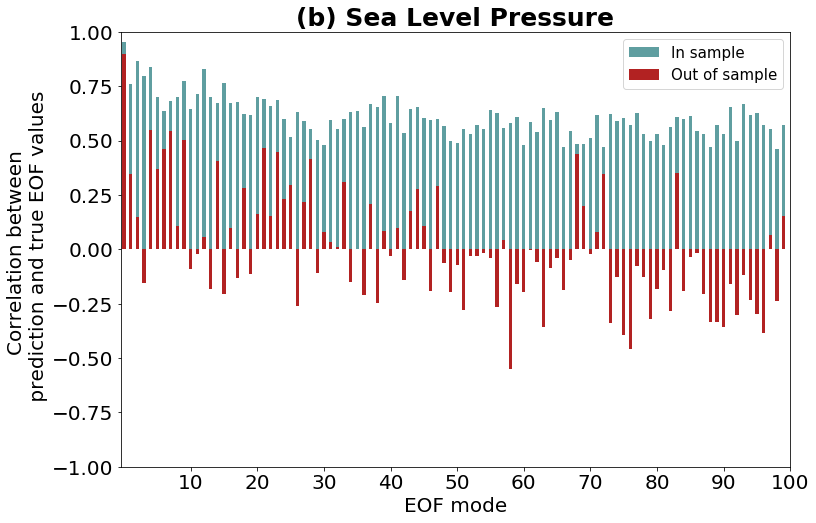

In [11]:
plt.figure(figsize=(12, 8))
    

ax = plt.gca()

df_fig.plot(kind='bar', x='mode', y='r_corr', color = 'cadetblue', alpha=1, linewidth=4, ax=ax)
df_fig.plot(kind='bar', x='mode', y='r_corr_OS', color='firebrick', linewidth=4, ax=ax)
#df_fig.plot(kind='line', x='mode', y='r_corr_pred', color='black', linestyle='dashed', linewidth=1.5, ax=ax)

#ax.axhline(0, color='k', alpha=0.5)
ax.set_ylim(-1, 1)
ax.set_xlabel('EOF mode', size = 20)
ax.set_ylabel('Correlation between \n prediction and true EOF values', size = 20)
ax.set_title('(b) '+TITLE, fontsize=25, 
             fontweight = 'bold')
#ax.set_xscale('log')
ax.tick_params(axis='y', which='major', labelsize=20)
ax.tick_params(axis='x', which='major', labelsize=20)
#ax.yaxis.get_major_ticks()[0].label1.set_visible(False)
ax.set_xticks(range(10, 101, 10))
ax.set_xticklabels(range(10, 101, 10))

plt.xticks(rotation=0)

# Legend .................

legend = [ 'In sample', 'Out of sample']
#ax.get_legend().remove()
ax.legend(legend, fontsize=15) #bbox_to_anchor=(1.05, 1)

# Grid .................
#ax.grid(True, which="both", axis='x')

# Save la figure .................
plt.savefig("/data/home/globc/peatier/figures/Fig2_"+variable+".png", 
            orientation='portrait', bbox_inches='tight', pad_inches=0.1)

# Show la figure .................
plt.show()